<a href="https://colab.research.google.com/github/LynnN-98/Billboard-Hot-100-Prediction/blob/main/Notebook.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

#Introduction
Hi there! Welcome to Lingyu Niu, Tianchen Gu, and Guo Cheng's CIS 545 final project from Fall 2021. 

Throughout this notebook, we hope to build a model that predicts the changes of songs’ ranking from the Billboard Hot 100. We will use the following datasets: A) “Billboard hot 100 dataset”, which includes features such as artist name, song name, and week id; B) “Pitchfork Review dataset”, which contains features like score, review content, album name, and artist name; C) “Wikipedia dataset”, which aggregates the artists’ information, such as their birthdate and birthplace; and D) “Audio features dataset”, which includes detailed audio information of individual song track. 

We intended to obtain the first two datasets by crawling the Billboard and Pitchfork websites using “beautiful soup”. After a lot of efforts, we found that the crawling results are too messy to be used for analysis and modeling, so we directly used the data sets on GitHub and kaggle. As for the “Wikipedia dataset” and “Audio features dataset”, we apply the method learned in the Data Acquisition lecture and recitation 3 on Spotify API respectively.

Let's begin!

# Before running... 
For this part, We refer to the sample project to facilitate those who want to run this notebook by themselves.

## Save data in your own private google drive

First, you need to create a shortcut of the datasets in your private drive. Please follow the steps below:

1.  Click on this link. You may need to request access to this google drive of our team. [link for the drive](https://drive.google.com/drive/u/0/folders/0AHvAYZ5UStiYUk9PVA).
2.  You will see three files in the folder. Right-click and select "Add shortcut to drive". 
3.  Choose "MyDrive" in the pop-up options and click "Add ShortCut".

After finishing your session, you may delete the "CIS545_final" folder from your private google drive.  




## Data Downloading
- Using Google API Client Library for Python, we download media resources from google drive to the notebook space.


In [ ]:
# download data set from server
# authenticate the user 
from google.colab import auth
auth.authenticate_user()
from googleapiclient.discovery import build
drive_service = build('drive', 'v3')
import io
import os
from googleapiclient.http import MediaIoBaseDownload
def download_file(fn, file_id):
    request = drive_service.files().get_media(fileId=file_id)
    downloaded = io.BytesIO()
    downloader = MediaIoBaseDownload(downloaded, request)
    done = False
    while done is False:
        # _ is a placeholder for a progress object that we ignore.
        # (Our file is small, so we skip reporting progress.)
        _, done = downloader.next_chunk()
    downloaded.seek(0)
    folder = fn.split('/')
    if len(folder) > 1:
        os.makedirs(folder[0], exist_ok=True)
    with open(fn, 'wb') as f:
        f.write(downloaded.read())

### Download Datasets For Project
Datasets that we decided to use are as following:  
*   Hot_Stuff.csv
*   Hot_100_Audio_Features.xlsx
*   review_db.sqlite

In [ ]:
# dict key: file id (extract from the file link) --> file name 
id_to_fn ={
'1RLq-UtSj0dxdgbXqufmzk_-Lc9JtwUZ5': 'Hot_Stuff.csv',
'1ngfOkyOmVGp3ixTTpQPCQj0tJRpUQdX7': 'Hot_100_Audio_Features.xlsx',
'1RlIRkOvBJgdp_J5wp8nVezebkvGBUM1L': 'review_db.sqlite'
}
# download all files into the vm
for fid, fn in id_to_fn.items():
    print("Downloading %s from %s" % (fn, fid))
    download_file(fn, fid)

### Preprocessing Pitchfork Review Dataset 
The“Pitchfork Review dataset”is in sqilite format. We connect it to the out local database and extract the tables from it.

In [ ]:
import sqlite3
import pandas as pd

mydb = sqlite3.connect('/content/review_db.sqlite')
cursor = mydb.cursor()
cursor.execute("select name from sqlite_master where type='table';")
tables = cursor.fetchall()
print(tables)

[('reviews',), ('artists',), ('genres',), ('labels',), ('years',), ('content',)]


In [ ]:
df_reviews= pd.read_sql("select * from reviews",con=mydb)
df_reviews.head(5)

,reviewid,title,artist,url,score,best_new_music,author,author_type,pub_date,pub_weekday,pub_day,pub_month,pub_year
0,22703,mezzanine,massive attack,http://pitchfork.com/reviews/albums/22703-mezz...,9.3,0,nate patrin,contributor,2017-01-08,6,8,1,2017
1,22721,prelapsarian,krallice,http://pitchfork.com/reviews/albums/22721-prel...,7.9,0,zoe camp,contributor,2017-01-07,5,7,1,2017
2,22659,all of them naturals,uranium club,http://pitchfork.com/reviews/albums/22659-all-...,7.3,0,david glickman,contributor,2017-01-07,5,7,1,2017
3,22661,first songs,"kleenex, liliput",http://pitchfork.com/reviews/albums/22661-firs...,9.0,1,jenn pelly,associate reviews editor,2017-01-06,4,6,1,2017
4,22725,new start,taso,http://pitchfork.com/reviews/albums/22725-new-...,8.1,0,kevin lozano,tracks coordinator,2017-01-06,4,6,1,2017


# Data Extraction & Cleaning

## *Billboard* hot 100 Data Extraction & Cleaning


*   We extracted the “Billboard hot 100 dataset”, which includes features such as artist name, song name, and week id using beautiful soup.


## Audio Features Data Scraping

For this part, We refer to Recitation 3 to use the Python library built on top of the [Spotify Web API](https://developer.spotify.com/documentation/web-api/). However, different from the recitation project, we need to scrape the audio features of all the songs in the "Billboard hot 100 dataset", rather than the playlist in our Spotify account. Obviously, there is no ready-made playlist including all songs from 1958 to the present. To overcome this difficulty, we did the following work:
*   Use the API [billboard.py](https://github.com/guoguo12/billboard-charts) to access weekly Billboard Hot 100 Charts.
*   Extract the song names and performer names from billboard music charts.
*   Use the `get_spotify_id()` with the help of [spotify](https://spotipy.readthedocs.io/en/2.7.0/) to convert these names to spotify track id.
*   Apply the `get_audio_features_from_tracks()` to get the audio features of these tracks.

In [ ]:
#your spotify username
username = "Lynn Niu" #enter Spotify username here (if you used Facebook Login, it should be your Facebook User)

### Importing Packages

These are some of the packages that we will be using within this part: 
1. `billboard.py`: a Python API for accessing music charts from Billboard.com.

2. `spotipy.oauth2`: grants access the End User to the protected resources
3. `spotipy.util`: get user authorization to read the tracks with built in function

In [ ]:
#installing packages
!pip3 install 'spotipy==2.15'
!pip install billboard.py

#importing packages
import billboard
import pandas as pd
import spotipy
import spotipy.oauth2 as oauth2
from spotipy.oauth2 import SpotifyOAuth
import spotipy.util as util

### Helper Function
* Function to extract songs, artists and their ids for a target week (represented by the date of Saturday that week).
* Function to convert song and artist name to track id, which can be processed by Spotify API.
* Function to get audio features of a spotify track
* Function to combine the song information on billboard chart and the audio features on Spotify

In [ ]:
def get_chart(date):
  df = pd.DataFrame(columns=["song", "artist"])
  chart = billboard.ChartData('hot-100', date=start_date.strftime('%Y-%m-%d'))
  song_list = [chart[i].title for i in range(100)]
  artist_list = [chart[i].artist for i in range(100)]
  df["song"] = song_list
  df["artist"] = artist_list
  song_ids, artist_ids = get_spotify_id(chart)
  df["song_id"] = song_ids
  df["artist_id"] = artist_ids
  return df

def get_spotify_id(songs):
    song_ids = []
    artist_ids = []
    
    for i in range(100):
      try:
        song = songs[i].title
        artist = songs[i].artist
        query = sp.search(q = f'artist:{artist} track:{song}', type = 'track',limit=1)
        song_uri = query['tracks']['items'][0]['uri']
        artist_uri = query['tracks']['items'][0]['artists'][0]['uri']
        song_ids.append(song_uri)
        artist_ids.append(artist_uri)
      except:
        song_ids.append('NA')
        artist_ids.append('NA')
        
    return song_ids, artist_ids

def get_audio_features(song_list):
    cols = ['danceability', 'energy', 'key', 'loudness', 'mode',
             'speechiness', 'acousticness', 'instrumentalness', 'liveness',
              'valence', 'tempo', 'type', 'id', 'uri', 'track_href', 'analysis_url',
               'duration_ms', 'time_signature']
    df = pd.DataFrame(columns = cols)
    for song in song_list:
        query = sp.audio_features(song)[0]
        new_row = pd.DataFrame(query,index = [0])
        df = pd.concat([df,new_row])
    df = df.reset_index(drop=True)
    return df

def get_hotweek(date):  
  chart_df = get_chart(date)
  track_ids = chart_df.iloc[:, 2].values.tolist()  
  audio_features_df = get_audio_features(track_ids)  
  df = pd.concat([chart_df, audio_features_df], axis=1)
  return df

### Spotify API Extraction

If you wanna run this part on your own, please firstly set the client_id and client_serect environment variables referring to this [link](https://cran.r-project.org/web/packages/spotidy/vignettes/Connecting-with-the-Spotify-API.html).

Then, run the function below, **click on the link that appears**. After logging into your account and authenticating the notebook, you will be redirected to what appears to be Google BUT the URL will contain the redirect info, so **copy the URL from the Google page back into the textbox prompt**.

In [ ]:
#setting up spotipy api

import types
from six.moves.urllib_parse import urlparse, parse_qsl

# your client id and secret in the Spotify developer dashboard
client_id = 'a088688b87fd4dd49cb4d58f29745003'
client_secret = 'ed7fa6e25bc940f39e6788ac860752fe'

scope = 'user-top-read user-library-read playlist-read-private user-read-recently-played'

redirect_uri='https://www.google.com'


my_auth = SpotifyOAuth(client_id=client_id, client_secret=client_secret,
                                               redirect_uri=redirect_uri,
                                               scope=scope, username=username)
def _get_auth_response_interactive(self, open_browser=True):
        if not open_browser:
            self._open_auth_url()
            prompt = "Enter the URL you were redirected to: "
        else:
            url = self.get_authorize_url()
            prompt = (
                "Go to the following URL: {}\n"
                "Enter the URL you were redirected to: ".format(url)
            )
        response = self._get_user_input(prompt)
        state, code = SpotifyOAuth.parse_auth_response_url(response)
        if self.state is not None and self.state != state:
            raise SpotifyStateError(self.state, state)
        return code

my_auth._get_auth_response_interactive = types.MethodType(_get_auth_response_interactive, my_auth)

sp = spotipy.Spotify(auth_manager=my_auth)

results = sp.current_user_saved_tracks()
for idx, item in enumerate(results['items']):
    track = item['track']
    print(idx, track['artists'][0]['name'], " – ", track['name'])

Couldn't read cache at: .cache-Lynn Niu


Go to the following URL: https://accounts.spotify.com/authorize?client_id=a088688b87fd4dd49cb4d58f29745003&response_type=code&redirect_uri=https%3A%2F%2Fwww.google.com&scope=playlist-read-private+user-library-read+user-read-recently-played+user-top-read
Enter the URL you were redirected to: https://www.google.com/?code=AQALmWYTkXW4XuUxXEAm24s4G1nRa-jOxnuM5vCH7uTkIptouinFvvinvZrlESb4Eg_gQhWsrsJnp_qnieLLENcKHc51tncVgio11KGi8jtZuCr6gcl7dLNdKPJNSXiWfE96YSRe98bMJ51brsIclLpQl09rDWeY4yFpRcOTQEolDKNXLyqTzFTUeqoQSQST_XJirJEvlODertECPB_GFvmdUYOwIIQfrikoEy__MldYbYbSp1MhHQ1Crna6R3x5zotH-x9NR_fW-MLQv8A


### Getting the Dataframe

Here we are going to transform the API calls into dataframes and read weekly data in one excel file. The running time is pretty long, roughly 15 hours, as this is a historical weekly data which can be traced back to 1958. If you wanna try running the crawling part, please change the `start_date` and `end_date` to a smaller range. 

During running this part, you will find the `Hot 100 Audio Features.xlsx` file in the notebook file space, which is real-time update and can pause and store breakpoint data at any time. We read the complete file into the data frame`audio_features_df`.

In [ ]:
from openpyxl import load_workbook
import os

if not os.path.exists('Hot 100 Audio Features.xlsx'):
  cols = ["song","artist","song_id","artist_id","danceability","energy","key","loudness","mode","speechiness","acousticness","instrumentalness","liveness","valence","tempo","type","id","uri","track_href","analysis_url","duration_ms","time_signature"]
  d= pd.DataFrame(columns=cols)
  d.to_excel('Hot 100 Audio Features.xlsx', index=False)

In [ ]:
import time

today=datetime.date.today()

start_date = datetime.datetime.strptime("2021-10-11", "%Y-%m-%d")
end_date = datetime.datetime.strptime(today.strftime("%Y-%m-%d"), "%Y-%m-%d")


while start_date < end_date:
  print(start_date)

  df = get_hotweek(start_date)


  df_src = pd.DataFrame(pd.read_excel('Hot 100 Audio Features.xlsx'))
  writer = pd.ExcelWriter('Hot 100 Audio Features.xlsx',engine='openpyxl')
  book=load_workbook('Hot 100 Audio Features.xlsx')
  writer.book = book
  writer.sheets = dict((ws.title, ws) for ws in book.worksheets)
  df_rows = df_src.shape[0] # Get the row numbers of hot_stuff_df

  # Because the size of data sets is too large, 
  # write the data into the aa sheet in Excel, starting from the first empty row
  df.to_excel(writer,startrow=df_rows+1, index=False, header=False)
  writer.save() # save the file to the drive
  print(start_date, 'Scraping completed')

  start_date = start_date + datetime.timedelta(days=7)
  

2021-10-11 00:00:00
2021-10-11 00:00:00 Scraping completed
2021-10-18 00:00:00
2021-10-18 00:00:00 Scraping completed
2021-10-25 00:00:00
2021-10-25 00:00:00 Scraping completed
2021-11-01 00:00:00
2021-11-01 00:00:00 Scraping completed
2021-11-08 00:00:00
2021-11-08 00:00:00 Scraping completed
2021-11-15 00:00:00
2021-11-15 00:00:00 Scraping completed
2021-11-22 00:00:00
2021-11-22 00:00:00 Scraping completed
2021-11-29 00:00:00
2021-11-29 00:00:00 Scraping completed
2021-12-06 00:00:00
2021-12-06 00:00:00 Scraping completed
2021-12-13 00:00:00
2021-12-13 00:00:00 Scraping completed


In [ ]:
import pandas as pd
features_df = pd.read_excel('/content/Hot 100 Audio Features.xlsx')
features_df = features_df.dropna()
features_df.head(5)

,song,artist,song_id,artist_id,danceability,energy,key,loudness,mode,speechiness,acousticness,instrumentalness,liveness,valence,tempo,type,id,uri,track_href,analysis_url,duration_ms,time_signature
2,Fancy Like,Walker Hayes,spotify:track:3ZozFqJJlDBNIm4xqxn2ZD,spotify:artist:7sKxqpSqbIzphAKAhrqvlf,0.649,0.760,1.0,-6.487,1.0,0.0574,0.11400,0.000000,0.3170,0.843,80.018,audio_features,3ZozFqJJlDBNIm4xqxn2ZD,spotify:track:3ZozFqJJlDBNIm4xqxn2ZD,https://api.spotify.com/v1/tracks/3ZozFqJJlDBN...,https://api.spotify.com/v1/audio-analysis/3Zoz...,161853.0,4.0
4,Bad Habits,Ed Sheeran,spotify:track:3rmo8F54jFF8OgYsqTxm5d,spotify:artist:6eUKZXaKkcviH0Ku9w2n3V,0.807,0.893,11.0,-3.745,0.0,0.0347,0.04510,0.000028,0.3660,0.537,126.011,audio_features,3rmo8F54jFF8OgYsqTxm5d,spotify:track:3rmo8F54jFF8OgYsqTxm5d,https://api.spotify.com/v1/tracks/3rmo8F54jFF8...,https://api.spotify.com/v1/audio-analysis/3rmo...,230747.0,4.0
5,Good 4 U,Olivia Rodrigo,spotify:track:4ZtFanR9U6ndgddUvNcjcG,spotify:artist:1McMsnEElThX1knmY4oliG,0.563,0.664,9.0,-5.044,1.0,0.1540,0.33500,0.000000,0.0849,0.688,166.928,audio_features,4ZtFanR9U6ndgddUvNcjcG,spotify:track:4ZtFanR9U6ndgddUvNcjcG,https://api.spotify.com/v1/tracks/4ZtFanR9U6nd...,https://api.spotify.com/v1/audio-analysis/4ZtF...,178147.0,4.0
7,Levitating,Dua Lipa,spotify:track:5nujrmhLynf4yMoMtj8AQF,spotify:artist:6M2wZ9GZgrQXHCFfjv46we,0.702,0.825,6.0,-3.787,0.0,0.0601,0.00883,0.000000,0.0674,0.915,102.977,audio_features,5nujrmhLynf4yMoMtj8AQF,spotify:track:5nujrmhLynf4yMoMtj8AQF,https://api.spotify.com/v1/tracks/5nujrmhLynf4...,https://api.spotify.com/v1/audio-analysis/5nuj...,203064.0,4.0
10,Shivers,Ed Sheeran,spotify:track:50nfwKoDiSYg8zOCREWAm5,spotify:artist:6eUKZXaKkcviH0Ku9w2n3V,0.788,0.859,2.0,-2.724,1.0,0.0856,0.28100,0.000000,0.0424,0.822,141.020,audio_features,50nfwKoDiSYg8zOCREWAm5,spotify:track:50nfwKoDiSYg8zOCREWAm5,https://api.spotify.com/v1/tracks/50nfwKoDiSYg...,https://api.spotify.com/v1/audio-analysis/50nf...,207853.0,4.0


## Performer Wikipedia Data Scraping

For this part, We have encountered complex problems in data processing, mainly including the following points:
* To get the crawling list, we firstly need to get all the performers' name in the 
Billboard hot 100 dataset. However, the data is highly noisy as there are performors who featuring or singing with others in one song. 
* The information we wanna extract from the "wiki table" includes the date and place. But what for the group, band and chorus performers?

In [ ]:
import requests
from lxml import etree
import re
import pandas as pd
# For fetching remote data
import urllib
import urllib.request

### Acquiring Performers' Name List

In order to take out multiple names from the same row, we found the following cases:
1. Names linked by commas, &, /, +, parentheses, etc.
2. Names linked by words such as with, and, featuring, starring with, etc.
3. other more complex cases, when the crawling address cannot be reached.


In [ ]:
df =pd.read_csv("Hot_Stuff.csv")
df.loc[df["Performer"].str.contains('&')]['Performer'].drop_duplicates().to_csv("&.csv")
df.loc[:,'Performer'][df.loc[df["Performer"].str.contains("\(Featuring|\(with|\(With" )].index] \
=  df.loc[df["Performer"].str.contains("\(Featuring|\(with|\(With" )]['Performer'].str.replace("\)","")
df.loc[df["Performer"].str.contains("\+")]

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:3: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



,url,WeekID,Week Position,Song,Performer,SongID,Instance,Previous Week Position,Peak Position,Weeks on Chart
508,http://www.billboard.com/charts/hot-100/1986-0...,5/10/1986,17,All I Need Is A Miracle,Mike + The Mechanics,All I Need Is A MiracleMike + The Mechanics,1,21.0,17,8
996,https://www.billboard.com/charts/hot-100/2019-...,10/19/2019,4,"10,000 Hours",Dan + Shay & Justin Bieber,"10,000 HoursDan + Shay & Justin Bieber",1,NaN,4,1
1902,https://www.billboard.com/charts/hot-100/2021-...,5/8/2021,60,Botella Tras Botella,Gera MX + Christian Nodal,Botella Tras BotellaGera MX + Christian Nodal,1,NaN,60,1
2946,http://www.billboard.com/charts/hot-100/1996-0...,8/3/1996,77,All I See,A+,All I SeeA+,1,NaN,77,1
4576,http://www.billboard.com/charts/hot-100/1994-0...,7/30/1994,64,Do You Wanna Get Funky,C+C Music Factory,Do You Wanna Get FunkyC+C Music Factory,1,NaN,64,1
...,...,...,...,...,...,...,...,...,...,...
325833,https://www.billboard.com/charts/hot-100/2021-...,5/8/2021,79,Glad You Exist,Dan + Shay,Glad You ExistDan + Shay,1,63.0,63,12
326290,http://www.billboard.com/charts/hot-100/1992-0...,1/25/1992,99,Just A Touch Of Love,C+C Music Factory Presents Zelma Davis,Just A Touch Of LoveC+C Music Factory Presents...,1,76.0,50,12
326388,http://www.billboard.com/charts/hot-100/2009-1...,12/19/2009,1,Empire State Of Mind,Jay-Z + Alicia Keys,Empire State Of MindJay-Z + Alicia Keys,1,1.0,1,13
326403,http://www.billboard.com/charts/hot-100/1991-0...,2/9/1991,1,Gonna Make You Sweat (Everybody Dance Now),C+C Music Factory,Gonna Make You Sweat (Everybody Dance Now)C+C ...,1,2.0,1,13


In [ ]:
df.loc[df["Performer"].str.contains(" And ")].index

Int64Index([   176,    218,    239,    391,    395,    560,    563,    572,
               585,    964,
            ...
            327522, 327585, 327599, 327625, 327664, 327742, 327743, 327786,
            327850, 327892],
           dtype='int64', length=7061)

In [ ]:
df.loc[df["Performer"].str.contains("\+")]

,url,WeekID,Week Position,Song,Performer,SongID,Instance,Previous Week Position,Peak Position,Weeks on Chart
508,http://www.billboard.com/charts/hot-100/1986-0...,5/10/1986,17,All I Need Is A Miracle,Mike + The Mechanics,All I Need Is A MiracleMike + The Mechanics,1,21.0,17,8
996,https://www.billboard.com/charts/hot-100/2019-...,10/19/2019,4,"10,000 Hours",Dan + Shay & Justin Bieber,"10,000 HoursDan + Shay & Justin Bieber",1,NaN,4,1
1902,https://www.billboard.com/charts/hot-100/2021-...,5/8/2021,60,Botella Tras Botella,Gera MX + Christian Nodal,Botella Tras BotellaGera MX + Christian Nodal,1,NaN,60,1
2946,http://www.billboard.com/charts/hot-100/1996-0...,8/3/1996,77,All I See,A+,All I SeeA+,1,NaN,77,1
4576,http://www.billboard.com/charts/hot-100/1994-0...,7/30/1994,64,Do You Wanna Get Funky,C+C Music Factory,Do You Wanna Get FunkyC+C Music Factory,1,NaN,64,1
...,...,...,...,...,...,...,...,...,...,...
325833,https://www.billboard.com/charts/hot-100/2021-...,5/8/2021,79,Glad You Exist,Dan + Shay,Glad You ExistDan + Shay,1,63.0,63,12
326290,http://www.billboard.com/charts/hot-100/1992-0...,1/25/1992,99,Just A Touch Of Love,C+C Music Factory Presents Zelma Davis,Just A Touch Of LoveC+C Music Factory Presents...,1,76.0,50,12
326388,http://www.billboard.com/charts/hot-100/2009-1...,12/19/2009,1,Empire State Of Mind,Jay-Z + Alicia Keys,Empire State Of MindJay-Z + Alicia Keys,1,1.0,1,13
326403,http://www.billboard.com/charts/hot-100/1991-0...,2/9/1991,1,Gonna Make You Sweat (Everybody Dance Now),C+C Music Factory,Gonna Make You Sweat (Everybody Dance Now)C+C ...,1,2.0,1,13


In [ ]:
df["Performer"] = df["Performer"].str.replace\
("\(Featuring|\(with|\(featuring | x | featuring | Featuring |\(With| And | \+ | With |/|, |\sX\s[A-Za-z]","&")
df.loc[df["Performer"].str.contains("&")]

,url,WeekID,Week Position,Song,Performer,SongID,Instance,Previous Week Position,Peak Position,Weeks on Chart
26,http://www.billboard.com/charts/hot-100/1974-0...,7/13/1974,90,Don't Knock My Love,Diana Ross & Marvin Gaye,Don't Knock My LoveDiana Ross & Marvin Gaye,1,NaN,90,1
27,http://www.billboard.com/charts/hot-100/1974-0...,7/20/1974,76,Don't Knock My Love,Diana Ross & Marvin Gaye,Don't Knock My LoveDiana Ross & Marvin Gaye,1,90.0,76,2
28,http://www.billboard.com/charts/hot-100/1974-0...,7/27/1974,64,Don't Knock My Love,Diana Ross & Marvin Gaye,Don't Knock My LoveDiana Ross & Marvin Gaye,1,76.0,64,3
29,http://www.billboard.com/charts/hot-100/1974-0...,8/3/1974,53,Don't Knock My Love,Diana Ross & Marvin Gaye,Don't Knock My LoveDiana Ross & Marvin Gaye,1,64.0,53,4
30,http://www.billboard.com/charts/hot-100/1974-0...,8/10/1974,49,Don't Knock My Love,Diana Ross & Marvin Gaye,Don't Knock My LoveDiana Ross & Marvin Gaye,1,53.0,49,5
...,...,...,...,...,...,...,...,...,...,...
327869,http://www.billboard.com/charts/hot-100/2010-0...,5/15/2010,21,I Made It (Cash Money Heroes),Kevin Rudolf&Birdman&Jay Sean&& Lil Wayne,I Made It (Cash Money Heroes)Kevin Rudolf Feat...,1,23.0,21,13
327873,https://www.billboard.com/charts/hot-100/2018-...,5/19/2018,21,Friends,Marshmello & Anne-Marie,FriendsMarshmello & Anne-Marie,1,25.0,21,13
327878,http://www.billboard.com/charts/hot-100/1987-0...,5/16/1987,22,I Knew You Were Waiting (For Me),Aretha Franklin & George Michael,I Knew You Were Waiting (For Me)Aretha Frankli...,1,10.0,1,13
327892,http://www.billboard.com/charts/hot-100/1981-0...,5/23/1981,22,I Can't Stand It,Eric Clapton&His Band,I Can't Stand ItEric Clapton And His Band,1,12.0,10,13


In [ ]:
df_name=df['Performer'].str.split('&',expand=True)
df_name

,0,1,2,3,4,5,6,7,8,9
0,Patty Duke,None,None,None,None,None,None,None,None,None
1,Patty Duke,None,None,None,None,None,None,None,None,None
2,Patty Duke,None,None,None,None,None,None,None,None,None
3,Patty Duke,None,None,None,None,None,None,None,None,None
4,Patty Duke,None,None,None,None,None,None,None,None,None
...,...,...,...,...,...,...,...,...,...,...
327890,Ariana Grande,None,None,None,None,None,None,None,None,None
327891,Rose Royce,None,None,None,None,None,None,None,None,None
327892,Eric Clapton,His Band,None,None,None,None,None,None,None,None
327893,Al Green,None,None,None,None,None,None,None,None,None


In [ ]:
df_name=df_name.stack()
df_name=df_name.reset_index(level=1,drop=True)
df_name

0           Patty Duke
1           Patty Duke
2           Patty Duke
3           Patty Duke
4           Patty Duke
              ...     
327892    Eric Clapton
327892        His Band
327893        Al Green
327894         Maluma 
327894      The Weeknd
Length: 402974, dtype: object

In [ ]:
df_name =df_name.drop_duplicates()
df_name = df_name.str.lstrip()
df_name.drop_duplicates(inplace=True)
df_name[df_name.str.contains("/")]

Series([], dtype: object)

In [ ]:
names = []
for name in df_name:
    if len(df[df['Performer']==name])==0:
        names.append(name)

In [ ]:
print(len(names))

2940


In [ ]:
df_name[df_name.str.contains(" Co-Starring ")]

4042            Ludacris Co-Starring T-Pain
18782        Ludacris Co-Starring Lil Wayne
132787    Ludacris Co-Starring Chris Brown 
dtype: object

In [ ]:
df_name = df_name.str.replace(" Co-Starring ","to be expand")
df_name=df_name.str.split("to be expand",expand=True)
df_name = df_name.stack()
df_name = df_name.str.rstrip()
df_name = df_name.str.lstrip()
df_name = df_name.reset_index(level=1,drop=True)
df_name.drop_duplicates(inplace=True)
df_name = df_name.to_frame()
df_name=df_name.rename(columns = {0:'performer'})
df_name.head(10)

,performer
0,Patty Duke
8,Teddy Pendergrass
14,Wilson Pickett
26,Diana Ross
26,Marvin Gaye
35,Bill Medley
39,Linda Ronstadt
39,Aaron Neville
65,Cinderella
87,Norah Jones


### Extracting Structured Fields
After getting a relatively clean name list, we construct a list of performer web pages. For this, we need to take the names and do a bit of tweaking, for example adding underscores instead of spaces.

In [ ]:
crawl_list = []
for item in set(df_name['performer']):
  crawl_list.append('https://en.wikipedia.org/wiki/' + item.replace(' ','_'))

In [ ]:
# Use urllib.urlopen to crawl all pages in crawl_list, and store the response of the page
# in list pages 

pages = []

for url in crawl_list[0:100]:
    page = url.split("/")[-1] #extract the person name at the end of the url
    print('Looking at file %s' % page)

    # An issue: some of the accent characters won't work.  We need to convert them
    # into an HTML URL.  We'll split the URL, then use "parse.quote" to change
    # the structure, then re-form the URL
    url_list = list(urllib.parse.urlsplit(url))
    url_list[2] = urllib.parse.quote(url_list[2])
    url_ascii = urllib.parse.urlunsplit(url_list)
    try:
      response = urllib.request.urlopen((url_ascii))
      #Save page and url for later use.
      pages.append(response)
    except urllib.error.URLError as e:
      print(e.reason)


Looking at file 
Looking at file White_Lion
Looking at file The_Rationals
Looking at file Garry_Mills
Looking at file Placido_Domingo
Looking at file Relient_K
Looking at file Bob_Crewe
Looking at file Eddie_Cochran
Looking at file Samantha_Fox
Looking at file O.C.
Looking at file Yvonne
Looking at file Penny_Mclean
Not Found
Looking at file Johnny_Adams
Looking at file Brotherhood_Of_Man
Looking at file Lil_Xan
Looking at file Pure_Sugar
Not Found
Looking at file Miguel_Rios
Looking at file Michael_Murphey
Looking at file Diamond_Rio
Looking at file Lou_Donaldson
Looking at file T'Pau
Looking at file True_Image
Looking at file Sherhonda_Gaulden
Not Found
Looking at file DJ_Frank_E
Looking at file The_G-Clefs
Looking at file KAI
Looking at file Ana
Looking at file The_Tuesdays
Looking at file Suzi_Quatro
Looking at file Lucy_Hale
Looking at file Supertramp
Looking at file Ashanti
Looking at file Hagood_Hardy
Looking at file Artists_For_Haiti
Not Found
Looking at file C.W._McCall
Lookin

### Populating the Table with performers

We use lxml.etree.HTML(...) on the HTML content of each page to get a DOM tree that can be processed via XPath to extract information. For individual performer, we extract the birth date, birth city, birth country, first active year. For group performer, we extract their origin city, country, and the start active year.
We check that the HTML content has a table of type `vcard`,and then extract the `bday`, `birthplace` and other information.  If there is no target text, the value is stored as Null. 

In [ ]:
headers = {
    'user-agent': 'Mozilla/5.0 (Windows NT 10.0; Win64; x64) AppleWebKit/537.36 (KHTML, like Gecko) Chrome/96.0.4664.45 Safari/537.36'
}
count = 0
list5 = []
name_list = []
for name in set(df_name['performer']):
  name_list.append(name.replace(' ','_'))
for i in range(0,100):
  try:
    print(f"======Scraping the NO.{str(i)} item======")
    name = name_list[i]
    url = f'https://en.wikipedia.org/wiki/{name}'
    # print(url)
    response = requests.get(url,headers=headers,verify=False)
    parser = etree.HTML(response.text)
    response.close()
    year = parser.xpath('//table[@class="infobox biography vcard"]/tbody/tr[3]/td//div[@class="birthplace"]//text()')
    yyear = parser.xpath('//table[@class="infobox biography vcard"]/tbody/tr[3]/td//span[@class="bday"]//text()')
    years = ''.join(year).split(',')
    list1 = parser.xpath('//table[@class="infobox biography vcard"]/tbody/tr')
    list2 = parser.xpath('//table[@class="infobox vcard plainlist"]/tbody/tr')
    if list1:
      print('list1')
      for ls in list1:
        if ls:
          title = ls.xpath('./th//text()')
          # print(title)
          if len(title)!=0 and title[0] == 'Years\xa0active':
            # print("true")
            yar = ls.xpath('./td//text()')[0][0:4]
    else:
      print('list2')
      for ls in list2:
        if ls:
          title = ls.xpath('./th//text()')
          # print(title)
          if len(title)!=0 and title[0] == 'Years active':
            # print(title)
            yar = ls.xpath('./td//text()')[0][0:4]
    if year:
      dict1 = {}
      dict1['active'] = yar
      dict1['city'] = years[-2]
      dict1['country'] = years[-1].replace(',','')
      if yyear:
        dict1['years'] = yyear[0][0:4]
      else:
        dict1['years'] = ''
      print(dict1)
    else:
      dict1 = {}
      das = parser.xpath(
          '//table[@class="infobox vcard plainlist"]/tbody/tr[4]/td//text()')
      dict1['city'] = das[0]
      dict1['country'] = das[1].replace(',','')
      dict1['active'] = yar
      dict1['years'] = ''
      print(dict1)
  except Exception as e:
    print(e)
    name = crawl_list[i]
    url = f'https://en.wikipedia.org/wiki/{name}'
    print(url)
    list5.append(url)
    count = count + 1
    continue
print(list5)

======Scraping the NO.0 item======
list2
list index out of range
https://en.wikipedia.org/wiki/https://en.wikipedia.org/wiki/
======Scraping the NO.1 item======


/usr/local/lib/python3.7/dist-packages/urllib3/connectionpool.py:847: InsecureRequestWarning:

Unverified HTTPS request is being made. Adding certificate verification is strongly advised. See: https://urllib3.readthedocs.io/en/latest/advanced-usage.html#ssl-warnings

/usr/local/lib/python3.7/dist-packages/urllib3/connectionpool.py:847: InsecureRequestWarning:

Unverified HTTPS request is being made. Adding certificate verification is strongly advised. See: https://urllib3.readthedocs.io/en/latest/advanced-usage.html#ssl-warnings

/usr/local/lib/python3.7/dist-packages/urllib3/connectionpool.py:847: InsecureRequestWarning:

Unverified HTTPS request is being made. Adding certificate verification is strongly advised. See: https://urllib3.readthedocs.io/en/latest/advanced-usage.html#ssl-warnings

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:35: FutureWarning:

The behavior of this method will change in future versions. Use specific 'len(elem)' or 'elem is not None' test ins

list2
{'city': 'Copenhagen', 'country': ' Danmark. ', 'active': '1983', 'years': ''}
======Scraping the NO.2 item======
list2
list index out of range
https://en.wikipedia.org/wiki/https://en.wikipedia.org/wiki/The_Rationals
======Scraping the NO.3 item======
list2
list index out of range
https://en.wikipedia.org/wiki/https://en.wikipedia.org/wiki/Garry_Mills
======Scraping the NO.4 item======


/usr/local/lib/python3.7/dist-packages/urllib3/connectionpool.py:847: InsecureRequestWarning:

Unverified HTTPS request is being made. Adding certificate verification is strongly advised. See: https://urllib3.readthedocs.io/en/latest/advanced-usage.html#ssl-warnings

/usr/local/lib/python3.7/dist-packages/urllib3/connectionpool.py:847: InsecureRequestWarning:

Unverified HTTPS request is being made. Adding certificate verification is strongly advised. See: https://urllib3.readthedocs.io/en/latest/advanced-usage.html#ssl-warnings

/usr/local/lib/python3.7/dist-packages/urllib3/connectionpool.py:847: InsecureRequestWarning:

Unverified HTTPS request is being made. Adding certificate verification is strongly advised. See: https://urllib3.readthedocs.io/en/latest/advanced-usage.html#ssl-warnings



list1
{'active': '1957', 'city': 'Madrid', 'country': ' Spain', 'years': '1941'}
======Scraping the NO.5 item======
list2
{'city': 'Canton, Ohio', 'country': ' U.S.', 'active': '1998', 'years': ''}
======Scraping the NO.6 item======


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:26: FutureWarning:

The behavior of this method will change in future versions. Use specific 'len(elem)' or 'elem is not None' test instead.

/usr/local/lib/python3.7/dist-packages/urllib3/connectionpool.py:847: InsecureRequestWarning:

Unverified HTTPS request is being made. Adding certificate verification is strongly advised. See: https://urllib3.readthedocs.io/en/latest/advanced-usage.html#ssl-warnings

/usr/local/lib/python3.7/dist-packages/urllib3/connectionpool.py:847: InsecureRequestWarning:

Unverified HTTPS request is being made. Adding certificate verification is strongly advised. See: https://urllib3.readthedocs.io/en/latest/advanced-usage.html#ssl-warnings



list2
{'city': 'September 11, 2014', 'country': '(2014-09-11)', 'active': '1998', 'years': ''}
======Scraping the NO.7 item======
list2
list index out of range
https://en.wikipedia.org/wiki/https://en.wikipedia.org/wiki/Eddie_Cochran
======Scraping the NO.8 item======


/usr/local/lib/python3.7/dist-packages/urllib3/connectionpool.py:847: InsecureRequestWarning:

Unverified HTTPS request is being made. Adding certificate verification is strongly advised. See: https://urllib3.readthedocs.io/en/latest/advanced-usage.html#ssl-warnings

/usr/local/lib/python3.7/dist-packages/urllib3/connectionpool.py:847: InsecureRequestWarning:

Unverified HTTPS request is being made. Adding certificate verification is strongly advised. See: https://urllib3.readthedocs.io/en/latest/advanced-usage.html#ssl-warnings



list2
list index out of range
https://en.wikipedia.org/wiki/https://en.wikipedia.org/wiki/Samantha_Fox
======Scraping the NO.9 item======
list2
list index out of range
https://en.wikipedia.org/wiki/https://en.wikipedia.org/wiki/O.C.
======Scraping the NO.10 item======
list2
list index out of range
https://en.wikipedia.org/wiki/https://en.wikipedia.org/wiki/Yvonne
======Scraping the NO.11 item======


/usr/local/lib/python3.7/dist-packages/urllib3/connectionpool.py:847: InsecureRequestWarning:

Unverified HTTPS request is being made. Adding certificate verification is strongly advised. See: https://urllib3.readthedocs.io/en/latest/advanced-usage.html#ssl-warnings

/usr/local/lib/python3.7/dist-packages/urllib3/connectionpool.py:847: InsecureRequestWarning:

Unverified HTTPS request is being made. Adding certificate verification is strongly advised. See: https://urllib3.readthedocs.io/en/latest/advanced-usage.html#ssl-warnings

/usr/local/lib/python3.7/dist-packages/urllib3/connectionpool.py:847: InsecureRequestWarning:

Unverified HTTPS request is being made. Adding certificate verification is strongly advised. See: https://urllib3.readthedocs.io/en/latest/advanced-usage.html#ssl-warnings



list2
list index out of range
https://en.wikipedia.org/wiki/https://en.wikipedia.org/wiki/Penny_Mclean
======Scraping the NO.12 item======
list2
list index out of range
https://en.wikipedia.org/wiki/https://en.wikipedia.org/wiki/Johnny_Adams
======Scraping the NO.13 item======


/usr/local/lib/python3.7/dist-packages/urllib3/connectionpool.py:847: InsecureRequestWarning:

Unverified HTTPS request is being made. Adding certificate verification is strongly advised. See: https://urllib3.readthedocs.io/en/latest/advanced-usage.html#ssl-warnings

/usr/local/lib/python3.7/dist-packages/urllib3/connectionpool.py:847: InsecureRequestWarning:

Unverified HTTPS request is being made. Adding certificate verification is strongly advised. See: https://urllib3.readthedocs.io/en/latest/advanced-usage.html#ssl-warnings



list2
list index out of range
https://en.wikipedia.org/wiki/https://en.wikipedia.org/wiki/Brotherhood_Of_Man
======Scraping the NO.14 item======
list2
list index out of range
https://en.wikipedia.org/wiki/https://en.wikipedia.org/wiki/Lil_Xan
======Scraping the NO.15 item======


/usr/local/lib/python3.7/dist-packages/urllib3/connectionpool.py:847: InsecureRequestWarning:

Unverified HTTPS request is being made. Adding certificate verification is strongly advised. See: https://urllib3.readthedocs.io/en/latest/advanced-usage.html#ssl-warnings

/usr/local/lib/python3.7/dist-packages/urllib3/connectionpool.py:847: InsecureRequestWarning:

Unverified HTTPS request is being made. Adding certificate verification is strongly advised. See: https://urllib3.readthedocs.io/en/latest/advanced-usage.html#ssl-warnings



list2
list index out of range
https://en.wikipedia.org/wiki/https://en.wikipedia.org/wiki/Pure_Sugar
======Scraping the NO.16 item======
list2
list index out of range
https://en.wikipedia.org/wiki/https://en.wikipedia.org/wiki/Miguel_Rios
======Scraping the NO.17 item======


/usr/local/lib/python3.7/dist-packages/urllib3/connectionpool.py:847: InsecureRequestWarning:

Unverified HTTPS request is being made. Adding certificate verification is strongly advised. See: https://urllib3.readthedocs.io/en/latest/advanced-usage.html#ssl-warnings

/usr/local/lib/python3.7/dist-packages/urllib3/connectionpool.py:847: InsecureRequestWarning:

Unverified HTTPS request is being made. Adding certificate verification is strongly advised. See: https://urllib3.readthedocs.io/en/latest/advanced-usage.html#ssl-warnings



list2
{'city': ' (', 'country': '1945-03-14', 'active': '1964', 'years': ''}
======Scraping the NO.18 item======
list2
{'city': 'Grizzly River Boys', 'country': 'Tennessee River Boys', 'active': '1982', 'years': ''}
======Scraping the NO.19 item======


/usr/local/lib/python3.7/dist-packages/urllib3/connectionpool.py:847: InsecureRequestWarning:

Unverified HTTPS request is being made. Adding certificate verification is strongly advised. See: https://urllib3.readthedocs.io/en/latest/advanced-usage.html#ssl-warnings

/usr/local/lib/python3.7/dist-packages/urllib3/connectionpool.py:847: InsecureRequestWarning:

Unverified HTTPS request is being made. Adding certificate verification is strongly advised. See: https://urllib3.readthedocs.io/en/latest/advanced-usage.html#ssl-warnings



list2
{'city': ' (', 'country': '1926-11-01', 'active': '1952', 'years': ''}
======Scraping the NO.20 item======


/usr/local/lib/python3.7/dist-packages/urllib3/connectionpool.py:847: InsecureRequestWarning:

Unverified HTTPS request is being made. Adding certificate verification is strongly advised. See: https://urllib3.readthedocs.io/en/latest/advanced-usage.html#ssl-warnings



list2
list index out of range
https://en.wikipedia.org/wiki/https://en.wikipedia.org/wiki/T'Pau
======Scraping the NO.21 item======
list2
list index out of range
https://en.wikipedia.org/wiki/https://en.wikipedia.org/wiki/True_Image
======Scraping the NO.22 item======
list2
list index out of range
https://en.wikipedia.org/wiki/https://en.wikipedia.org/wiki/Sherhonda_Gaulden
======Scraping the NO.23 item======


/usr/local/lib/python3.7/dist-packages/urllib3/connectionpool.py:847: InsecureRequestWarning:

Unverified HTTPS request is being made. Adding certificate verification is strongly advised. See: https://urllib3.readthedocs.io/en/latest/advanced-usage.html#ssl-warnings

/usr/local/lib/python3.7/dist-packages/urllib3/connectionpool.py:847: InsecureRequestWarning:

Unverified HTTPS request is being made. Adding certificate verification is strongly advised. See: https://urllib3.readthedocs.io/en/latest/advanced-usage.html#ssl-warnings

/usr/local/lib/python3.7/dist-packages/urllib3/connectionpool.py:847: InsecureRequestWarning:

Unverified HTTPS request is being made. Adding certificate verification is strongly advised. See: https://urllib3.readthedocs.io/en/latest/advanced-usage.html#ssl-warnings



list2
list index out of range
https://en.wikipedia.org/wiki/https://en.wikipedia.org/wiki/DJ_Frank_E
======Scraping the NO.24 item======
list2
list index out of range
https://en.wikipedia.org/wiki/https://en.wikipedia.org/wiki/The_G-Clefs
======Scraping the NO.25 item======
list2
list index out of range
https://en.wikipedia.org/wiki/https://en.wikipedia.org/wiki/KAI
======Scraping the NO.26 item======


/usr/local/lib/python3.7/dist-packages/urllib3/connectionpool.py:847: InsecureRequestWarning:

Unverified HTTPS request is being made. Adding certificate verification is strongly advised. See: https://urllib3.readthedocs.io/en/latest/advanced-usage.html#ssl-warnings

/usr/local/lib/python3.7/dist-packages/urllib3/connectionpool.py:847: InsecureRequestWarning:

Unverified HTTPS request is being made. Adding certificate verification is strongly advised. See: https://urllib3.readthedocs.io/en/latest/advanced-usage.html#ssl-warnings

/usr/local/lib/python3.7/dist-packages/urllib3/connectionpool.py:847: InsecureRequestWarning:

Unverified HTTPS request is being made. Adding certificate verification is strongly advised. See: https://urllib3.readthedocs.io/en/latest/advanced-usage.html#ssl-warnings



list2
list index out of range
https://en.wikipedia.org/wiki/https://en.wikipedia.org/wiki/Ana
======Scraping the NO.27 item======
list2
list index out of range
https://en.wikipedia.org/wiki/https://en.wikipedia.org/wiki/The_Tuesdays
======Scraping the NO.28 item======


/usr/local/lib/python3.7/dist-packages/urllib3/connectionpool.py:847: InsecureRequestWarning:

Unverified HTTPS request is being made. Adding certificate verification is strongly advised. See: https://urllib3.readthedocs.io/en/latest/advanced-usage.html#ssl-warnings

/usr/local/lib/python3.7/dist-packages/urllib3/connectionpool.py:847: InsecureRequestWarning:

Unverified HTTPS request is being made. Adding certificate verification is strongly advised. See: https://urllib3.readthedocs.io/en/latest/advanced-usage.html#ssl-warnings



list2
list index out of range
https://en.wikipedia.org/wiki/https://en.wikipedia.org/wiki/Suzi_Quatro
======Scraping the NO.29 item======
list1
{'active': '2003', 'city': ' Tennessee', 'country': ' U.S.', 'years': '1989'}
======Scraping the NO.30 item======


/usr/local/lib/python3.7/dist-packages/urllib3/connectionpool.py:847: InsecureRequestWarning:

Unverified HTTPS request is being made. Adding certificate verification is strongly advised. See: https://urllib3.readthedocs.io/en/latest/advanced-usage.html#ssl-warnings

/usr/local/lib/python3.7/dist-packages/urllib3/connectionpool.py:847: InsecureRequestWarning:

Unverified HTTPS request is being made. Adding certificate verification is strongly advised. See: https://urllib3.readthedocs.io/en/latest/advanced-usage.html#ssl-warnings



list2
{'city': 'London', 'country': ' England', 'active': '1970', 'years': ''}
======Scraping the NO.31 item======
list2
list index out of range
https://en.wikipedia.org/wiki/https://en.wikipedia.org/wiki/Ashanti
======Scraping the NO.32 item======
list1
list index out of range
https://en.wikipedia.org/wiki/https://en.wikipedia.org/wiki/Hagood_Hardy
======Scraping the NO.33 item======


/usr/local/lib/python3.7/dist-packages/urllib3/connectionpool.py:847: InsecureRequestWarning:

Unverified HTTPS request is being made. Adding certificate verification is strongly advised. See: https://urllib3.readthedocs.io/en/latest/advanced-usage.html#ssl-warnings

/usr/local/lib/python3.7/dist-packages/urllib3/connectionpool.py:847: InsecureRequestWarning:

Unverified HTTPS request is being made. Adding certificate verification is strongly advised. See: https://urllib3.readthedocs.io/en/latest/advanced-usage.html#ssl-warnings

/usr/local/lib/python3.7/dist-packages/urllib3/connectionpool.py:847: InsecureRequestWarning:

Unverified HTTPS request is being made. Adding certificate verification is strongly advised. See: https://urllib3.readthedocs.io/en/latest/advanced-usage.html#ssl-warnings



list2
list index out of range
https://en.wikipedia.org/wiki/https://en.wikipedia.org/wiki/Artists_For_Haiti
======Scraping the NO.34 item======
list2
{'city': 'Country', 'country': 'outlaw country', 'active': '1944', 'years': ''}
======Scraping the NO.35 item======


/usr/local/lib/python3.7/dist-packages/urllib3/connectionpool.py:847: InsecureRequestWarning:

Unverified HTTPS request is being made. Adding certificate verification is strongly advised. See: https://urllib3.readthedocs.io/en/latest/advanced-usage.html#ssl-warnings

/usr/local/lib/python3.7/dist-packages/urllib3/connectionpool.py:847: InsecureRequestWarning:

Unverified HTTPS request is being made. Adding certificate verification is strongly advised. See: https://urllib3.readthedocs.io/en/latest/advanced-usage.html#ssl-warnings



list2
list index out of range
https://en.wikipedia.org/wiki/https://en.wikipedia.org/wiki/Bun_B
======Scraping the NO.36 item======
list2
list index out of range
https://en.wikipedia.org/wiki/https://en.wikipedia.org/wiki/ustin_Timberlake
======Scraping the NO.37 item======


/usr/local/lib/python3.7/dist-packages/urllib3/connectionpool.py:847: InsecureRequestWarning:

Unverified HTTPS request is being made. Adding certificate verification is strongly advised. See: https://urllib3.readthedocs.io/en/latest/advanced-usage.html#ssl-warnings

/usr/local/lib/python3.7/dist-packages/urllib3/connectionpool.py:847: InsecureRequestWarning:

Unverified HTTPS request is being made. Adding certificate verification is strongly advised. See: https://urllib3.readthedocs.io/en/latest/advanced-usage.html#ssl-warnings

/usr/local/lib/python3.7/dist-packages/urllib3/connectionpool.py:847: InsecureRequestWarning:

Unverified HTTPS request is being made. Adding certificate verification is strongly advised. See: https://urllib3.readthedocs.io/en/latest/advanced-usage.html#ssl-warnings



list2
{'city': 'R&B', 'country': 'pop', 'active': '1984', 'years': ''}
======Scraping the NO.38 item======
list2
list index out of range
https://en.wikipedia.org/wiki/https://en.wikipedia.org/wiki/Sagittarius
======Scraping the NO.39 item======


/usr/local/lib/python3.7/dist-packages/urllib3/connectionpool.py:847: InsecureRequestWarning:

Unverified HTTPS request is being made. Adding certificate verification is strongly advised. See: https://urllib3.readthedocs.io/en/latest/advanced-usage.html#ssl-warnings

/usr/local/lib/python3.7/dist-packages/urllib3/connectionpool.py:847: InsecureRequestWarning:

Unverified HTTPS request is being made. Adding certificate verification is strongly advised. See: https://urllib3.readthedocs.io/en/latest/advanced-usage.html#ssl-warnings



list1
list index out of range
https://en.wikipedia.org/wiki/https://en.wikipedia.org/wiki/Zedd
======Scraping the NO.40 item======
list2
list index out of range
https://en.wikipedia.org/wiki/https://en.wikipedia.org/wiki/Red_Eye
======Scraping the NO.41 item======
list2
list index out of range


/usr/local/lib/python3.7/dist-packages/urllib3/connectionpool.py:847: InsecureRequestWarning:

Unverified HTTPS request is being made. Adding certificate verification is strongly advised. See: https://urllib3.readthedocs.io/en/latest/advanced-usage.html#ssl-warnings

/usr/local/lib/python3.7/dist-packages/urllib3/connectionpool.py:847: InsecureRequestWarning:

Unverified HTTPS request is being made. Adding certificate verification is strongly advised. See: https://urllib3.readthedocs.io/en/latest/advanced-usage.html#ssl-warnings



https://en.wikipedia.org/wiki/https://en.wikipedia.org/wiki/Richie_Furay
======Scraping the NO.42 item======
list2
list index out of range
https://en.wikipedia.org/wiki/https://en.wikipedia.org/wiki/Zombie_Nation
======Scraping the NO.43 item======
list2
list index out of range
https://en.wikipedia.org/wiki/https://en.wikipedia.org/wiki/Go_West
======Scraping the NO.44 item======


/usr/local/lib/python3.7/dist-packages/urllib3/connectionpool.py:847: InsecureRequestWarning:

Unverified HTTPS request is being made. Adding certificate verification is strongly advised. See: https://urllib3.readthedocs.io/en/latest/advanced-usage.html#ssl-warnings

/usr/local/lib/python3.7/dist-packages/urllib3/connectionpool.py:847: InsecureRequestWarning:

Unverified HTTPS request is being made. Adding certificate verification is strongly advised. See: https://urllib3.readthedocs.io/en/latest/advanced-usage.html#ssl-warnings

/usr/local/lib/python3.7/dist-packages/urllib3/connectionpool.py:847: InsecureRequestWarning:

Unverified HTTPS request is being made. Adding certificate verification is strongly advised. See: https://urllib3.readthedocs.io/en/latest/advanced-usage.html#ssl-warnings



list2
list index out of range
https://en.wikipedia.org/wiki/https://en.wikipedia.org/wiki/The_Superbs
======Scraping the NO.45 item======
list2
list index out of range
https://en.wikipedia.org/wiki/https://en.wikipedia.org/wiki/LOCASH
======Scraping the NO.46 item======


/usr/local/lib/python3.7/dist-packages/urllib3/connectionpool.py:847: InsecureRequestWarning:

Unverified HTTPS request is being made. Adding certificate verification is strongly advised. See: https://urllib3.readthedocs.io/en/latest/advanced-usage.html#ssl-warnings

/usr/local/lib/python3.7/dist-packages/urllib3/connectionpool.py:847: InsecureRequestWarning:

Unverified HTTPS request is being made. Adding certificate verification is strongly advised. See: https://urllib3.readthedocs.io/en/latest/advanced-usage.html#ssl-warnings



list2
list index out of range
https://en.wikipedia.org/wiki/https://en.wikipedia.org/wiki/The_Asbury_Jukes
======Scraping the NO.47 item======
list2
list index out of range
https://en.wikipedia.org/wiki/https://en.wikipedia.org/wiki/Sara
======Scraping the NO.48 item======


/usr/local/lib/python3.7/dist-packages/urllib3/connectionpool.py:847: InsecureRequestWarning:

Unverified HTTPS request is being made. Adding certificate verification is strongly advised. See: https://urllib3.readthedocs.io/en/latest/advanced-usage.html#ssl-warnings

/usr/local/lib/python3.7/dist-packages/urllib3/connectionpool.py:847: InsecureRequestWarning:

Unverified HTTPS request is being made. Adding certificate verification is strongly advised. See: https://urllib3.readthedocs.io/en/latest/advanced-usage.html#ssl-warnings



list2
list index out of range
https://en.wikipedia.org/wiki/https://en.wikipedia.org/wiki/Eva_Simons
======Scraping the NO.49 item======
list2
list index out of range
https://en.wikipedia.org/wiki/https://en.wikipedia.org/wiki/Frank_Gallop
======Scraping the NO.50 item======


/usr/local/lib/python3.7/dist-packages/urllib3/connectionpool.py:847: InsecureRequestWarning:

Unverified HTTPS request is being made. Adding certificate verification is strongly advised. See: https://urllib3.readthedocs.io/en/latest/advanced-usage.html#ssl-warnings

/usr/local/lib/python3.7/dist-packages/urllib3/connectionpool.py:847: InsecureRequestWarning:

Unverified HTTPS request is being made. Adding certificate verification is strongly advised. See: https://urllib3.readthedocs.io/en/latest/advanced-usage.html#ssl-warnings



list2
list index out of range
https://en.wikipedia.org/wiki/https://en.wikipedia.org/wiki/Billy_Ocean
======Scraping the NO.51 item======
list2
{'city': ' (', 'country': '1938-04-26', 'active': '1954', 'years': ''}
======Scraping the NO.52 item======


/usr/local/lib/python3.7/dist-packages/urllib3/connectionpool.py:847: InsecureRequestWarning:

Unverified HTTPS request is being made. Adding certificate verification is strongly advised. See: https://urllib3.readthedocs.io/en/latest/advanced-usage.html#ssl-warnings

/usr/local/lib/python3.7/dist-packages/urllib3/connectionpool.py:847: InsecureRequestWarning:

Unverified HTTPS request is being made. Adding certificate verification is strongly advised. See: https://urllib3.readthedocs.io/en/latest/advanced-usage.html#ssl-warnings



list2
list index out of range
https://en.wikipedia.org/wiki/https://en.wikipedia.org/wiki/Scandal
======Scraping the NO.53 item======
list2
{'city': 'Ernest Clayton Walker Jr.', 'country': '[1]', 'active': '1993', 'years': ''}
======Scraping the NO.54 item======


/usr/local/lib/python3.7/dist-packages/urllib3/connectionpool.py:847: InsecureRequestWarning:

Unverified HTTPS request is being made. Adding certificate verification is strongly advised. See: https://urllib3.readthedocs.io/en/latest/advanced-usage.html#ssl-warnings

/usr/local/lib/python3.7/dist-packages/urllib3/connectionpool.py:847: InsecureRequestWarning:

Unverified HTTPS request is being made. Adding certificate verification is strongly advised. See: https://urllib3.readthedocs.io/en/latest/advanced-usage.html#ssl-warnings



list2
list index out of range
https://en.wikipedia.org/wiki/https://en.wikipedia.org/wiki/Geils
======Scraping the NO.55 item======
list2
list index out of range
https://en.wikipedia.org/wiki/https://en.wikipedia.org/wiki/Tamia_Or_Ashanti
======Scraping the NO.56 item======


/usr/local/lib/python3.7/dist-packages/urllib3/connectionpool.py:847: InsecureRequestWarning:

Unverified HTTPS request is being made. Adding certificate verification is strongly advised. See: https://urllib3.readthedocs.io/en/latest/advanced-usage.html#ssl-warnings

/usr/local/lib/python3.7/dist-packages/urllib3/connectionpool.py:847: InsecureRequestWarning:

Unverified HTTPS request is being made. Adding certificate verification is strongly advised. See: https://urllib3.readthedocs.io/en/latest/advanced-usage.html#ssl-warnings



list1
{'active': '1992', 'city': 'New York City', 'country': ' U.S.', 'years': '1980'}
======Scraping the NO.57 item======
list2
list index out of range
https://en.wikipedia.org/wiki/https://en.wikipedia.org/wiki/YFN_Lucci
======Scraping the NO.58 item======


/usr/local/lib/python3.7/dist-packages/urllib3/connectionpool.py:847: InsecureRequestWarning:

Unverified HTTPS request is being made. Adding certificate verification is strongly advised. See: https://urllib3.readthedocs.io/en/latest/advanced-usage.html#ssl-warnings

/usr/local/lib/python3.7/dist-packages/urllib3/connectionpool.py:847: InsecureRequestWarning:

Unverified HTTPS request is being made. Adding certificate verification is strongly advised. See: https://urllib3.readthedocs.io/en/latest/advanced-usage.html#ssl-warnings



list2
list index out of range
https://en.wikipedia.org/wiki/https://en.wikipedia.org/wiki/Rvssian
======Scraping the NO.59 item======
list2
list index out of range
https://en.wikipedia.org/wiki/https://en.wikipedia.org/wiki/Nyla
======Scraping the NO.60 item======


/usr/local/lib/python3.7/dist-packages/urllib3/connectionpool.py:847: InsecureRequestWarning:

Unverified HTTPS request is being made. Adding certificate verification is strongly advised. See: https://urllib3.readthedocs.io/en/latest/advanced-usage.html#ssl-warnings

/usr/local/lib/python3.7/dist-packages/urllib3/connectionpool.py:847: InsecureRequestWarning:

Unverified HTTPS request is being made. Adding certificate verification is strongly advised. See: https://urllib3.readthedocs.io/en/latest/advanced-usage.html#ssl-warnings



list2
list index out of range
https://en.wikipedia.org/wiki/https://en.wikipedia.org/wiki/Peter_Sarstedt
======Scraping the NO.61 item======
list2
list index out of range
https://en.wikipedia.org/wiki/https://en.wikipedia.org/wiki/The_Brooklyn_Bridge
======Scraping the NO.62 item======


/usr/local/lib/python3.7/dist-packages/urllib3/connectionpool.py:847: InsecureRequestWarning:

Unverified HTTPS request is being made. Adding certificate verification is strongly advised. See: https://urllib3.readthedocs.io/en/latest/advanced-usage.html#ssl-warnings

/usr/local/lib/python3.7/dist-packages/urllib3/connectionpool.py:847: InsecureRequestWarning:

Unverified HTTPS request is being made. Adding certificate verification is strongly advised. See: https://urllib3.readthedocs.io/en/latest/advanced-usage.html#ssl-warnings



list2
list index out of range
https://en.wikipedia.org/wiki/https://en.wikipedia.org/wiki/Tobin_Mathews
======Scraping the NO.63 item======
list2
list index out of range
https://en.wikipedia.org/wiki/https://en.wikipedia.org/wiki/Chuck_Willis
======Scraping the NO.64 item======


/usr/local/lib/python3.7/dist-packages/urllib3/connectionpool.py:847: InsecureRequestWarning:

Unverified HTTPS request is being made. Adding certificate verification is strongly advised. See: https://urllib3.readthedocs.io/en/latest/advanced-usage.html#ssl-warnings

/usr/local/lib/python3.7/dist-packages/urllib3/connectionpool.py:847: InsecureRequestWarning:

Unverified HTTPS request is being made. Adding certificate verification is strongly advised. See: https://urllib3.readthedocs.io/en/latest/advanced-usage.html#ssl-warnings



list2
{'city': 'The Scorpions (1962–1963)', 'country': 'The Spectres (1963–1967)', 'active': '1962', 'years': ''}
======Scraping the NO.65 item======
list2
list index out of range
https://en.wikipedia.org/wiki/https://en.wikipedia.org/wiki/Jimmy_Ryser
======Scraping the NO.66 item======


/usr/local/lib/python3.7/dist-packages/urllib3/connectionpool.py:847: InsecureRequestWarning:

Unverified HTTPS request is being made. Adding certificate verification is strongly advised. See: https://urllib3.readthedocs.io/en/latest/advanced-usage.html#ssl-warnings

/usr/local/lib/python3.7/dist-packages/urllib3/connectionpool.py:847: InsecureRequestWarning:

Unverified HTTPS request is being made. Adding certificate verification is strongly advised. See: https://urllib3.readthedocs.io/en/latest/advanced-usage.html#ssl-warnings

/usr/local/lib/python3.7/dist-packages/urllib3/connectionpool.py:847: InsecureRequestWarning:

Unverified HTTPS request is being made. Adding certificate verification is strongly advised. See: https://urllib3.readthedocs.io/en/latest/advanced-usage.html#ssl-warnings



list2
list index out of range
https://en.wikipedia.org/wiki/https://en.wikipedia.org/wiki/Manfred_Mann
======Scraping the NO.67 item======
list1
{'active': '1986', 'city': ' California', 'country': ' U.S.', 'years': '1969'}
======Scraping the NO.68 item======


/usr/local/lib/python3.7/dist-packages/urllib3/connectionpool.py:847: InsecureRequestWarning:

Unverified HTTPS request is being made. Adding certificate verification is strongly advised. See: https://urllib3.readthedocs.io/en/latest/advanced-usage.html#ssl-warnings



list2
list index out of range
https://en.wikipedia.org/wiki/https://en.wikipedia.org/wiki/Bill_Wray
======Scraping the NO.69 item======
list2
list index out of range
https://en.wikipedia.org/wiki/https://en.wikipedia.org/wiki/Gonzalez
======Scraping the NO.70 item======
list2
list index out of range
https://en.wikipedia.org/wiki/https://en.wikipedia.org/wiki/Snuff
======Scraping the NO.71 item======


/usr/local/lib/python3.7/dist-packages/urllib3/connectionpool.py:847: InsecureRequestWarning:

Unverified HTTPS request is being made. Adding certificate verification is strongly advised. See: https://urllib3.readthedocs.io/en/latest/advanced-usage.html#ssl-warnings

/usr/local/lib/python3.7/dist-packages/urllib3/connectionpool.py:847: InsecureRequestWarning:

Unverified HTTPS request is being made. Adding certificate verification is strongly advised. See: https://urllib3.readthedocs.io/en/latest/advanced-usage.html#ssl-warnings

/usr/local/lib/python3.7/dist-packages/urllib3/connectionpool.py:847: InsecureRequestWarning:

Unverified HTTPS request is being made. Adding certificate verification is strongly advised. See: https://urllib3.readthedocs.io/en/latest/advanced-usage.html#ssl-warnings



list2
list index out of range
https://en.wikipedia.org/wiki/https://en.wikipedia.org/wiki/The_Music_Machine
======Scraping the NO.72 item======
list1
list index out of range
https://en.wikipedia.org/wiki/https://en.wikipedia.org/wiki/Yoko_Ono
======Scraping the NO.73 item======


/usr/local/lib/python3.7/dist-packages/urllib3/connectionpool.py:847: InsecureRequestWarning:

Unverified HTTPS request is being made. Adding certificate verification is strongly advised. See: https://urllib3.readthedocs.io/en/latest/advanced-usage.html#ssl-warnings

/usr/local/lib/python3.7/dist-packages/urllib3/connectionpool.py:847: InsecureRequestWarning:

Unverified HTTPS request is being made. Adding certificate verification is strongly advised. See: https://urllib3.readthedocs.io/en/latest/advanced-usage.html#ssl-warnings



list2
{'city': ' (', 'country': '1985-11-21', 'active': '2007', 'years': ''}
======Scraping the NO.74 item======
list2
list index out of range
https://en.wikipedia.org/wiki/https://en.wikipedia.org/wiki/Elton_Anderson
======Scraping the NO.75 item======
list2


/usr/local/lib/python3.7/dist-packages/urllib3/connectionpool.py:847: InsecureRequestWarning:

Unverified HTTPS request is being made. Adding certificate verification is strongly advised. See: https://urllib3.readthedocs.io/en/latest/advanced-usage.html#ssl-warnings

/usr/local/lib/python3.7/dist-packages/urllib3/connectionpool.py:847: InsecureRequestWarning:

Unverified HTTPS request is being made. Adding certificate verification is strongly advised. See: https://urllib3.readthedocs.io/en/latest/advanced-usage.html#ssl-warnings



{'city': ' (', 'country': '1961-06-04', 'active': '1979', 'years': ''}
======Scraping the NO.76 item======
list2
list index out of range
https://en.wikipedia.org/wiki/https://en.wikipedia.org/wiki/Lil_Pump
======Scraping the NO.77 item======


/usr/local/lib/python3.7/dist-packages/urllib3/connectionpool.py:847: InsecureRequestWarning:

Unverified HTTPS request is being made. Adding certificate verification is strongly advised. See: https://urllib3.readthedocs.io/en/latest/advanced-usage.html#ssl-warnings

/usr/local/lib/python3.7/dist-packages/urllib3/connectionpool.py:847: InsecureRequestWarning:

Unverified HTTPS request is being made. Adding certificate verification is strongly advised. See: https://urllib3.readthedocs.io/en/latest/advanced-usage.html#ssl-warnings



list2
list index out of range
https://en.wikipedia.org/wiki/https://en.wikipedia.org/wiki/Exile
======Scraping the NO.78 item======
list2
list index out of range
https://en.wikipedia.org/wiki/https://en.wikipedia.org/wiki/Sarah_Connor
======Scraping the NO.79 item======
list2
{'city': ' (', 'country': '1990-12-31', 'active': '2008', 'years': ''}
======Scraping the NO.80 item======


/usr/local/lib/python3.7/dist-packages/urllib3/connectionpool.py:847: InsecureRequestWarning:

Unverified HTTPS request is being made. Adding certificate verification is strongly advised. See: https://urllib3.readthedocs.io/en/latest/advanced-usage.html#ssl-warnings

/usr/local/lib/python3.7/dist-packages/urllib3/connectionpool.py:847: InsecureRequestWarning:

Unverified HTTPS request is being made. Adding certificate verification is strongly advised. See: https://urllib3.readthedocs.io/en/latest/advanced-usage.html#ssl-warnings

/usr/local/lib/python3.7/dist-packages/urllib3/connectionpool.py:847: InsecureRequestWarning:

Unverified HTTPS request is being made. Adding certificate verification is strongly advised. See: https://urllib3.readthedocs.io/en/latest/advanced-usage.html#ssl-warnings



list2
list index out of range
https://en.wikipedia.org/wiki/https://en.wikipedia.org/wiki/Duke
======Scraping the NO.81 item======
list2
list index out of range
https://en.wikipedia.org/wiki/https://en.wikipedia.org/wiki/The_Searchers
======Scraping the NO.82 item======


/usr/local/lib/python3.7/dist-packages/urllib3/connectionpool.py:847: InsecureRequestWarning:

Unverified HTTPS request is being made. Adding certificate verification is strongly advised. See: https://urllib3.readthedocs.io/en/latest/advanced-usage.html#ssl-warnings

/usr/local/lib/python3.7/dist-packages/urllib3/connectionpool.py:847: InsecureRequestWarning:

Unverified HTTPS request is being made. Adding certificate verification is strongly advised. See: https://urllib3.readthedocs.io/en/latest/advanced-usage.html#ssl-warnings



list2
{'city': 'Country', 'country': ' pop', 'active': '1966', 'years': ''}
======Scraping the NO.83 item======
list2
list index out of range
https://en.wikipedia.org/wiki/https://en.wikipedia.org/wiki/David_Blue
======Scraping the NO.84 item======


/usr/local/lib/python3.7/dist-packages/urllib3/connectionpool.py:847: InsecureRequestWarning:

Unverified HTTPS request is being made. Adding certificate verification is strongly advised. See: https://urllib3.readthedocs.io/en/latest/advanced-usage.html#ssl-warnings

/usr/local/lib/python3.7/dist-packages/urllib3/connectionpool.py:847: InsecureRequestWarning:

Unverified HTTPS request is being made. Adding certificate verification is strongly advised. See: https://urllib3.readthedocs.io/en/latest/advanced-usage.html#ssl-warnings



list1
{'active': '2003', 'city': ' Virginia', 'country': ' U.S.', 'years': '1984'}
======Scraping the NO.85 item======
list2
list index out of range
https://en.wikipedia.org/wiki/https://en.wikipedia.org/wiki/The_4_Seasons
======Scraping the NO.86 item======
list2
list index out of range
https://en.wikipedia.org/wiki/https://en.wikipedia.org/wiki/The_Five
======Scraping the NO.87 item======


/usr/local/lib/python3.7/dist-packages/urllib3/connectionpool.py:847: InsecureRequestWarning:

Unverified HTTPS request is being made. Adding certificate verification is strongly advised. See: https://urllib3.readthedocs.io/en/latest/advanced-usage.html#ssl-warnings

/usr/local/lib/python3.7/dist-packages/urllib3/connectionpool.py:847: InsecureRequestWarning:

Unverified HTTPS request is being made. Adding certificate verification is strongly advised. See: https://urllib3.readthedocs.io/en/latest/advanced-usage.html#ssl-warnings

/usr/local/lib/python3.7/dist-packages/urllib3/connectionpool.py:847: InsecureRequestWarning:

Unverified HTTPS request is being made. Adding certificate verification is strongly advised. See: https://urllib3.readthedocs.io/en/latest/advanced-usage.html#ssl-warnings



list2
{'city': ' (', 'country': '1948-04-22', 'active': '1971', 'years': ''}
======Scraping the NO.88 item======
list2
list index out of range
https://en.wikipedia.org/wiki/https://en.wikipedia.org/wiki/Oakenfold
======Scraping the NO.89 item======


/usr/local/lib/python3.7/dist-packages/urllib3/connectionpool.py:847: InsecureRequestWarning:

Unverified HTTPS request is being made. Adding certificate verification is strongly advised. See: https://urllib3.readthedocs.io/en/latest/advanced-usage.html#ssl-warnings

/usr/local/lib/python3.7/dist-packages/urllib3/connectionpool.py:847: InsecureRequestWarning:

Unverified HTTPS request is being made. Adding certificate verification is strongly advised. See: https://urllib3.readthedocs.io/en/latest/advanced-usage.html#ssl-warnings



list2
list index out of range
https://en.wikipedia.org/wiki/https://en.wikipedia.org/wiki/Radio
======Scraping the NO.90 item======
list2
list index out of range
https://en.wikipedia.org/wiki/https://en.wikipedia.org/wiki/Shy_Glizzy
======Scraping the NO.91 item======


/usr/local/lib/python3.7/dist-packages/urllib3/connectionpool.py:847: InsecureRequestWarning:

Unverified HTTPS request is being made. Adding certificate verification is strongly advised. See: https://urllib3.readthedocs.io/en/latest/advanced-usage.html#ssl-warnings

/usr/local/lib/python3.7/dist-packages/urllib3/connectionpool.py:847: InsecureRequestWarning:

Unverified HTTPS request is being made. Adding certificate verification is strongly advised. See: https://urllib3.readthedocs.io/en/latest/advanced-usage.html#ssl-warnings



list2
list index out of range
https://en.wikipedia.org/wiki/https://en.wikipedia.org/wiki/Jay-Z)
======Scraping the NO.92 item======
list2
list index out of range
https://en.wikipedia.org/wiki/https://en.wikipedia.org/wiki/Desiigner
======Scraping the NO.93 item======


/usr/local/lib/python3.7/dist-packages/urllib3/connectionpool.py:847: InsecureRequestWarning:

Unverified HTTPS request is being made. Adding certificate verification is strongly advised. See: https://urllib3.readthedocs.io/en/latest/advanced-usage.html#ssl-warnings

/usr/local/lib/python3.7/dist-packages/urllib3/connectionpool.py:847: InsecureRequestWarning:

Unverified HTTPS request is being made. Adding certificate verification is strongly advised. See: https://urllib3.readthedocs.io/en/latest/advanced-usage.html#ssl-warnings



list1
{'active': '2005', 'city': ' California', 'country': ' U.S.', 'years': '1985'}
======Scraping the NO.94 item======
list2
list index out of range
https://en.wikipedia.org/wiki/https://en.wikipedia.org/wiki/Prism
======Scraping the NO.95 item======


/usr/local/lib/python3.7/dist-packages/urllib3/connectionpool.py:847: InsecureRequestWarning:

Unverified HTTPS request is being made. Adding certificate verification is strongly advised. See: https://urllib3.readthedocs.io/en/latest/advanced-usage.html#ssl-warnings

/usr/local/lib/python3.7/dist-packages/urllib3/connectionpool.py:847: InsecureRequestWarning:

Unverified HTTPS request is being made. Adding certificate verification is strongly advised. See: https://urllib3.readthedocs.io/en/latest/advanced-usage.html#ssl-warnings



list2
list index out of range
https://en.wikipedia.org/wiki/https://en.wikipedia.org/wiki/Faron_Young
======Scraping the NO.96 item======
list2
{'city': 'Peckham', 'country': ' ', 'active': '2006', 'years': ''}
======Scraping the NO.97 item======


/usr/local/lib/python3.7/dist-packages/urllib3/connectionpool.py:847: InsecureRequestWarning:

Unverified HTTPS request is being made. Adding certificate verification is strongly advised. See: https://urllib3.readthedocs.io/en/latest/advanced-usage.html#ssl-warnings

/usr/local/lib/python3.7/dist-packages/urllib3/connectionpool.py:847: InsecureRequestWarning:

Unverified HTTPS request is being made. Adding certificate verification is strongly advised. See: https://urllib3.readthedocs.io/en/latest/advanced-usage.html#ssl-warnings



list2
{'city': 'Liverpool', 'country': ' England', 'active': '1989', 'years': ''}
======Scraping the NO.98 item======
list1
{'active': '1959', 'city': ' Texas', 'country': ' U.S.', 'years': '1948'}
======Scraping the NO.99 item======
list2
list index out of range
https://en.wikipedia.org/wiki/https://en.wikipedia.org/wiki/The_Echoes
['https://en.wikipedia.org/wiki/https://en.wikipedia.org/wiki/', 'https://en.wikipedia.org/wiki/https://en.wikipedia.org/wiki/The_Rationals', 'https://en.wikipedia.org/wiki/https://en.wikipedia.org/wiki/Garry_Mills', 'https://en.wikipedia.org/wiki/https://en.wikipedia.org/wiki/Eddie_Cochran', 'https://en.wikipedia.org/wiki/https://en.wikipedia.org/wiki/Samantha_Fox', 'https://en.wikipedia.org/wiki/https://en.wikipedia.org/wiki/O.C.', 'https://en.wikipedia.org/wiki/https://en.wikipedia.org/wiki/Yvonne', 'https://en.wikipedia.org/wiki/https://en.wikipedia.org/wiki/Penny_Mclean', 'https://en.wikipedia.org/wiki/https://en.wikipedia.org/wiki/Johnny_Adams', 'http

/usr/local/lib/python3.7/dist-packages/urllib3/connectionpool.py:847: InsecureRequestWarning:

Unverified HTTPS request is being made. Adding certificate verification is strongly advised. See: https://urllib3.readthedocs.io/en/latest/advanced-usage.html#ssl-warnings

/usr/local/lib/python3.7/dist-packages/urllib3/connectionpool.py:847: InsecureRequestWarning:

Unverified HTTPS request is being made. Adding certificate verification is strongly advised. See: https://urllib3.readthedocs.io/en/latest/advanced-usage.html#ssl-warnings



### Getting the Final Dataframe

# Exploratory Data Analysis 

##Importing relevant packages

In [ ]:
import pandas as pd
import seaborn as sns
import matplotlib
import matplotlib.pyplot as plt
import numpy as np
from sklearn import preprocessing

## Helper Function
* Function to get the year in weekid
* Function to divide the year to 10-decade groups

- The functions that will help us in drawing the covarience matrix.

In [ ]:
## Credit: Sample 545 Project

##
## Helper function : Drop non numeric cols of dataframe 
## param df: pandas dataframe
## return: new dataframe with only numeric columns
## 
def drop_non_numeric_cols(df):
  non_numeric_cols = []
  for col in df.columns:
      if df[col].dtypes != "float64" and df[col].dtypes != "int64":
          non_numeric_cols.append(col)
  df = df.drop(columns=non_numeric_cols)
  return df;

##
## Helper function: covariance matrix  
## param df: original pandas df 
## param fig_size: default (10,10)
## params title: title of the figure, default "Covariane Matrix Analysis"
## return: nothing
## 
def covariance_matrix_analysis(df, fig_size= (10,10), title = "Covariance Matrix Analysis"):
  # need to drop cols that are not number
  df = drop_non_numeric_cols(df);
  df_scaled = df.copy();
  # get all columns
  cols= list(df.columns.values);
  # scale down the data
  standard_scaler = preprocessing.StandardScaler()
  scaled_values = standard_scaler.fit_transform(df_scaled); 
  df_scaled.loc[:,:] = scaled_values;
  # get the covariance matrix 
  cov_mat =np.cov(df_scaled.T)
  ############ Graphing ############
  plt.figure(figsize=fig_size)
  sns.set(font_scale=1)
  hm = sns.heatmap(cov_mat,cbar=True, annot=True, square=True, fmt='.2f', annot_kws={'size': 15},
                 yticklabels=cols, xticklabels=cols)
  plt.title(title)
  plt.tight_layout()
  plt.show()

## *Billboard* Hot 100 Dataset EDA

In this section we will do the following things:

*   (TBA)

Here, we create the HotJoined_df using the following steps: 
1. load the CSV file as Pandas dataframe. The file is the "Hot Stuff.csv".  

###Description of the dataframes:



Hot Stuff.csv


This dataset contains every weekly Hot 100 singles chart from Billboard.com. Each row of data represents a song and the corresponding position on that week's chart. Included in each row are the following elements:
* Billboard Chart URL
* WeekID
* Song name
* Performer name
* SongID - Concatenation of song & performer
* Current week on chart
* Instance (this is used to separate breaks on the chart for a given song. Example, an instance of 6 tells you that this is the sixth time this song has appeared on the chart)
* Previous week position
* Peak Position (as of the corresponding week)
* Weeks on Chart (as of the corresponding week)



In [ ]:
# Import the dataset to a pandas dataframe
HotStuff_df = pd.read_csv('/content/Hot_Stuff.csv')

In [ ]:
display(HotStuff_df.head(2))

,url,WeekID,Week Position,Song,Performer,SongID,Instance,Previous Week Position,Peak Position,Weeks on Chart
0,http://www.billboard.com/charts/hot-100/1965-0...,7/17/1965,34,Don't Just Stand There,Patty Duke,Don't Just Stand TherePatty Duke,1,45.0,34,4
1,http://www.billboard.com/charts/hot-100/1965-0...,7/24/1965,22,Don't Just Stand There,Patty Duke,Don't Just Stand TherePatty Duke,1,34.0,22,5


### *Billboard* Hot 100 DataFrame Data Size Conclusion

1. HotStuff_df has 10 columns.
2. HotStuff_df has 5 numeric columns.
3. HotStuff_df has 327895 entries. 
  - Most of them are non-null
  - All the null values are present in the "Previous Week Position" column.
      - Which makes sense, songs do not have a ranking before its first appearance on the list.


In [ ]:
# display the column information of HotStuff_df
HotStuff_df.info(verbose = True);

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 327895 entries, 0 to 327894
Data columns (total 10 columns):
 #   Column                  Non-Null Count   Dtype  
---  ------                  --------------   -----  
 0   url                     327895 non-null  object 
 1   WeekID                  327895 non-null  object 
 2   Week Position           327895 non-null  int64  
 3   Song                    327895 non-null  object 
 4   Performer               327895 non-null  object 
 5   SongID                  327895 non-null  object 
 6   Instance                327895 non-null  int64  
 7   Previous Week Position  295941 non-null  float64
 8   Peak Position           327895 non-null  int64  
 9   Weeks on Chart          327895 non-null  int64  
dtypes: float64(1), int64(4), object(5)
memory usage: 25.0+ MB


### Covariance Matrix Analysis


*   **Only do the correlation analysis for numeric columns** 

It only makes sense to find the relations between numerical values.  
There are 5 numeric fields in the yelp dataset: 'Week Position', 'Instance', 'Previous Week Position', 'Peak Position' and 'Weeks on Chart'.
Among them, the 'Previous Week Position' column contains nulls, so we will first dropnas in that column.
*   **Pairwise Input Feature Correlations Exploration**

Conclusion: We can see there is **strong correlations between** 'Week Position', 'Previous Week Position', and 'Peak Position'. We will need to do PCA.

In [ ]:
# we dropped the null values befor ding covarience matrix analysis
HotStuff_df_1 = HotStuff_df.dropna()

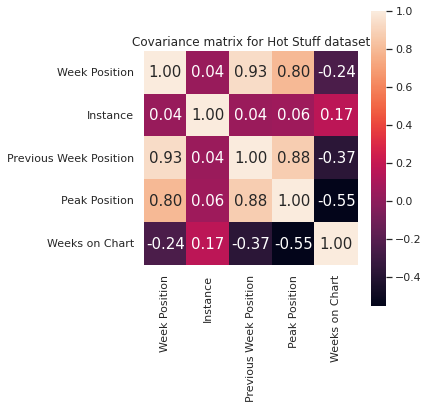

In [ ]:
covariance_matrix_analysis(HotStuff_df_1, (6,6), "Covariance matrix for Hot Stuff dataset")

### Label Distribution

In [ ]:
df_ranking = HotStuff_df[['Song','Week Position','WeekID']]
df_ranking = df_ranking.set_index('WeekID')
df_ranking = df_ranking.groupby('Song').head(3)
df_ranking

,Song,Week Position
WeekID,,
7/17/1965,Don't Just Stand There,34
7/24/1965,Don't Just Stand There,22
7/31/1965,Don't Just Stand There,14
4/19/1997,Don't Keep Wasting My Time,97
4/26/1997,Don't Keep Wasting My Time,90
...,...,...
2/24/1962,"Aw Shucks, Hush Your Mouth",97
6/2/2012,Same Damn Time,97
9/24/2016,Sex With Me,97


In [ ]:
df_ranking['ranking change'] = df_ranking.groupby('Song')['Week Position'].transform(lambda x: x.iat[-1] - x.iat[0])
df_ranking.head(10)

,Song,Week Position,ranking change
WeekID,,,
7/17/1965,Don't Just Stand There,34,-20
7/24/1965,Don't Just Stand There,22,-20
7/31/1965,Don't Just Stand There,14,-20
4/19/1997,Don't Keep Wasting My Time,97,0
4/26/1997,Don't Keep Wasting My Time,90,0
5/3/1997,Don't Keep Wasting My Time,97,0
4/24/1971,Don't Knock My Love - Pt. 1,96,-55
5/1/1971,Don't Knock My Love - Pt. 1,61,-55
5/8/1971,Don't Knock My Love - Pt. 1,41,-55


In [ ]:
df_ranking[df_ranking["ranking change"] <0].count()

Song              50247
Week Position     50247
ranking change    50247
dtype: int64

In [ ]:
df_ranking[df_ranking["ranking change"] >0].count()

Song              14253
Week Position     14253
ranking change    14253
dtype: int64

### Interesting Queries & Visualization

#### Top 10 Artists


**Movitation:**  We are curious about which artists have the maximum number of songs on the list. 
<br>**Conclusion:** The top 10 artists with most songs on the lists in the dataset are: Glee Cast (183), Taylor Swift (119) - yayy I love her!, Drake (99), The Beatles (65) - unsurprisingly, Aretha Franklin	(64), Elton John	(58), The Rolling Stones	(57) ,The Beach Boys	(54), Stevie Wonder	(54), Madonna (53). The top artists are representitive of the music industry.

**Data Aggregation steps:**
1. Aggregrate by Performer (Name of the Artist). We dropped duplicates before aggregation, as we use the number of the songs as criteria here, not the number of weeks.
2. Order the result by Song_count (descending order)
3. Find the top 10 Artists

**Plotting steps:** 
1. Set the title 
2. Set seaborn theme 
3. Do the plot by seaborn barplot
4. Rotate the ticks of x axis for better visualization

In [ ]:
# top_Artist
top_Artist = HotStuff_df[['Performer', 'SongID']].drop_duplicates().groupby('Performer').count().reset_index()
top_Artist = top_Artist.rename(columns={'SongID': 'Song_count'});
sorted_top_Artist = top_Artist.sort_values(by = ['Song_count', 'Performer'], ascending= False)

In [ ]:
# Check that our dataframe looks right
# sorted_top_Artist

In [ ]:
# only select the top 10 Artists
popular_top_Artist = sorted_top_Artist.head(10)

In [ ]:
# Check that our dataframe looks right
# popular_top_Artist

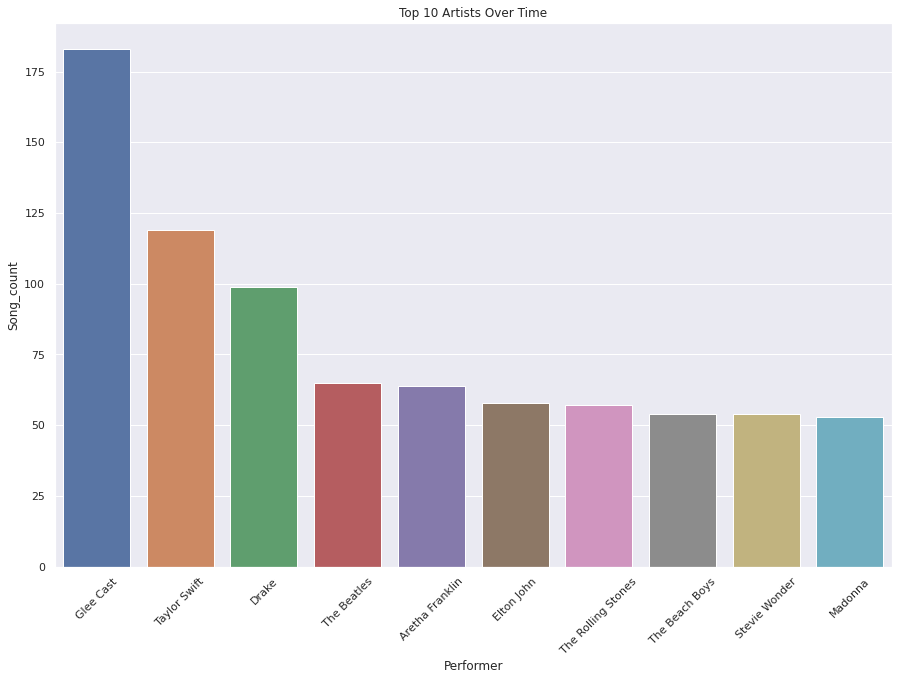

In [ ]:
# Graph
import seaborn as sns
# Set Size
sns.set(rc={'figure.figsize':(15,10)})

# Bar Plot
fig = sns.barplot(x = popular_top_Artist.Performer,  
            y = popular_top_Artist.Song_count)

# Adjust
fig.set_title("Top 10 Artists Over Time")
fig.tick_params(axis='x', rotation=45)


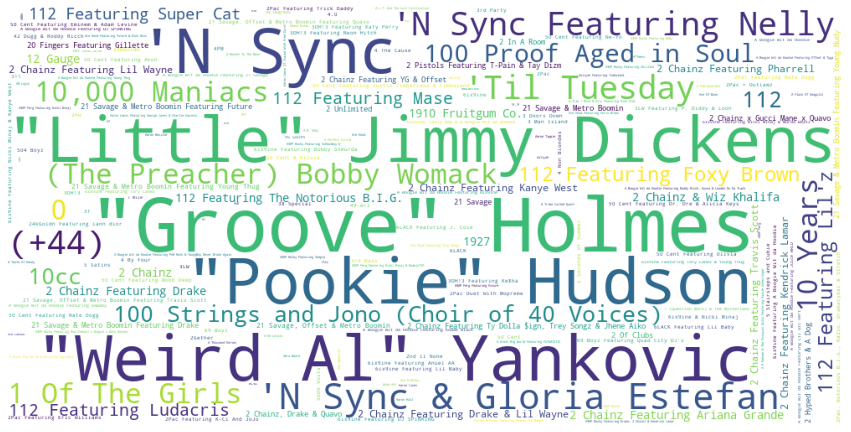

In [ ]:
# Make a word cloud for all the Artists
import matplotlib.pyplot as plt
from wordcloud import WordCloud
from collections import Counter

tokens_0 = top_Artist['Performer'].tolist()

wc_special= Counter(tokens_0)
wc_s = WordCloud(width = 1000, height = 500, background_color='white').generate_from_frequencies(wc_special)

plt.figure(figsize=(15,8))
plt.imshow(wc_s)
plt.axis("off")
plt.show()
plt.savefig('yourfile.png', bbox_inches='tight')
plt.close()

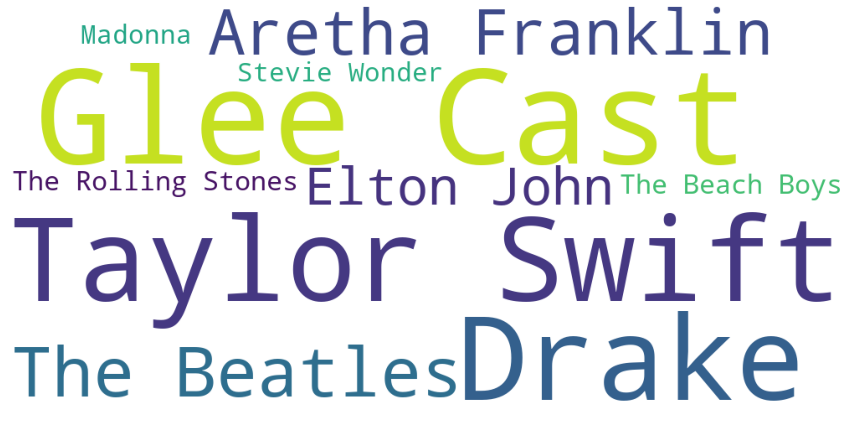

In [ ]:
# Make a word cloud for the top 10 Artists
import matplotlib.pyplot as plt
from wordcloud import WordCloud
from collections import Counter

tokens_1 = popular_top_Artist['Performer'].tolist()

wc_special= Counter(tokens_1)
wc_s = WordCloud(width = 1000, height = 500, background_color='white').generate_from_frequencies(wc_special)

plt.figure(figsize=(15,8))
plt.imshow(wc_s)
plt.axis("off")
plt.show()
plt.savefig('yourfile.png', bbox_inches='tight')
plt.close()

#### Top 10 Songs

**Movitation:**  We are curious about which songs are the most popular ones. We define "Popular song" by number of weeks on list.
<br>**Conclusion:** The top 10 songs in the dataset are: Stay	(208); Angel (195); Heaven	(194); I Like It	(188); You	(179); Hold On	(179); Crazy	(177); Forever	(163); Without You	(159); and Happy	(153). Which is really impressive as the average weeks a song is on the list is only 13.4.

**Data Aggregation steps:**
1. Aggregrate by Song (Name of the Song). 
2. Order the result by Week_count (descending order)
3. Find the top 10 Songs

**Plotting steps:** 
1. Set the title 
2. Set seaborn theme 
3. Do the plot by seaborn barplot
4. Rotate the ticks of x axis for better visualization

In [ ]:
# top_Song
top_Song = HotStuff_df[['Song', 'WeekID']].drop_duplicates().groupby('Song').count().reset_index()
top_Song = top_Song.rename(columns={'WeekID': 'Week_count'});
sorted_top_Song = top_Song.sort_values(by = ['Week_count', 'Song'], ascending= False)

In [ ]:
# Curiousd about the average weeks each song stays on the list
sorted_top_Song.mean(axis = 0)


Week_count    13.397085
dtype: float64

In [ ]:
# only select the top 10 Songs
popular_top_Song = sorted_top_Song.head(10)

In [ ]:
# Check that our dataframe looks right
# popular_top_Song

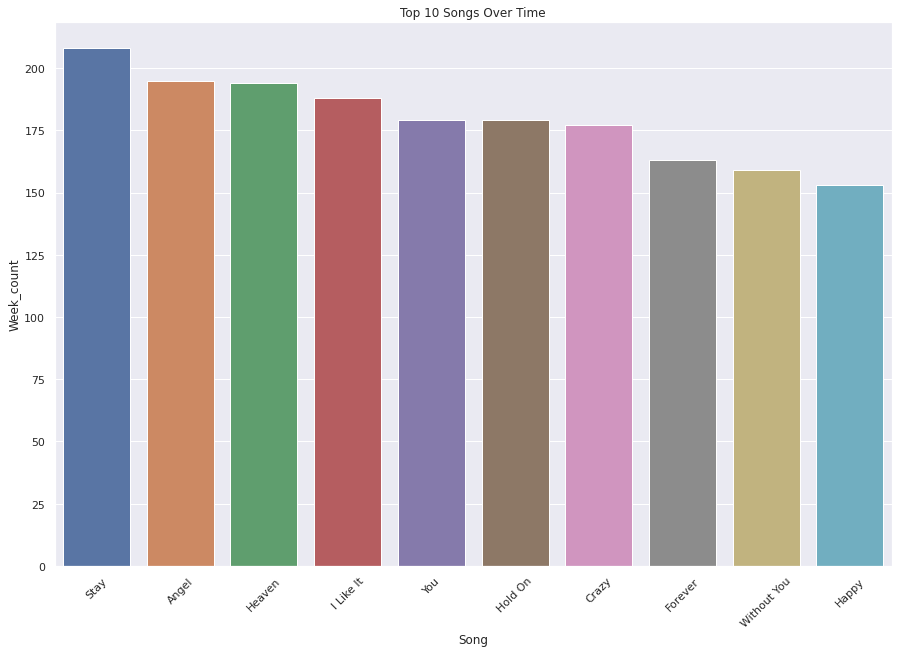

In [ ]:
# Graph
import seaborn as sns
# Set Size
sns.set(rc={'figure.figsize':(15,10)})

# Bar Plot
fig = sns.barplot(x = popular_top_Song.Song,  
            y = popular_top_Song.Week_count)

# Adjust
fig.set_title("Top 10 Songs Over Time")
fig.tick_params(axis='x', rotation=45)

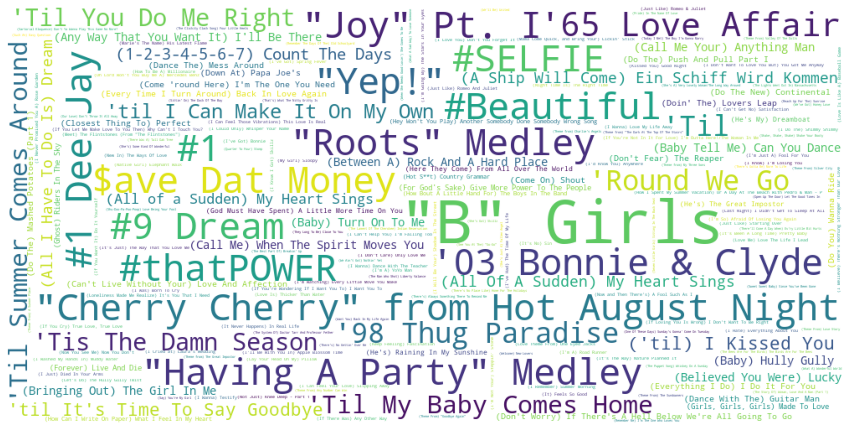

In [ ]:
# Make a word cloud for all the Songs
import matplotlib.pyplot as plt
from wordcloud import WordCloud
from collections import Counter

tokens_2 = top_Song['Song'].tolist()

wc_special= Counter(tokens_2)
wc_s = WordCloud(width = 1000, height = 500, background_color='white').generate_from_frequencies(wc_special)

plt.figure(figsize=(15,8))
plt.imshow(wc_s)
plt.axis("off")
plt.show()
plt.savefig('yourfile.png', bbox_inches='tight')
plt.close()

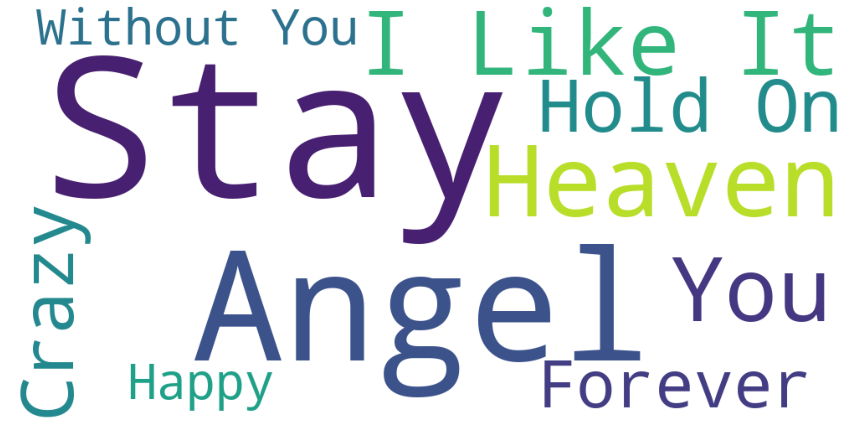

In [ ]:
# Make a word cloud for the top Songs
import matplotlib.pyplot as plt
from wordcloud import WordCloud
from collections import Counter

tokens_3 = popular_top_Song['Song'].tolist()

wc_special= Counter(tokens_3)
wc_s = WordCloud(width = 1000, height = 500, background_color='white').generate_from_frequencies(wc_special)

plt.figure(figsize=(15,8))
plt.imshow(wc_s)
plt.axis("off")
plt.show()
plt.savefig('yourfile.png', bbox_inches='tight')
plt.close()


#### Most Trendy Artists

**Movitation:**  We are curious about which artists are the most trendy at times. We define this by the have the maximum number of times being top 5 on the list. 
<br>**Conclusion:** The top 10 trendy artists in the dataset are: The Beatles; Madonna; Mariah Carey; Whitney Houston; Stevie Wonder; Janet Jackson; Michael Jackson; Taylor Swift; Elton John; and The Rolling Stones. I would say this is a more accurate representation of the popularity of the artist than the former mesure, as some artist have a lot of  songs that are at very low position of the list that are not that influential.

**Data Aggregation steps:**
1. Aggregrate by Performer (Name of the Artist). We dropped the entries with "Peak Position" more than 5 before aggregation.
2. Order the result by Song_count (descending order)
3. Find the top 10 Artists

**Plotting steps:** 
1. Set the title 
2. Set seaborn theme 
3. Do the plot by seaborn barplot
4. Rotate the ticks of x axis for better visualization

In [ ]:
# trendy_Artist

# pop out only the useful columns
# Select only the songs with 'Peak Position' <= 5
trendy_Artist = HotStuff_df[['Performer', 'SongID','Peak Position']]
trendy_Artist = trendy_Artist.loc[(trendy_Artist['Peak Position'] <= 5)]
trendy_Artist = trendy_Artist.drop(columns=['Peak Position'])

# drop duplicates before groupby
# Rename column
# Sort
trendy_Artist = trendy_Artist.drop_duplicates().groupby('Performer').count().reset_index()
trendy_Artist = trendy_Artist.rename(columns={'SongID': 'Song_count'});
sorted_trendy_Artist = trendy_Artist.sort_values(by = ['Song_count',  'Performer'], ascending= False)


In [ ]:
# Check that our dataframe looks right
# sorted_trendy_Artist

In [ ]:
# only select the top 10 Artists
popular_trendy_Artist = sorted_trendy_Artist.head(10)

In [ ]:
# Check that our dataframe looks right
popular_trendy_Artist

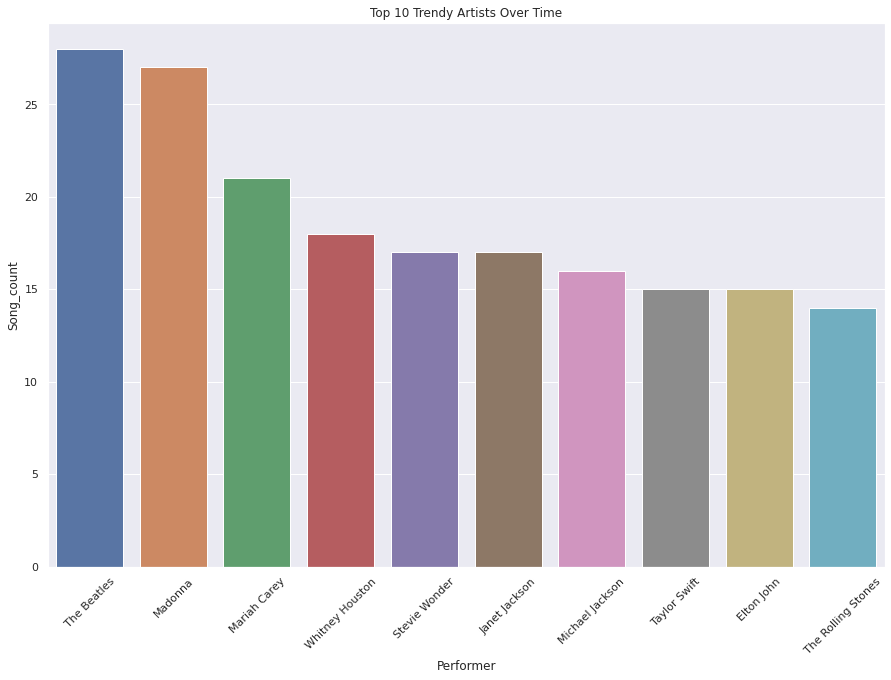

In [ ]:
# Graph
import seaborn as sns
# Set Size
sns.set(rc={'figure.figsize':(15,10)})

# Bar Plot
fig = sns.barplot(x = popular_trendy_Artist.Performer,  
            y = popular_trendy_Artist.Song_count)

# Adjust
fig.set_title("Top 10 Trendy Artists Over Time")
fig.tick_params(axis='x', rotation=45)

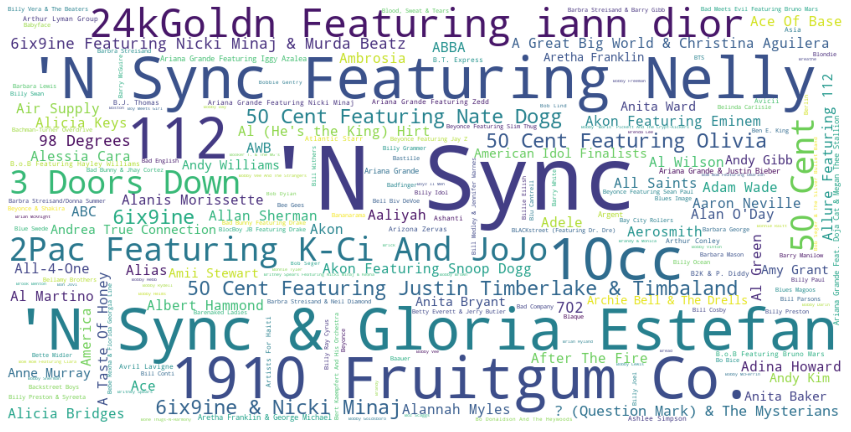

In [ ]:
# Make a word cloud for the Artists have Songs in the top 5

import matplotlib.pyplot as plt
from wordcloud import WordCloud
from collections import Counter

tokens_4 = trendy_Artist['Performer'].tolist()

wc_special= Counter(tokens_4)
wc_s = WordCloud(width = 1000, height = 500, background_color='white').generate_from_frequencies(wc_special)

plt.figure(figsize=(15,8))
plt.imshow(wc_s)
plt.axis("off")
plt.show()
plt.savefig('yourfile.png', bbox_inches='tight')
plt.close()

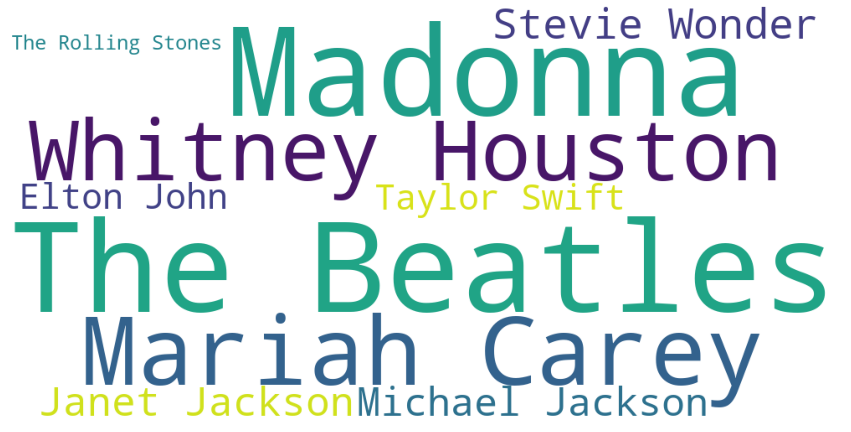

In [ ]:
# Make a word cloud for the top 10 Trendy Artists
import matplotlib.pyplot as plt
from wordcloud import WordCloud
from collections import Counter

tokens_5 = popular_trendy_Artist['Performer'].tolist()

wc_special= Counter(tokens_5)
wc_s = WordCloud(width = 1000, height = 500, background_color='white').generate_from_frequencies(wc_special)

plt.figure(figsize=(15,8))
plt.imshow(wc_s)
plt.axis("off")
plt.show()
plt.savefig('yourfile.png', bbox_inches='tight')
plt.close()

#### Most Trendy Songs

**Movitation:**  We are curious about which songs are the most Trendy ones. We define "Popular song" by number of weeks where the songs are in top 10 on list.
<br>**Conclusion:** The top 10 songs in the dataset are: Rockstar; I Like It; Stay; Closer; Dynamite; Someday; Shake It Off; Hero; Forever; Perfect. An impressive change is the average weeks a song is on the top 10 of the list acturally increased - to 14.7. I guess it is because the most popular songs attracts more attention!

**Data Aggregation steps:**
1. Aggregrate by Song (Name of the Song). We selected the songs are in top 10 on list before aggregating.
2. Order the result by Week_count (descending order)
3. Find the top 10 Songs

**Plotting steps:** 
1. Set the title 
2. Set seaborn theme 
3. Do the plot by seaborn barplot
4. Rotate the ticks of x axis for better visualization

In [ ]:
# trendy_Song

# pop out only the useful columns
# Select only the songs with 'Peak Position' <= 10
trendy_Song = HotStuff_df[['Song', 'WeekID','Peak Position']]
trendy_Song = trendy_Song.loc[(trendy_Song['Peak Position'] <= 10)]
trendy_Song = trendy_Song.drop(columns=['Peak Position'])

# drop duplicates before groupby
# Rename column
# Sort
trendy_Song = trendy_Song.drop_duplicates().groupby('Song').count().reset_index()
trendy_Song = trendy_Song.rename(columns={'WeekID': 'Week_count'});
sorted_trendy_Song = trendy_Song.sort_values(by = ['Week_count', 'Song'], ascending= False)

In [ ]:
# Curiousd about the average weeks each song stays on the list
sorted_trendy_Song.mean(axis = 0)

Week_count    14.67
dtype: float64

In [ ]:
# only select the top 10 Songs
popular_trendy_Song = sorted_trendy_Song.head(10)

In [ ]:
# Check that our dataframe looks right
popular_trendy_Song

,Song,Week_count
3209,Rockstar,95
1761,I Like It,95
3579,Stay,81
681,Closer,76
1029,Dynamite,75
3512,Someday,74
3356,Shake It Off,72
1528,Hero,72
1205,Forever,70
2989,Perfect,68


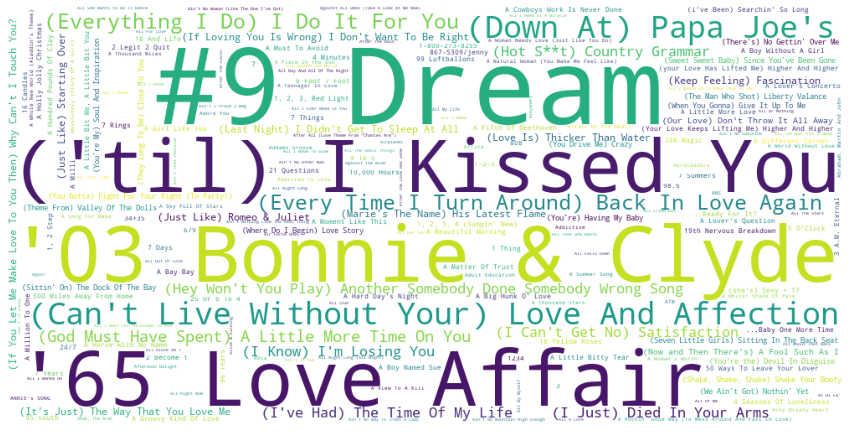

In [ ]:
# Make a word cloud for all the Songs have ranked top 10
import matplotlib.pyplot as plt
from wordcloud import WordCloud
from collections import Counter

tokens_6 = trendy_Song['Song'].tolist()

wc_special= Counter(tokens_6)
wc_s = WordCloud(width = 1000, height = 500, background_color='white').generate_from_frequencies(wc_special)

plt.figure(figsize=(15,8))
plt.imshow(wc_s)
plt.axis("off")
plt.show()
plt.savefig('yourfile.png', bbox_inches='tight')
plt.close()

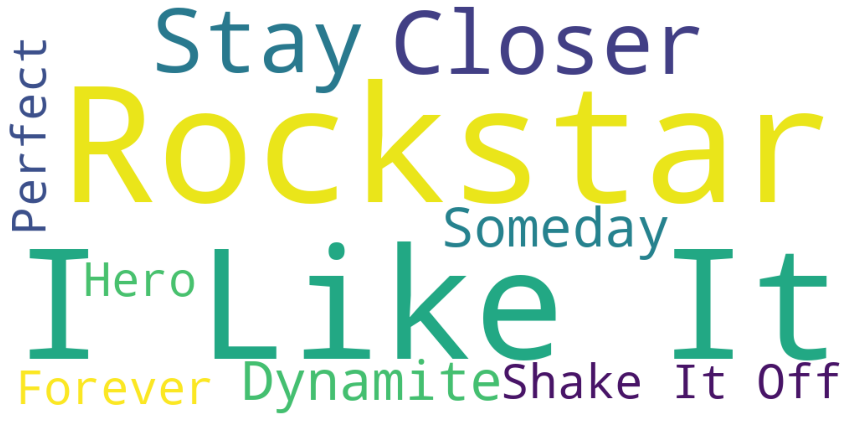

In [ ]:
# Make a word cloud for the top Songs
import matplotlib.pyplot as plt
from wordcloud import WordCloud
from collections import Counter

tokens_7 = popular_trendy_Song['Song'].tolist()

wc_special= Counter(tokens_7)
wc_s = WordCloud(width = 1000, height = 500, background_color='white').generate_from_frequencies(wc_special)

plt.figure(figsize=(15,8))
plt.imshow(wc_s)
plt.axis("off")
plt.show()
plt.savefig('yourfile.png', bbox_inches='tight')
plt.close()


## Audio Features Dataset EDA
*   Get the year interval groups of songs through data merging and processing
*   Data Size and Type Conclusion
*   Correlation Matrix Analysis
*   Interesting Queries and Visualization
*   Decompose certain field and information extraction  

In [ ]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
from matplotlib.pylab import rcParams
import datetime
from datetime import datetime
from collections import Counter
from palettable.colorbrewer.colorbrewer import get_map
import plotly.express as px
import scipy.signal
import plotly.graph_objs as go
from sklearn import preprocessing

### Helper function

* Function to get the year of weekid
* Function to get the year groups in a ten-year interval

In [ ]:
def get_year(i):
    year = str(i).split('/')[2]
    return year

def get_year_group(i):
    year = str(i).split('/')[2]
    if year < '1970':
        group ='<1970'
    elif year >= '1970' and year < '1980':
        group='1970-1980'
    elif year >= '1980' and year < '1990':
        group='1980-1990'
    elif year >= '1990' and year < '2000':
        group='1990-2000'
    elif year >= '2000' and year < '2010':
        group='2000-2010'
    elif year >= '2010' and year <= '2021':
        group='2010-2021'
    return group

### Data Loading and Information Retrieval 
Here we will do the following things: 
1.   Read the Billboaed song scraping result files in the data extraction part
2.   Merge the hot song and audio feature data frames to add the WeekID column
3.   Using the WeekID to retrive the year information of the songs
4.   Drop duplication, missing and abnormal value

In [ ]:
import pandas as pd
df_stuff = pd.read_csv('/content/Hot_Stuff.csv')
df_features=pd.read_excel('/content/Hot_100_Audio_Features.xlsx')
audio_features_df = pd.merge(df_features, df_stuff, on='SongID', how='inner')

In [ ]:
audio_features_df['year']=''
audio_features_df['year'] = audio_features_df['WeekID'].map(get_year)

audio_features_df['group']=''
print(audio_features_df.columns)
audio_features_df['group'] = audio_features_df['WeekID'].map(get_year_group)

Index(['SongID', 'Performer_x', 'Song_x', 'spotify_genre', 'spotify_track_id',
       'spotify_track_preview_url', 'spotify_track_duration_ms',
       'spotify_track_explicit', 'spotify_track_album', 'danceability',
       'energy', 'key', 'loudness', 'mode', 'speechiness', 'acousticness',
       'instrumentalness', 'liveness', 'valence', 'tempo', 'time_signature',
       'spotify_track_popularity', 'url', 'WeekID', 'Week Position', 'Song_y',
       'Performer_y', 'Instance', 'Previous Week Position', 'Peak Position',
       'Weeks on Chart', 'year', 'group'],
      dtype='object')


In [ ]:
audio_features_df.drop_duplicates(subset=None, keep='first', inplace=True)
audio_features_df.dropna(thresh=2,inplace=True)
audio_features_df.drop(columns=['url', 'Week Position', 'Song_y',
       'Performer_y', 'Instance', 'Previous Week Position', 'Peak Position',
       'Weeks on Chart'], axis=1, inplace=True)

In [ ]:
import numpy as np
for i in audio_features_df.describe().columns:
    pc = np.percentile(audio_features_df[i],[0,25,50,75,100])
    iqr = pc[3]-pc[1]
    up = pc[3]+iqr*1.5
    down = pc[3]-iqr*1.5
    audio_features_df[(audio_features_df[i] > down) & (audio_features_df[i] < up)]
audio_features_df.reset_index(inplace=True)

### Audio Features DataFrame Data Conclusion

*  Column Information Check 
*  Data size conclusion
1. There are 329957 entries in the audio features dataframe. 
2. In all numeric audio features, key and loudness have relatively high dispersion.

Meaning of Column names:
* index: Sample serial number.
* songID: Song's name and performer's name liked with no space.
* Performer: name of the performer. Might be multiple people.
* Song: name of the song.
* spotify_genre: a list of all subdivision genres that the song belongs to.
* spotify_track_id: one to one correspondence with the song.
* spotify_track_preview_url: url to get and play a song 30 second previews from Spotify.
* spotify_track_duration_ms: duration length in ms.
* spotify_track_explicit: if a song needs an explicit tag.
* spotify_track_album: the name of the album.
* Danceability: Describes how suitable a track is for dancing.
* Valence: Describes the musical positiveness conveyed by a track.
* Energy: Represents a perceptual measure of intensity and activity.
* Loudness: The overall loudness of a track in decibels (dB).
* Speechiness: This detects the presence of spoken words in a track.
* Instrumentalness: Predicts whether a track contains no vocals.
* Liveness: Detects the presence of an audience in the recording.
* Key: The estimated overall key of the track. Integers map to pitches using standard Pitch Class notation
* Mode: Indicates the modality (major or minor) of a track
* Duration: The duration of the track in milliseconds.
* Time Signature: An estimated overall time signature of a track.
* spotify_track_popularity: popularity of this track
* WeekID: the weekid of the song on Billboard
* year: we derive this column frome WeekID
* group: the group of the year

In [ ]:
audio_features_df = audio_features_df.rename({'Performer_x': 'Performer', 'Song_x': 'Song'}, axis=1)
audio_features_df = audio_features_df.drop_duplicates()
show_audio_features_df = audio_features_df[~audio_features_df.isnull().any(axis=1)]
show_audio_features_df=show_audio_features_df.loc[show_audio_features_df['group'] != "<1970"]
show_audio_features_df.head()

,index,SongID,Performer,Song,spotify_genre,spotify_track_id,spotify_track_preview_url,spotify_track_duration_ms,spotify_track_explicit,spotify_track_album,danceability,energy,key,loudness,mode,speechiness,acousticness,instrumentalness,liveness,valence,tempo,time_signature,spotify_track_popularity,WeekID,year,group
17,17,...Baby One More TimeBritney Spears,Britney Spears,...Baby One More Time,"['dance pop', 'pop', 'post-teen pop']",3MjUtNVVq3C8Fn0MP3zhXa,https://p.scdn.co/mp3-preview/da2134a161f1cb34...,211066.0,0.0,...Baby One More Time (Digital Deluxe Version),0.759,0.699,0.0,-5.745,0.0,0.0307,0.202,0.000131,0.443,0.907,92.96,4.0,77.0,11/21/1998,1998,1990-2000
18,18,...Baby One More TimeBritney Spears,Britney Spears,...Baby One More Time,"['dance pop', 'pop', 'post-teen pop']",3MjUtNVVq3C8Fn0MP3zhXa,https://p.scdn.co/mp3-preview/da2134a161f1cb34...,211066.0,0.0,...Baby One More Time (Digital Deluxe Version),0.759,0.699,0.0,-5.745,0.0,0.0307,0.202,0.000131,0.443,0.907,92.96,4.0,77.0,11/28/1998,1998,1990-2000
19,19,...Baby One More TimeBritney Spears,Britney Spears,...Baby One More Time,"['dance pop', 'pop', 'post-teen pop']",3MjUtNVVq3C8Fn0MP3zhXa,https://p.scdn.co/mp3-preview/da2134a161f1cb34...,211066.0,0.0,...Baby One More Time (Digital Deluxe Version),0.759,0.699,0.0,-5.745,0.0,0.0307,0.202,0.000131,0.443,0.907,92.96,4.0,77.0,12/5/1998,1998,1990-2000
20,20,...Baby One More TimeBritney Spears,Britney Spears,...Baby One More Time,"['dance pop', 'pop', 'post-teen pop']",3MjUtNVVq3C8Fn0MP3zhXa,https://p.scdn.co/mp3-preview/da2134a161f1cb34...,211066.0,0.0,...Baby One More Time (Digital Deluxe Version),0.759,0.699,0.0,-5.745,0.0,0.0307,0.202,0.000131,0.443,0.907,92.96,4.0,77.0,12/12/1998,1998,1990-2000
21,21,...Baby One More TimeBritney Spears,Britney Spears,...Baby One More Time,"['dance pop', 'pop', 'post-teen pop']",3MjUtNVVq3C8Fn0MP3zhXa,https://p.scdn.co/mp3-preview/da2134a161f1cb34...,211066.0,0.0,...Baby One More Time (Digital Deluxe Version),0.759,0.699,0.0,-5.745,0.0,0.0307,0.202,0.000131,0.443,0.907,92.96,4.0,77.0,1/16/1999,1999,1990-2000


In [ ]:
audio_features_df.info(verbose= True)

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 329957 entries, 0 to 329956
Data columns (total 26 columns):
 #   Column                     Non-Null Count   Dtype  
---  ------                     --------------   -----  
 0   index                      329957 non-null  int64  
 1   SongID                     329957 non-null  object 
 2   Performer_x                329957 non-null  object 
 3   Song_x                     329957 non-null  object 
 4   spotify_genre              315504 non-null  object 
 5   spotify_track_id           286868 non-null  object 
 6   spotify_track_preview_url  169853 non-null  object 
 7   spotify_track_duration_ms  286868 non-null  float64
 8   spotify_track_explicit     286868 non-null  float64
 9   spotify_track_album        286806 non-null  object 
 10  danceability               286310 non-null  float64
 11  energy                     286310 non-null  float64
 12  key                        286310 non-null  float64
 13  loudness                   28

In [ ]:
audio_features_df.describe()

,index,spotify_track_duration_ms,spotify_track_explicit,danceability,energy,key,loudness,mode,speechiness,acousticness,instrumentalness,liveness,valence,tempo,time_signature,spotify_track_popularity
count,329957.000000,2.868680e+05,286868.000000,286310.000000,286310.000000,286310.000000,286310.000000,286310.000000,286310.000000,286310.000000,286310.000000,286310.000000,286310.000000,286310.000000,286310.000000,286868.000000
mean,165227.208273,2.286290e+05,0.115332,0.613630,0.630870,5.251200,-8.352365,0.716762,0.071671,0.260760,0.028091,0.185077,0.599613,120.056067,3.947787,47.929041
std,95381.592577,6.477815e+04,0.319422,0.150174,0.193894,3.564417,3.549707,0.450572,0.078749,0.265792,0.125147,0.153634,0.235883,27.776750,0.284467,21.516653
min,0.000000,2.968800e+04,0.000000,0.000000,0.000581,0.000000,-28.030000,0.000000,0.000000,0.000003,0.000000,0.009670,0.000000,0.000000,0.000000,0.000000
25%,82624.000000,1.886130e+05,0.000000,0.516000,0.493000,2.000000,-10.685000,0.000000,0.032100,0.038800,0.000000,0.088300,0.417000,99.031000,4.000000,33.000000
50%,165222.000000,2.242260e+05,0.000000,0.622000,0.648000,5.000000,-7.775000,1.000000,0.041300,0.159000,0.000004,0.126000,0.618000,118.556000,4.000000,50.000000
75%,247834.000000,2.590400e+05,0.000000,0.720000,0.786000,8.000000,-5.599000,1.000000,0.067500,0.428000,0.000360,0.239000,0.796000,135.984000,4.000000,65.000000
max,330382.000000,3.079157e+06,1.000000,0.988000,0.997000,11.000000,2.291000,1.000000,0.951000,0.991000,0.982000,0.999000,0.991000,241.009000,5.000000,100.000000


### Covariance Matrix Analysis


*   $\textbf{Only do the correlation analysis for numeric columns}$
<br> It only makes sense to find the relations between numerical values.  
*   $\textbf{Pairwise Input Feature Correlations Exploration}$
<br>Conclusion: We can see there is strong correlations between 'energy' ;'loudness'; 'spotify_track_popularity'  and 'acousticness'. On the whole, the correlation between audio features is relatively high.We need to do PCA.



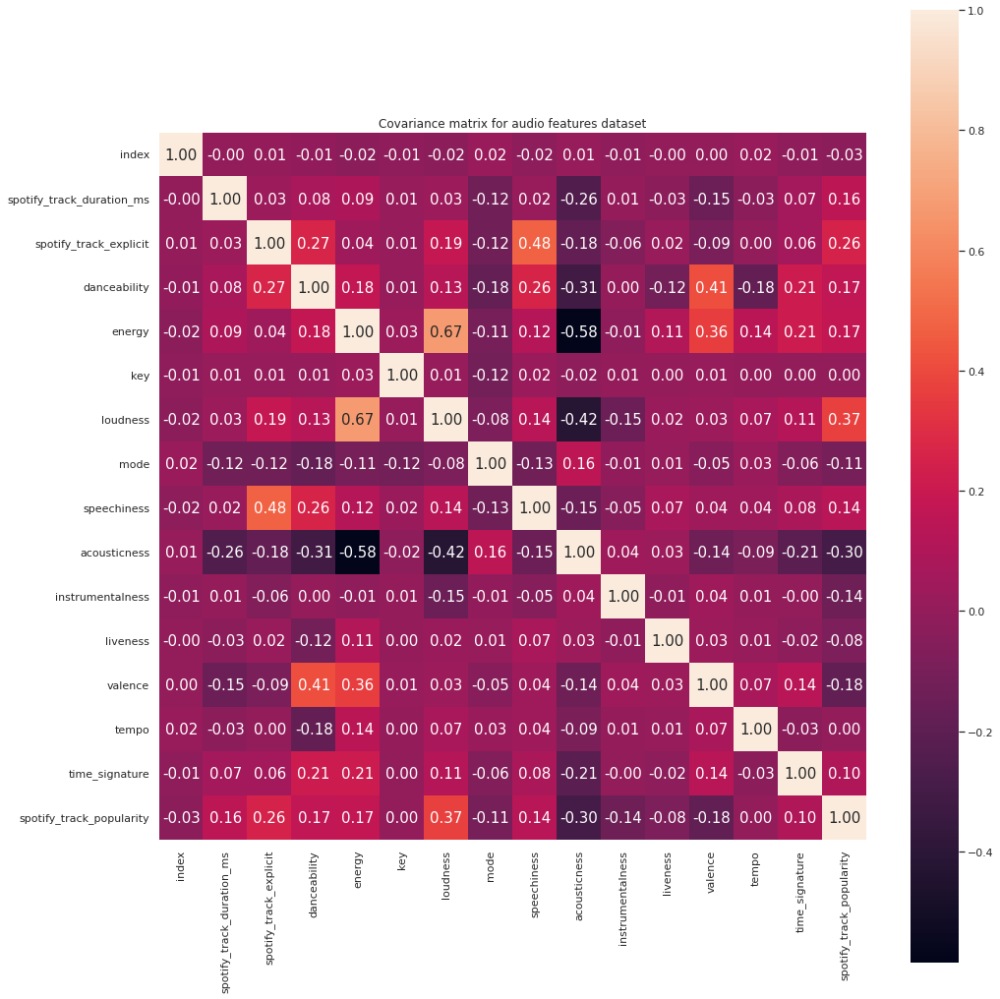

In [ ]:
audio_features_df1 =audio_features_df.dropna(inplace=False)
covariance_matrix_analysis(audio_features_df1, (15,15), "Covariance matrix for audio features dataset")

### Visualization: audio features changed over decades
**Movitation:** We are curious about how do billboard's song preferences change in different decades

**Conclusion:** 
1. The key of Billboard music keeps fluctuating, and pitches like G and C receive sustained love.

2. The danceability kept slowly rising after the 1970s but decreased in 2000-2010, probably due to the popularity of lyrical rap music. For 2010-2021, danceable music is more popular compared to 2000-2010.

3. Before 1980, disco and funk music enjoy their period of glory. In 2000-2010, The pop music is a unprecedented super hit.



#### What is the most common key over decades?

*  Using countplot to show the key frequency of all songs in each year group. 
*  People's love for the key of D declines while the key of B increases, and their love for the key of G seems to endure

In [ ]:
group1 = audio_features_df[audio_features_df['group'] == '<1970']
group2 = audio_features_df[audio_features_df['group'] == '1970-1980']
group3 = audio_features_df[audio_features_df['group'] == '1980-1990']
group4 = audio_features_df[audio_features_df['group'] == '1990-2000']
group5 = audio_features_df[audio_features_df['group'] == '2000-2010']
group6 = audio_features_df[audio_features_df['group'] == '2010-2021']
df1 = group1.groupby(['key']).count()
count1 = list(df1['SongID'])
df2 = group2.groupby(['key']).count()
count2 = list(df2['SongID'])
df3 = group3.groupby(['key']).count()
count3 = list(df3['SongID'])
df4 = group4.groupby(['key']).count()
count4 = list(df4['SongID'])
df5 = group5.groupby(['key']).count()
count5 = list(df5['SongID'])
df6 = group6.groupby(['key']).count()
count6 = list(df6['SongID'])

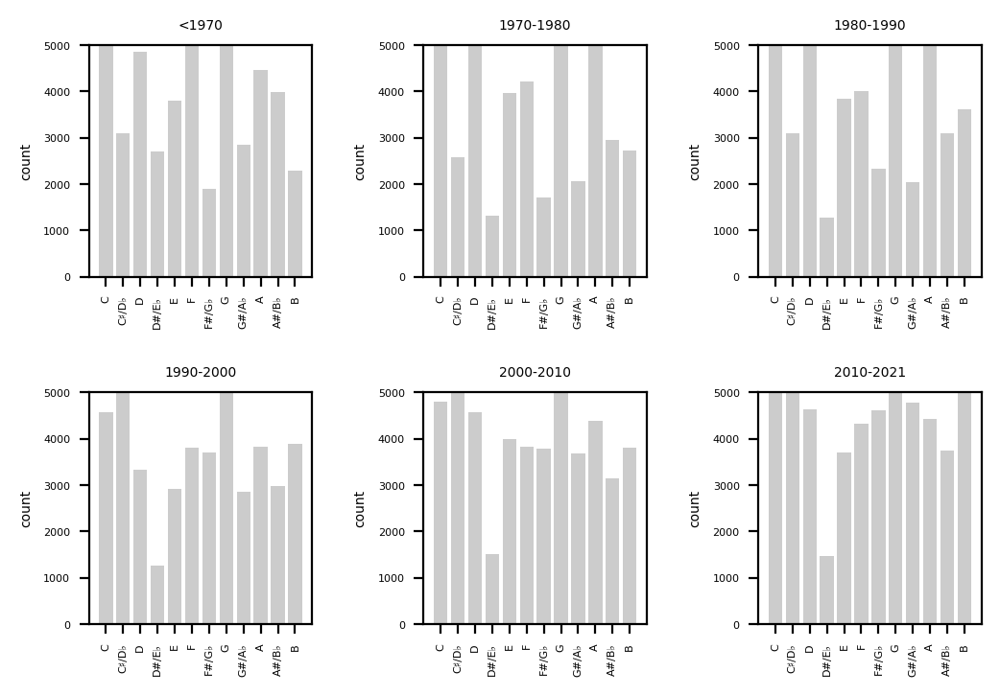

In [ ]:
import matplotlib.pyplot as plt
%matplotlib inline

key = ["C","C♯/D♭","D","D#/E♭","E","F","F#/G♭","G","G#/A♭","A","A#/B♭","B"]

plt.figure(figsize=(6, 4), dpi=200)
plt.subplots_adjust(wspace=0.5, hspace=0.5)
plt.subplot(231)
plt.bar(range(12),count1,align = "center",color = "grey",alpha = 0.4)
plt.ylabel("count",fontsize=5)
plt.ylim([0,5000])
plt.xticks(range(12),key, rotation ='vertical')
plt.tick_params(labelsize=4)
plt.title('<1970',fontsize=5)

plt.subplot(232)
plt.bar(range(12),count2,align = "center",color = "grey",alpha = 0.4)
plt.ylabel("count",fontsize=5)
plt.ylim([0,5000])
plt.xticks(range(12),key, rotation ='vertical')
plt.tick_params(labelsize=4)
plt.title('1970-1980',fontsize=5)

plt.subplot(233)
plt.bar(range(12),count3,align = "center",color = "grey",alpha = 0.4)
plt.ylabel("count",fontsize=5)
plt.ylim([0,5000])
plt.xticks(range(12),key, rotation ='vertical')
plt.tick_params(labelsize=4)
plt.title('1980-1990',fontsize=5)

plt.subplot(234)
plt.bar(range(12),count4,align = "center",color = "grey",alpha = 0.4)
plt.ylabel("count",fontsize=5)
plt.ylim([0,5000])
plt.xticks(range(12),key, rotation ='vertical')
plt.tick_params(labelsize=4)
plt.title('1990-2000',fontsize=5)

plt.subplot(235)
plt.bar(range(12),count5,align = "center",color = "grey",alpha = 0.4)
plt.ylabel("count",fontsize=5)
plt.ylim([0,5000])
plt.xticks(range(12),key, rotation ='vertical')
plt.tick_params(labelsize=4)
plt.title('2000-2010',fontsize=5)

plt.subplot(236)
plt.bar(range(12),count6,align = "center",color = "grey",alpha = 0.4)
plt.ylabel("count",fontsize=5)
plt.ylim([0,5000])
plt.xticks(range(12),key, rotation ='vertical')
plt.tick_params(labelsize=4)
plt.title('2010-2021',fontsize=5)

plt.show()   

#### Do recent people like dancing to songs more？

*  Manipulate a side-by-side violin plot to compare distributions of danceability across different year groups.
*  The preference for danceability kept slowly rising after the 1970s
*  There is a small decline after the millennium, probably due to the popularity of lyrical rap music. 
*  In the last 10 years, danceable music is more popular compared to 2000-2010.

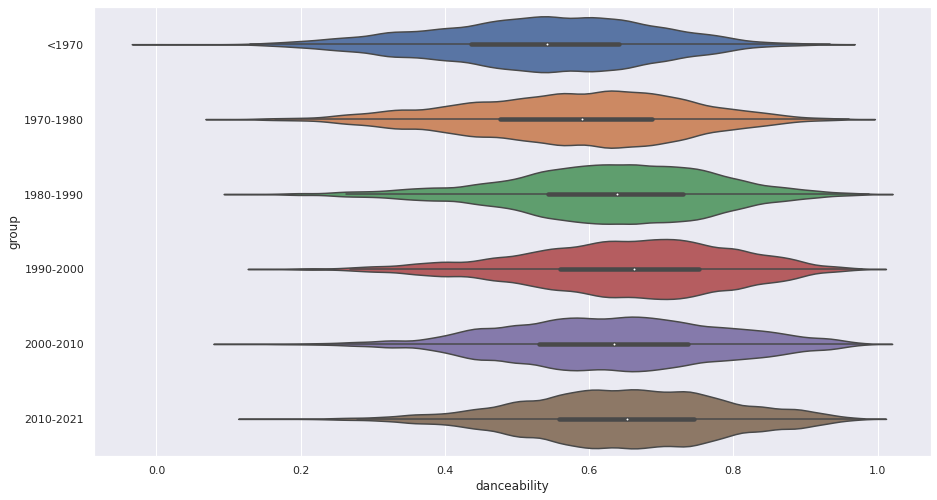

In [ ]:
import seaborn as sns
sns.set(rc={'figure.figsize':(15,8.27)})
sns.violinplot( y=audio_features_df["group"], x=audio_features_df["danceability"],
               order=["<1970", "1970-1980","1980-1990","1990-2000","2000-2010","2010-2021"] )

#### How did the genres change over decades?

*  The tricky part of this section is that one song would have multiple genres in the audio feature data frame. In order to get the counts of each genre, we clean and expand the data.
*  Also for each year group, we need to get the count of different genres respectively, and transpose dataframe to fit into stacking diagrams.
*  Since there are too many genres for get an informative image, we only keep part of them for showing the plot.

In [ ]:
df_genre = audio_features_df.set_index(['group'])['spotify_genre'].str.split(",", expand=True).stack().reset_index(drop=True, level=-1).reset_index().rename(columns={0: 'genre'})
def rep(i):
    i = str(i).replace('\'','').replace('[','').replace(']','')
    return i
df_genre['genre']=df_genre['genre'].apply(rep)

In [ ]:
df_genre['number'] = ''
number = df_genre.groupby(['genre','group'])['number'].count()
list = []
for i in range(0,len(number)):
    list.append([number.index[i][0],number.index[i][1],number[i]])
df_ = pd.DataFrame(list)

In [ ]:
for i in range(0,6):
    df_ = df_.drop([i])
df_ = df_.reset_index()
df_.columns = ['index','genre','group','number']
print(df_.head(5))

   index               genre      group  number
0      6   "childrens music"  1980-1990       7
1      7   "childrens music"  2010-2021      20
2      8     adult standards  1970-1980      12
3      9     adult standards  1980-1990      62
4     10            afrobeat      <1970      17


In [ ]:
df_ = df_.drop(columns=['index']) 
print(df_.head(5))

                genre      group  number
0   "childrens music"  1980-1990       7
1   "childrens music"  2010-2021      20
2     adult standards  1970-1980      12
3     adult standards  1980-1990      62
4            afrobeat      <1970      17


In [ ]:
df_g = df_.set_index(['group','genre'])
two_level_index_series = df_g['number']
dfg = two_level_index_series.unstack()
dfg = dfg.reset_index()
print(dfg)

genre      group   "childrens music"  ...  yacht rock  yodeling
0      1970-1980                 NaN  ...       120.0       NaN
1      1980-1990                 7.0  ...       108.0       NaN
2      1990-2000                 NaN  ...         NaN       NaN
3      2000-2010                 NaN  ...         NaN       NaN
4      2010-2021                20.0  ...         NaN       NaN
5          <1970                 NaN  ...        11.0       6.0

[6 rows x 1557 columns]


In [ ]:
label = [i for i in dfg.columns[1:]]
number0 = dfg.iloc[0,1:].values
number1 = dfg.iloc[1,1:].values
number2 = dfg.iloc[2,1:].values
number3 = dfg.iloc[3,1:].values
number4 = dfg.iloc[4,1:].values
number5 = dfg.iloc[5,1:].values

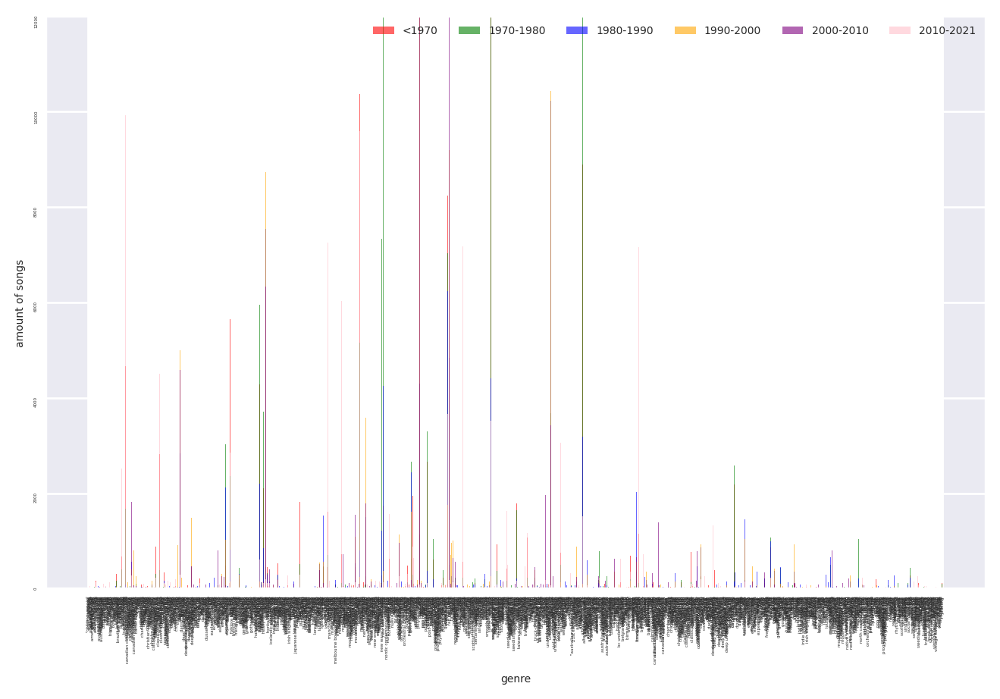

In [ ]:
import matplotlib.pyplot as plt
%matplotlib inline
fig,ax = plt.subplots(figsize=(8,5),dpi=200)

width = 0.5
 
ax.bar(label, number0, width, label='<1970',color='red', edgecolor='none',alpha = 0.6)
ax.bar(label, number1, width,  label='1970-1980',color='green', edgecolor='none',alpha = 0.6)
ax.bar(label, number2, width,  label='1980-1990',color='blue', edgecolor='none',alpha = 0.6)
ax.bar(label, number3, width,  label='1990-2000',color='orange', edgecolor='none',alpha = 0.6)
ax.bar(label, number4, width,  label='2000-2010',color='purple', edgecolor='none',alpha = 0.6)
ax.bar(label, number5, width,  label='2010-2021',color='pink', edgecolor='none',alpha = 0.6)

ax.set_ylim(0,12000)
ax.tick_params(direction='out',labelsize=2,length=0,width=3,labelrotation=90)
ax.legend(fontsize=5,frameon=False,loc='upper right',ncol=6)
ax.set_ylabel('amount of songs',fontsize=5)
ax.set_xlabel('genre',fontsize=5)
text_font = {'size':'5','color':'gray'}

In [ ]:
dfg_new = dfg[['rock', 'christmas instrumental', 'experimental', 'emo',
       'folk', 'country', 'vocal jazz', 'metal',
       'r&b', 'traditional folk', 'rap', 'pop', 'hip pop', 'trap', 'soul',
       'funk', 'rhythm and blues', 'new wave', 'edm', 'house',
       'disco']]

label = [i for i in dfg_new.columns[1:]]
number0 = dfg_new.iloc[0,1:].values
number1 = dfg_new.iloc[1,1:].values
number2 = dfg_new.iloc[2,1:].values
number3 = dfg_new.iloc[3,1:].values
number4 = dfg_new.iloc[4,1:].values
number5 = dfg_new.iloc[5,1:].values

In [ ]:
start = []
fig = px.bar(x=label.index, y=start)
fig.add_bar(x=label, y=number0,name='<1970')
fig.add_bar(x=label, y=number1,name='1970-1980')
fig.add_bar(x=label, y=number2,name='1980-1990')
fig.add_bar(x=label, y=number3,name='1990-2000')
fig.add_bar(x=label, y=number4,name='2000-2010')
fig.add_bar(x=label, y=number5,name='2010-2021')
fig.update_layout(
    xaxis_title = 'genre'
    ,yaxis_title = 'amount of songs'
    ,font = dict(size = 10)
    ,template = 'plotly'
)
fig.show()

*  Among the 20 genres that we are famaliar with, pop music is oustanding with a large number of times bing on the Billboard in 2000-2010.
* Before 1980, disco and funk music enjoy their period of glory.

### Interesting Queries After 2000

**Movitation:** As new millennials, we wanted to explore what's trending after 2000: Who's been dominated the most? How many songs he/she's had on the Billboard? What are the audio features of these songs?

**Conclusion:** 

1. Not unexpectedly, Taylor Swift ruled the roost with a 1022 times of being on the Billboard, far ahead of the second place, Drake, who has 746 records. 
2. Taylor and Drake have far more a lot of songs on the Billboard compared to other Top10 artists.
3. Among the Top 10 artists, Rihanna is the one who has songs stayed on the Billboard for a relatively long time, ranking NO.7 in terms of times with only 27 songs.
4. The songs of Top 10 artists mostly have high energy and danceablity.
5. Drake is a special case with the highest speechiness far more than others. His songs also placed first in danceability.
6. Most of the highly ranked genres in 1970 have disappeared by 2020.
7. Most of the rising genres are niche genres, while the falling ones are usual genres. 
8. Most of genres was either newly created or disappear by 2020.

#### Top 10 Artists 2000-2021

*  By counting the frequencies of all artists and finding the top 10, we use the rose chart to get a better picture of their dominance.
*  For each top 10 artist, count the number of their Billboard songs, which involves de-duplication by groups.

In [ ]:
df_stuff['Week Position'] = pd.to_numeric(df_stuff['Week Position'],errors = 'coerce')
df_stuff['WeekID']= pd.to_datetime(df_stuff['WeekID'])
# select data:
df_stuff = df_stuff[df_stuff['Week Position'] <= 100]
df_stuff = df_stuff[df_stuff['WeekID'] >= '2000-01-01']
df_stuff = df_stuff[df_stuff['WeekID'] <= '2021-12-31']

In [ ]:
from collections import Counter
# Top most-mentioned singer:
result1 = Counter(df_stuff['Performer'])

df_rank = pd.DataFrame.from_dict(result1, orient='index').reset_index()
df_rank.columns=['performer','number']
df_rank = df_rank.sort_values("number", axis = 0, ascending = False)
df_rank['performer'].head(10)

42         Taylor Swift
158               Drake
27        Kenny Chesney
294         Keith Urban
803       Rascal Flatts
314          Tim McGraw
474             Rihanna
100                P!nk
72         Jason Aldean
481    Carrie Underwood
Name: performer, dtype: object

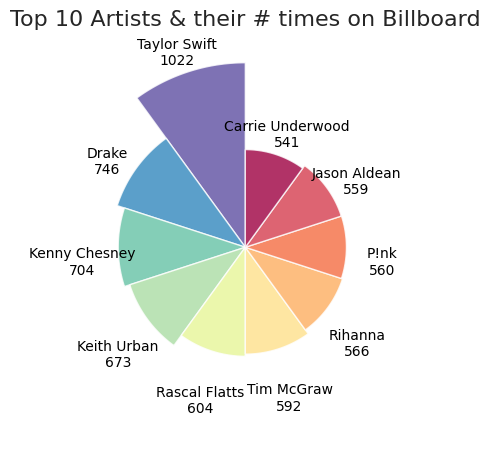

In [ ]:
values = df_rank['number'].head(10).to_numpy()
labels = df_rank['performer'].head(10).to_list()

# compute the coordinate
width = 2*np.pi/len(labels)
theta = np.linspace(0, 2*np.pi, len(labels), endpoint=False) + width/2
# Choose spectral as color palette
colors = get_map("Spectral", "diverging", len(labels), reverse=True).hex_colors

fig = plt.figure(figsize=(5, 7), dpi=100) 
ax = fig.add_subplot(111, projection="polar")
ax.bar(theta, values, width=width, color=colors, alpha=0.8)

for i in range(len(labels)):
    ax.text(theta[i], values[i] + 200, "{}\n{}".format(labels[i], values[i]), 
            color="black", va="top", ha="center")
    
ax.set_theta_direction(1) # Set rotation direction
ax.set_theta_offset(np.pi/2) # Set rotation start point
ax.set_axis_off() # Hide axes

ax.set_title("Top 10 Artists & their # times on Billboard", fontsize=16);

In [ ]:
# Top 10 Singers

# subset data frame with top 10 singers
index1 = df_stuff['Performer'].isin(labels)

df_stuff_top10 = df_stuff.loc[index1,]

df_stuff_top10_songp = df_stuff_top10[['SongID','Performer']]

df_stuff_top10_songp = df_stuff_top10_songp.drop_duplicates()

result2 = Counter(df_stuff_top10_songp['Performer'])


df_rank2 = pd.DataFrame.from_dict(result2, orient='index').reset_index()
df_rank2.columns=['performer','number']
df_rank2 = df_rank2.sort_values("number", axis = 0, ascending = False)
df_rank2['performer'].head(10)


values = df_rank2['number'].head(10).to_numpy()
labels = df_rank2['performer'].head(10).to_list()


findfont: Font family ['sans-serif'] not found. Falling back to DejaVu Sans.
findfont: Font family ['sans-serif'] not found. Falling back to DejaVu Sans.


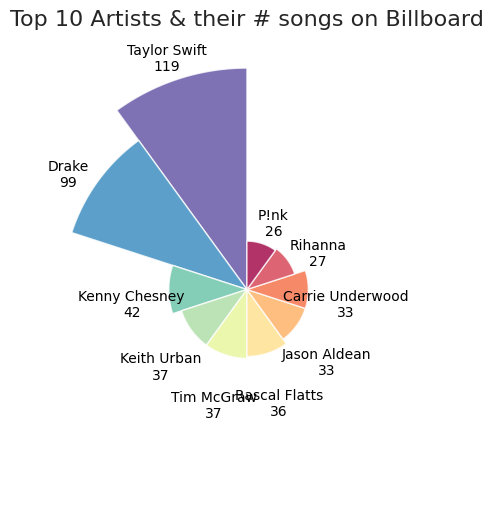

In [ ]:
# compute the coordinate
width = 2*np.pi/len(labels)
theta = np.linspace(0, 2*np.pi, len(labels), endpoint=False) + width/2
# Choose spectral as color palette
colors = get_map("Spectral", "diverging", len(labels), reverse=True).hex_colors

plt.rcParams['font.sans-serif'] = ['SimHei']
fig = plt.figure(figsize=(6, 7), dpi=100) 
ax = fig.add_subplot(111, projection="polar")
ax.bar(theta, values, width=width, color=colors, alpha=0.8)

for i in range(len(labels)):
    ax.text(theta[i], values[i] + 20, "{}\n{}".format(labels[i], values[i]), 
            color="black", va="top", ha="center")

ax.set_theta_direction(1) # Set rotation direction
ax.set_theta_offset(np.pi/2) # Set rotation start point
ax.set_axis_off() # Hide axes
ax.set_title("Top 10 Artists & their # songs on Billboard", fontsize=16);

#### Songs of Top 10 Artists
*  Use interactable radial plot to show the audio features of these artists' songs.
*  For each Top 10 artist, calculate the average of the audio feature value of his/her songs.
*  Using pivoting method, reshape the dataframe by turning values of a column into individual columns.

In [ ]:
index2 = df_features['Performer'].isin(labels)

#df_features_top10 = df_features.loc[index2,]

## merge data:
df_stuff_top10_songp

df_features_top10 = pd.merge(df_features,df_stuff_top10_songp,
         left_on=['SongID','Performer'],
         right_on=['SongID','Performer'],how='right') 

# subset:
df_features_top10 = df_features_top10[['SongID','Performer','danceability','speechiness','acousticness','liveness','energy']]

# aggregate:
agg_df_features_top10 = df_features_top10.groupby('Performer').mean()
agg_df_features_top10 = agg_df_features_top10.reset_index()

In [ ]:
# radial plot
pivot_agg_df_features_top10 = pd.melt(agg_df_features_top10, 
                                      id_vars =['Performer'], 
                                      value_vars =["acousticness",	"danceability",	"energy", "liveness","speechiness"])
pivot_agg_df_features_top10.columns = ["Performer", "feature", "value"] #renaming columns


fig = px.line_polar(pivot_agg_df_features_top10, r="value", theta="feature", color="Performer", 
                    line_close=True, color_discrete_sequence=colors)

fig.show()


### Information retrieving
**Movitation:** 
1. After the new millennium, the speed of people's preferences is changing day by day. We also wanted to understand whether for the five main audio features, there was a big change in the past decade compared to the previous 2 decades;
2. What if compared to the 60s, 70s, and 80s? Would people enjoy listening to old classic songs again? Will the audio features of the songs have a retro trend?
3. Compared to 5 decades ago, have genres that were popular in the early years fallen out of fashion? Is there a brand new genre appear?

**Conclusion:** 

1. Compared with 2000-2010, the songs of recent years have seen a slight rise in danceability and acousticness.
2. The most changed audio feature is energy, which down a lot.
3. Both the danceability and energy's folds has two waves, which somehow indicates that we are now experiencing a retro in energy similar to the Mid-90s, and danceability to the Early-2000s.

#### Which feature changed the most after 2000?
*  For the two year groups taken out, we need to do the distribution of the feature values separately, and then stack the dataframe to fit into the parameters of the seaborn function.

In [ ]:
df_side = audio_features_df[['group','acousticness','danceability','energy','liveness', 'speechiness']]
def rem(i):
    if str(i) == '2000-2010' or str(i) == '2010-2021':
        return i
    else:
        return ;
df_side['group'] = df_side['group'].apply(rem)
df_side.dropna(how='any',inplace=True)
print(df_side.head(5))

        group  acousticness  danceability  energy  liveness  speechiness
49  2010-2021        0.0527         0.613   0.764     0.197        0.136
50  2010-2021        0.0527         0.613   0.764     0.197        0.136
51  2010-2021        0.0527         0.613   0.764     0.197        0.136
52  2010-2021        0.0527         0.613   0.764     0.197        0.136
53  2010-2021        0.0527         0.613   0.764     0.197        0.136


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:7: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:8: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



In [ ]:
df_side = df_side.set_index('group')
df_side = df_side.stack()
df_side.index = df_side.index.rename('feature', level=1)
df_side.name = 'value'
df_side = df_side.reset_index()
df_side.head(10)

,group,feature,value
0,2010-2021,acousticness,0.0527
1,2010-2021,danceability,0.6130
2,2010-2021,energy,0.7640
3,2010-2021,liveness,0.1970
4,2010-2021,speechiness,0.1360
5,2010-2021,acousticness,0.0527
6,2010-2021,danceability,0.6130
7,2010-2021,energy,0.7640
8,2010-2021,liveness,0.1970
9,2010-2021,speechiness,0.1360


findfont: Font family ['sans-serif'] not found. Falling back to DejaVu Sans.
findfont: Font family ['sans-serif'] not found. Falling back to DejaVu Sans.


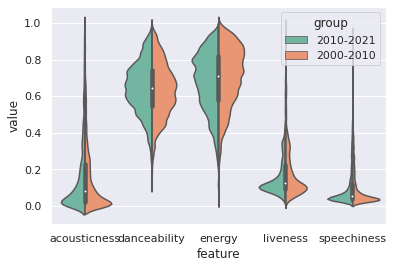

In [ ]:
sns.violinplot(x="feature", y="value", hue="group", data=df_side, palette="Set2",split=True)

*  Compared with more than a decade ago, the songs of recent years have seen a slight rise in danceability and acousticness
*  The most changed one is energy, which down a lot. Does this indicate that people begin to enjoy more soothing, or downbeat music to release their emotion?

In [ ]:
fig = go.Figure()

fig.add_trace(go.Violin(
    x=df_side['feature'][ df_side['group'] == '2000-2010' ],
    y=df_side['value'][ df_side['group'] == '2000-2010' ],
#     legendgroup='Yes', 
#     scalegroup='Yes', 
    name='2000-2010',
    side='negative',
    line_color='blue')
)

fig.add_trace(go.Violin(
    x=df_side['feature'][ df_side['group'] == '2010-2021' ],
    y=df_side['value'][ df_side['group'] == '2010-2021' ],
#     legendgroup='No', 
#     scalegroup='No', 
    name='2010-2021',
    side='positive',
    line_color='lightseagreen')
)

fig.update_traces(meanline_visible=True,  
                  scalemode='width')   # 'width', 'count'

fig.update_layout(violingap=0, violinmode='overlay')

fig.show()

#### Is there a retro trend in audio features?

* For each feature, take the average of all songs in that year.
* Use plotly to make line graph interactive. 
* Apply a Savitzky-Golay filter to smoothen the curve, otherwise there whould be breakpoints.

In [ ]:
fig = px.line()
label = audio_features_df['year'].apply(int).unique()
label.sort()
for i in ['acousticness','danceability','energy','liveness', 'speechiness']:
    d = audio_features_df.groupby(['year'])[i].mean()
    d = scipy.signal.savgol_filter(d, 15, 3)
    fig.add_scatter(x=label, y= d, name= i)
fig.show()

* We can find that both the danceability and energy's folds has two waves, which somehow indicates that we are now experiencing a retro in energy similar to the Mid-90s, and danceability to the Early-2000s.

#### Is the 50-year-ago popular genres declining now?
*  For each genre, count its occurrence in the whole data set.
*  Compute three intervals according to the quantile of the counts. 
*  Then divide genres into three groups according to the interval they fall into.
*  After getting low, middle and high groups representing the genre's frequency, we calculate the frequency of each genre for in and 2020separately and obtain the ranking of each genre in its own year.
*  Use `plotnine` based on `ggplot2`, we generate a Rank in Change plot layer by layer.


In [ ]:
df_genre = audio_features_df.set_index(['year'])['spotify_genre'].str.split(",", expand=True).stack().reset_index(drop=True, level=-1).reset_index().rename(columns={0: 'genre'})
def rep(i):
    i = str(i).replace('\'','').replace('[','').replace(']','')
    return i
df_genre['genre']=df_genre['genre'].apply(rep)
df_genre['number'] = ''
number = df_genre.groupby(['genre','year'])['number'].count()
list = []
for i in range(0,len(number)):
    list.append([number.index[i][0],number.index[i][1],number[i]])
df_ = pd.DataFrame(list)
df_ = df_.reset_index()
df_.columns = ['index','genre','year','number']
df_ = df_.drop(columns=['index']) 
print(df_['genre'].unique())

['' ' "childrens music"' ' adult standards' ... 'wu fam' 'yacht rock'
 'yodeling']


In [ ]:
#Divide the genres into three groups：high, middle, and low according to their frequency
sumn = df_.groupby(['genre'])['number'].sum()
sumn = pd.DataFrame({'sum':sumn})
dfn = pd.merge(df_,sumn,on='genre')
num = pd.qcut(dfn['sum'],3)
print(num.unique())
num1 = pd.DataFrame({'num':num})
dfn = pd.concat([dfn,num1],axis=1)
def n(i):
    if i == num.unique()[0]:
        return 'high'
    elif i == num.unique()[1]:
        return 'middle'
    elif i == num.unique()[2]:
        return 'low'
dfn['genre freq group'] = ''
dfn['genre freq group'] = dfn['num'].map(n)

[(1900.0, 46244.0], (0.999, 310.0], (310.0, 1900.0]]
Categories (3, interval[float64]): [(0.999, 310.0] < (310.0, 1900.0] < (1900.0, 46244.0]]


In [ ]:
#Generate the genre frequency ranking column of each year, and extract the ranking of 1970 and 2020
dfn['total_rank'] = dfn.groupby(['year'])['number'].rank(ascending=False,method='first')
a = dfn[dfn['year'].isin(['1970','2020'])]
a['rank1970'] = ''
a['rank2020'] = ''
a['rank1970'] = a['rank1970'].mask(a['year'] == '1970', a['total_rank'])
a['rank2020'] = a['rank2020'].mask(a['year'] == '2020', a['total_rank'])
a

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:4: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:5: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:6: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/st

,genre,year,number,sum,num,genre freq group,total_rank,rank1970,rank2020
12,,1970,593,23065,"(1900.0, 46244.0]",high,14.0,14,
62,,2020,18,23065,"(1900.0, 46244.0]",high,77.0,,77
83,album rock,1970,34,1503,"(310.0, 1900.0]",low,88.0,88,
112,alternative rock,1970,13,1991,"(1900.0, 46244.0]",high,165.0,165,
148,american folk revival,2020,8,152,"(0.999, 310.0]",middle,108.0,,108
...,...,...,...,...,...,...,...,...,...
14641,southern soul,1970,1,182,"(0.999, 310.0]",middle,278.0,278,
14661,sunshine pop,1970,2,132,"(0.999, 310.0]",middle,270.0,270,
14748,utah indie,1970,2,6,"(0.999, 310.0]",middle,271.0,271,
14762,viral rap,2020,3,3,"(0.999, 310.0]",middle,146.0,,146


In [ ]:
flag = 0
for i in a.groupby(['year']):
    if flag == 0:
        d1 = i[1]
        flag+=1
    else:
        d2 = i[1]
d1 = d1.drop(columns='rank2020')
d2 = d2.drop(columns='rank1970')
d = pd.merge(d1,d2,on=['genre','genre freq group','num','sum'])
d

,genre,year_x,number_x,sum,num,genre freq group,total_rank_x,rank1970,year_y,number_y,total_rank_y,rank2020
0,,1970,593,23065,"(1900.0, 46244.0]",high,14.0,14,2020,18,77.0,77
1,australian pop,1970,9,401,"(310.0, 1900.0]",low,186.0,186,2020,20,71.0,71
2,brill building pop,1970,711,20315,"(1900.0, 46244.0]",high,8.0,8,2020,42,47.0,47
3,canadian pop,1970,20,3636,"(1900.0, 46244.0]",high,120.0,120,2020,135,16.0,16
4,classic girl group,1970,38,1852,"(310.0, 1900.0]",low,78.0,78,2020,8,109.0,109
5,classic rock,1970,729,26133,"(1900.0, 46244.0]",high,7.0,7,2020,9,105.0,105
6,country,1970,102,22947,"(1900.0, 46244.0]",high,48.0,48,2020,447,7.0,7
7,country dawn,1970,19,5474,"(1900.0, 46244.0]",high,121.0,121,2020,48,42.0,42
8,country road,1970,15,20820,"(1900.0, 46244.0]",high,151.0,151,2020,426,9.0,9
9,dance pop,1970,3,13314,"(1900.0, 46244.0]",high,246.0,246,2020,124,18.0,18


/usr/local/lib/python3.7/dist-packages/plotnine/utils.py:1246: FutureWarning:

is_categorical is deprecated and will be removed in a future version.  Use is_categorical_dtype instead



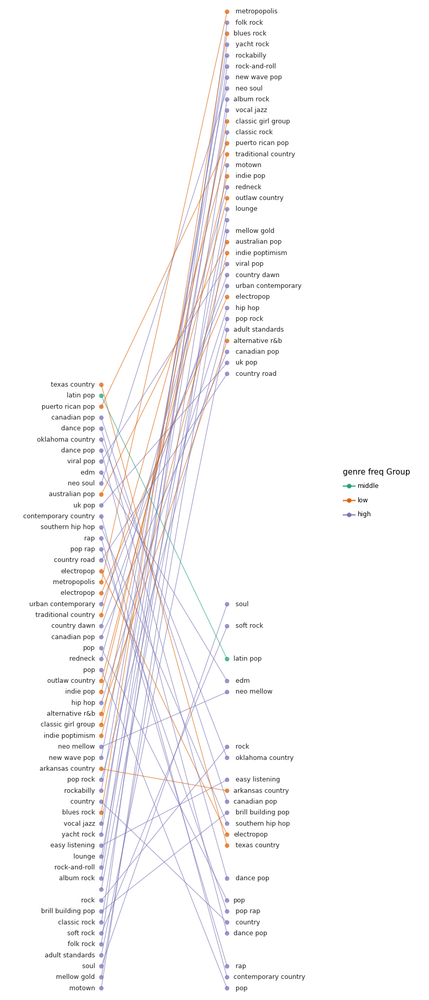

<ggplot: (8793548970625)>

In [ ]:
from plotnine import *

# Text colors
black1 = '#252525'
black2 = '#222222'

# Gallery Plot

(ggplot(d)
 # Slight modifications for the original lines,
 # 1. Nudge the text to either sides of the points
 # 2. Alter the color and alpha values
 + geom_text(aes(1, 'rank1970', label='genre'), nudge_x=-0.05, ha='right', size=9, color=black1)
 + geom_text(aes(2, 'rank2020', label='genre'), nudge_x=0.05, ha='left', size=9, color=black1)
 + geom_point(aes(1, 'rank1970', color='genre freq group'), size=2.5, alpha=.7)
 + geom_point(aes(2, 'rank2020', color='genre freq group'), size=2.5, alpha=.7)
 + geom_segment(aes(x=1, y='rank1970', xend=2, yend='rank2020', color='genre freq group'), alpha=.7)
# Text Annotations
 + annotate('text', x=1, y=0, label='Rank in 1970', fontweight='bold', ha='right', size=10, color=black2)
 + annotate('text', x=2, y=0, label='Rank in 2020', fontweight='bold', ha='left', size=10, color=black2)
 + annotate('text', x=1.5, y=0, label='Lines show change in rank', size=9, color=black1)
  # Prevent genre names from being chopped off
 + lims(x=(0.35, 2.65))
 + labs(color='genre freq Group')
 # Change colors
 + scale_color_brewer(type='qual', palette=2)
 # Removes all decorations
 + theme_void()
 # Changing the figure size prevents the genre names from squishing up
 + theme(figure_size=(8, 25))
 )



*  Genres like metropopolis, folk music, rock-related, and new wave pop have risen compared to 50 years ago. 
*  The whole graph is skewed upwards, indicating that most of the highly ranked genres in 1970 have disappeared by 2020.
*  Most of the rising genres are low-frequency niche genres, while the falling ones are high-frequency usual genres. 
*  The middle group genres barely appearing at both 1970 and 2020, except for latin pop. This indicates that most of genres either be newly created or disappear by 2020.

## Pitchfork Dataset EDA



### Dataloading and information retrieval

In [ ]:
#set up 
import sqlite3, datetime
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from scipy.signal import savgol_filter

from scipy.stats import linregress
from scipy.stats import ttest_rel

pd.set_option('precision', 2)
np.set_printoptions(precision=2)


#con = sqlite3.connect('/content/pitchfork.db')
from google.colab import drive
drive.mount('/content/drive')
con = sqlite3.connect('/content/drive/MyDrive/pitchfork.db')


In [ ]:
#put data into pd dataframes 
reviews = pd.read_sql('SELECT * FROM reviews', con)
genres = pd.read_sql('SELECT * FROM genres', con)
con.close()

### Database schema and dataframe

The information contained in the databas are are follows.

In [ ]:
# ---------- DB SCHEMA ----------
# 	-- reviewid
# 	-- album title
#   -- Artists (as a string)
#   -- score (float)
#   -- author name
#   -- author type
#   -- best new music (boolean)
# 	-- publication timestamp string
# 	-- publication day of week
# 	-- publication day of month
#   -- publication day of year
#   -- publication month
#   -- publication year
#   -- publication unix timestamp

We can now access these features through panda dataframes. Let's take a quick look at our review datafram:

In [ ]:
reviews.head(10)

,reviewid,title,artist,url,score,best_new_music,author,author_type,pub_date,pub_weekday,pub_day,pub_month,pub_year
0,22703,mezzanine,massive attack,http://pitchfork.com/reviews/albums/22703-mezz...,9.3,0,nate patrin,contributor,2017-01-08,6,8,1,2017
1,22721,prelapsarian,krallice,http://pitchfork.com/reviews/albums/22721-prel...,7.9,0,zoe camp,contributor,2017-01-07,5,7,1,2017
2,22659,all of them naturals,uranium club,http://pitchfork.com/reviews/albums/22659-all-...,7.3,0,david glickman,contributor,2017-01-07,5,7,1,2017
3,22661,first songs,"kleenex, liliput",http://pitchfork.com/reviews/albums/22661-firs...,9.0,1,jenn pelly,associate reviews editor,2017-01-06,4,6,1,2017
4,22725,new start,taso,http://pitchfork.com/reviews/albums/22725-new-...,8.1,0,kevin lozano,tracks coordinator,2017-01-06,4,6,1,2017
5,22722,insecure (music from the hbo original series),various artists,http://pitchfork.com/reviews/albums/22722-inse...,7.4,0,vanessa okoth-obbo,contributor,2017-01-05,3,5,1,2017
6,22704,stillness in wonderland,little simz,http://pitchfork.com/reviews/albums/22704-litt...,7.1,0,katherine st. asaph,contributor,2017-01-05,3,5,1,2017
7,22694,tehillim,yotam avni,http://pitchfork.com/reviews/albums/22694-tehi...,7.0,0,andy beta,contributor,2017-01-05,3,5,1,2017
8,22714,reflection,brian eno,http://pitchfork.com/reviews/albums/22714-refl...,7.7,0,andy beta,contributor,2017-01-04,2,4,1,2017
9,22724,filthy america its beautiful,the lox,http://pitchfork.com/reviews/albums/22724-filt...,5.3,0,ian cohen,contributor,2017-01-04,2,4,1,2017


We also have a genre dataframe that can be joined to give a more thorough picture of the reviews. 

In [ ]:
genres.head(10)

,reviewid,genre
0,22703,electronic
1,22721,metal
2,22659,rock
3,22661,rock
4,22725,electronic
5,22722,None
6,22704,rap
7,22694,electronic
8,22714,experimental
9,22724,rap


### Basic statistics


Let's explore some basic statistics about the dataset such as the average and the standard deviation of the review scores. 

In [ ]:

print('\nAverages:')
print(np.mean(reviews[['best_new_music', 'score']]))

print('\nStandard Deviation:')
print(np.std(reviews[['best_new_music', 'score']]))


Averages:
best_new_music    0.05
score             7.01
dtype: float64

Standard Deviation:
best_new_music    0.22
score             1.29
dtype: float64


We would also like to visualize the review distribution along scores. To do that, we group the dataset by score and get the sum of the best_new_music as well as the count of best_new_music, which should be the number of reviews. Then we plot the smoothed curve after applying Savitzky-Golay filter. 

In [ ]:
g = reviews.groupby('score')
score_dist = g['best_new_music'].agg(['sum','count'])
score_dist['count'] = savgol_filter(score_dist['count'], 5, 1)
score_dist['sum'] = savgol_filter(score_dist['sum'], 5, 1)
score_dist=score_dist.rename(columns={"sum": "Best New Music", "count":"All Reviews"})

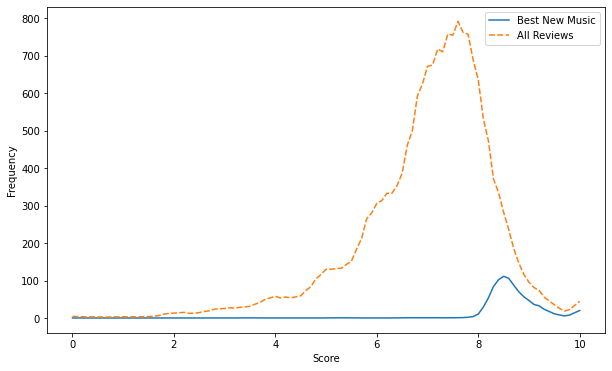

In [ ]:
score_dist_plot = sns.lineplot(data = score_dist)
score_dist_plot.set(xlabel="Score",ylabel="Frequency")
plt.gcf().set_size_inches(10, 6)

As we can see from the statistics and the graph, both the review score the the best new music rating is normally distributed with a negative skew. The average score of the reviews is 7.01 with a standard deviation of 1.29. Those that are reviewed as the best music mostly fall in the score range above 8. Only 5% of the music are rated to be the best music. 

### review score and best new music 

Are there albums that get a perfect score? Let's take a look at them.

In [ ]:
reviews[reviews.score == 10.0][['artist', 'title', 'pub_date']]

,artist,title,pub_date
191,public image ltd,metal box,2016-11-01
200,bob dylan,blood on the tracks,2016-10-30
355,brian eno,another green world,2016-09-18
451,stevie wonder,songs in the key of life,2016-08-21
530,nina simone,in concert,2016-07-30
...,...,...,...
17199,...and you will know us by the trail of dead,source tags and codes,2002-02-28
17544,john coltrane,the olatunji concert: the last live recording,2001-10-15
17900,radiohead,kid a,2000-10-02
18071,pink floyd,animals,2000-04-25


How many albums are rated as the best new music? Let's take a look at them.

In [ ]:
# best new music albums? 
reviews[reviews.best_new_music == 1][['artist', 'title', 'pub_date']]
len(reviews[reviews.best_new_music == 1][['artist', 'title', 'pub_date']])


,artist,title,pub_date
3,"kleenex, liliput",first songs,2017-01-06
11,run the jewels,run the jewels 3,2017-01-03
28,ray charles,swiss radio days vol. 41 - zurich 1961,2016-12-22
50,pink floyd,the early years 1965-1972,2016-12-14
56,various artists,bobo yy: belle poque in upper volta,2016-12-10
...,...,...,...
16353,the soft pink truth,do you party?,2003-02-04
16359,broken social scene,you forgot it in people,2003-02-02
16401,the microphones,mount eerie,2003-01-20
16404,the angels of light,everything is good here/please come home,2003-01-20


Are there albums that get best new music but did not score 10?

In [ ]:

reviews[(reviews.best_new_music == 1) & (reviews.score != 10.0)][['artist', 'title', 'pub_date']]

,artist,title,pub_date
3,"kleenex, liliput",first songs,2017-01-06
11,run the jewels,run the jewels 3,2017-01-03
28,ray charles,swiss radio days vol. 41 - zurich 1961,2016-12-22
50,pink floyd,the early years 1965-1972,2016-12-14
56,various artists,bobo yy: belle poque in upper volta,2016-12-10
...,...,...,...
16353,the soft pink truth,do you party?,2003-02-04
16359,broken social scene,you forgot it in people,2003-02-02
16401,the microphones,mount eerie,2003-01-20
16404,the angels of light,everything is good here/please come home,2003-01-20


Are there albums that score 10 but are not rated as the best new music?

In [ ]:
reviews[(reviews.best_new_music == 0) & (reviews.score == 10.0)][['artist', 'title', 'pub_date']]


,artist,title,pub_date
200,bob dylan,blood on the tracks,2016-10-30
355,brian eno,another green world,2016-09-18
451,stevie wonder,songs in the key of life,2016-08-21
530,nina simone,in concert,2016-07-30
654,neil young,tonight's the night,2016-06-26
706,kate bush,hounds of love,2016-06-12
857,prince,"sign ""o"" the times",2016-04-30
858,prince,1999,2016-04-30
861,"prince, the revolution",purple rain,2016-04-29
862,prince,dirty mind,2016-04-29


### Explore by Genre

Let's explore by genre and see if we can get some useful insights! 

The key questions that we want to ask are:


*   IS certain genres getting higher average score?
*   IS certain genres more likely to be best new music?
*   IS certain genres more likely to be best new music?
*   IS certain genre getting more reviews? And is such high number of review more likely to give them higher ratings?


Let's start by merging the full table with the genre table on review id 

In [ ]:
merged_data = pd.merge(reviews, genres, 
                  on = 'reviewid')
#select useful column
genre_data = merged_data[['reviewid','score','best_new_music','genre']]

group the data by genre, and get count of score(which is number of reviews), mean and std of score

In [ ]:
g = genre_data.groupby('genre')
genre_dist = g['score'].agg(['count', 'mean', 'std']).reset_index()

get the sum of best_new_music and append it to genre distribution table 

In [ ]:
best_mu = g['best_new_music'].agg(['sum']).reset_index()
genre_dist['best_new_music']= best_mu['sum']


divide number of best_new_music by count(number of reviews) to get the likelihood of a genre to be rated as best new music 

In [ ]:
genre_dist['likely_best_new_music'] = genre_dist['best_new_music']/genre_dist['count']

In [ ]:
genre_dist

,genre,count,mean,std,best_new_music,likely_best_new_music
0,electronic,3874,6.92,1.31,187,0.05
1,experimental,1815,7.34,1.11,122,0.07
2,folk/country,685,7.20,1.06,27,0.04
3,global,219,7.43,1.01,9,0.04
4,jazz,435,7.30,1.25,17,0.04
5,metal,862,6.95,1.39,26,0.03
6,pop/r&b,1432,6.88,1.30,85,0.06
7,rap,1559,6.90,1.30,79,0.05
8,rock,9438,6.94,1.36,530,0.06


Let's make a plot to visualize the number of reviews, the average scores, and the likelihood of getting reviewed as best new music for each genre using seaborn. 

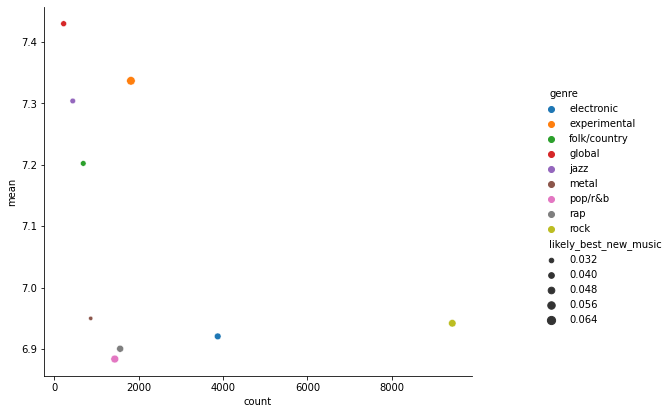

In [ ]:
genre_dist_plot = sns.relplot(data = genre_dist, x="count",y ="mean", hue="genre", size="likely_best_new_music" )
plt.gcf().set_size_inches(10, 6)


Analysis:  

Each dot on the graph represents one genre in the reviews. The dots that lie towards the right-hand side have higher number of reviews than those that lie on the left, and the dots that lie on top of others have higher average scores than those below them. In addition, the bigger the dot size is, the more likely the genre it represents is to be rated as the best new music. Thus, we can infer rom the graph that rock music has the most numbrer of reviews, followed by electronic music, which has not even half the number of reviews of rock. However, high number of reviews doesn't imply high average score. In fact, those genres that have high humber of reviews have average scores that fall in the lower range. The genre that get highest review score is global music, followed by experimental music, jazz, and folk/country music, which all have average scores higher than the total average. We can also see that experimental is the mostly likely genre to be rated as best new music. 

### Are features correlated with each other?

In order to get the correlation matrix, we have to one-hot encode any cagtegorical data in our dataset, which would be genre.

In [ ]:
merged_data_OH = pd.get_dummies(merged_data,columns=['genre'])

In [ ]:
merged_data_OH.head(10)

,reviewid,title,artist,url,score,best_new_music,author,author_type,pub_date,pub_weekday,pub_day,pub_month,pub_year,genre_electronic,genre_experimental,genre_folk/country,genre_global,genre_jazz,genre_metal,genre_pop/r&b,genre_rap,genre_rock
0,22703,mezzanine,massive attack,http://pitchfork.com/reviews/albums/22703-mezz...,9.3,0,nate patrin,contributor,2017-01-08,6,8,1,2017,1,0,0,0,0,0,0,0,0
1,22721,prelapsarian,krallice,http://pitchfork.com/reviews/albums/22721-prel...,7.9,0,zoe camp,contributor,2017-01-07,5,7,1,2017,0,0,0,0,0,1,0,0,0
2,22659,all of them naturals,uranium club,http://pitchfork.com/reviews/albums/22659-all-...,7.3,0,david glickman,contributor,2017-01-07,5,7,1,2017,0,0,0,0,0,0,0,0,1
3,22661,first songs,"kleenex, liliput",http://pitchfork.com/reviews/albums/22661-firs...,9.0,1,jenn pelly,associate reviews editor,2017-01-06,4,6,1,2017,0,0,0,0,0,0,0,0,1
4,22725,new start,taso,http://pitchfork.com/reviews/albums/22725-new-...,8.1,0,kevin lozano,tracks coordinator,2017-01-06,4,6,1,2017,1,0,0,0,0,0,0,0,0
5,22722,insecure (music from the hbo original series),various artists,http://pitchfork.com/reviews/albums/22722-inse...,7.4,0,vanessa okoth-obbo,contributor,2017-01-05,3,5,1,2017,0,0,0,0,0,0,0,0,0
6,22704,stillness in wonderland,little simz,http://pitchfork.com/reviews/albums/22704-litt...,7.1,0,katherine st. asaph,contributor,2017-01-05,3,5,1,2017,0,0,0,0,0,0,0,1,0
7,22694,tehillim,yotam avni,http://pitchfork.com/reviews/albums/22694-tehi...,7.0,0,andy beta,contributor,2017-01-05,3,5,1,2017,1,0,0,0,0,0,0,0,0
8,22714,reflection,brian eno,http://pitchfork.com/reviews/albums/22714-refl...,7.7,0,andy beta,contributor,2017-01-04,2,4,1,2017,0,1,0,0,0,0,0,0,0
9,22724,filthy america its beautiful,the lox,http://pitchfork.com/reviews/albums/22724-filt...,5.3,0,ian cohen,contributor,2017-01-04,2,4,1,2017,0,0,0,0,0,0,0,1,0


We'll then create a correlation matric, and then plot the heatmap using seaborn to evaluate the correlation among features. 

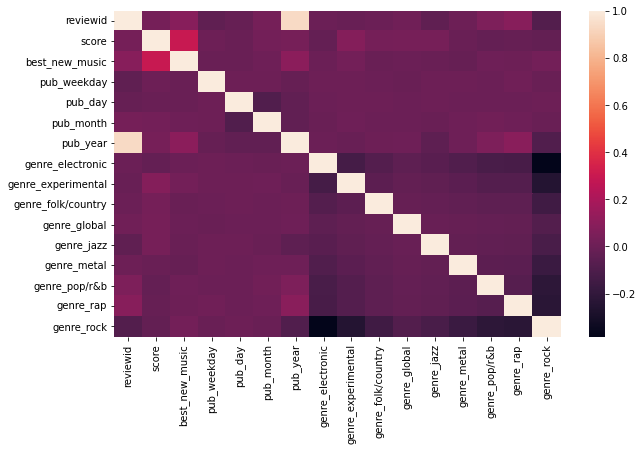

In [ ]:
corr = merged_data_OH.corr()
sns.heatmap(corr)
plt.gcf().set_size_inches(10, 6)

Analysis:

Looking at the heatmap, we can barely see any high correlations except the pair of score and best_new_music. Higher scores is obviously associated with a higher chance of getting rated as best new music. Review Id contains publication year, which leads to the two white squres that represent 1.0 correlation. Publicaiotn year and best new music is slightly correlated, which might be attri butable to the fact that the best new music function has only come out in recent years. Publication year and genre rap is slightly correlated, and score and genre 
experimental are also slightly associated, which might be because experimental music  gets second highest average score and is the genre that is mostly likely to be rated as best new music , which is also highly associarted with scores. Thre results corresponds to our previous findings. 


### Further exploration - Pairplot

Another method to explore the relationship among features is to use the pairplot function in seaborn. We will use hue equal genre so that each color represent a different genre.

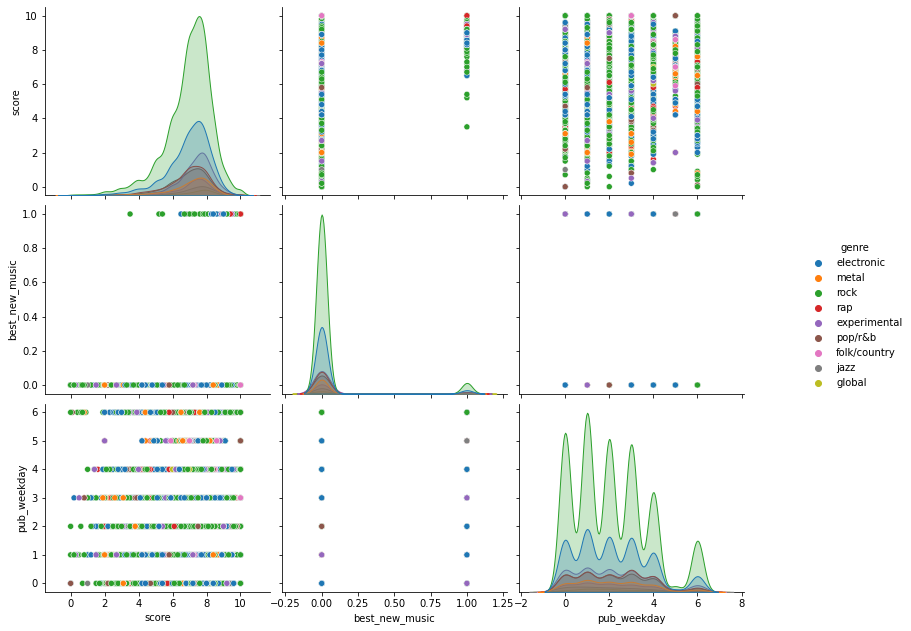

In [ ]:
sns.pairplot(merged_data[['score','best_new_music','pub_weekday','genre']],hue='genre')
plt.gcf().set_size_inches(13, 9)

#### score vs best new music


Again, albums that are no rated as best new music falls into all score ranges, but those that are rated are best new music have scores that are in higher end. Only one album is that is rated to be best new music has a score lower than 5.0

#### score vs pub_weekdays

From the third graph in the first row, people might tend to be milder on criticism on Fridays.

#### best_new_music vs pu_weekdays 

This graph is giving us no clear infomation, we need to modify the dataframe a little bit to explore this question: Are people more likely to rate music as best new music on certain day of the week?

Let's start by grouping the dataset by pub_weekdays 

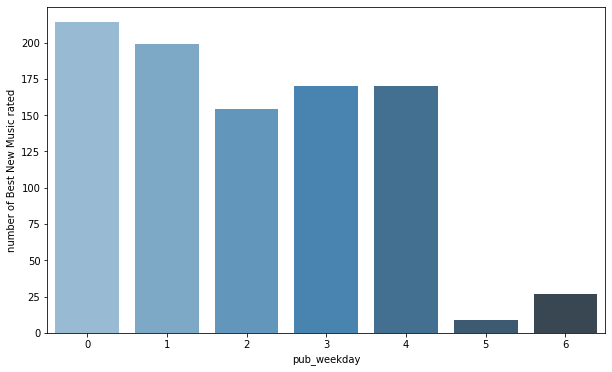

In [ ]:
p = reviews.groupby('pub_weekday')
#get the sum of best new music
p_dist = p['best_new_music'].agg(['sum']).reset_index()
p_dist=p_dist.rename(columns={"sum": "number of Best New Music rated"})
p_dist_plot = sns.barplot(x="pub_weekday", y="number of Best New Music rated", data=p_dist, palette="Blues_d")
plt.gcf().set_size_inches(10, 6)

It seems that people are most likely to rate music as best music on Sundays, and they are much less likely to do that on Friday and Saturdays. 

### Explore by Album


The Key Question that we want to ask is :

* is number of reviews correlated with average score of certain album 

* is number of reviews correlated with best new music of certain album

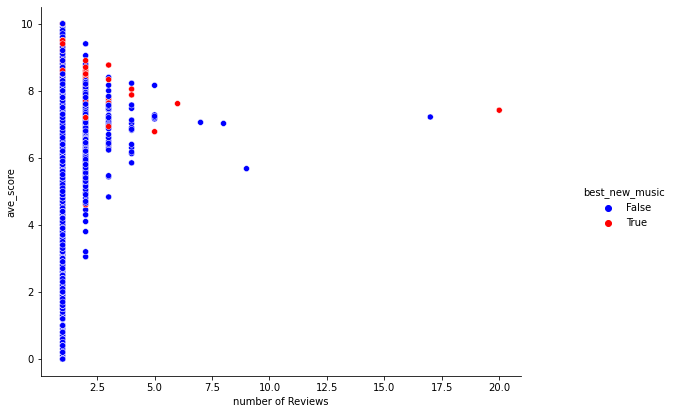

In [ ]:
#group by album title 
a = reviews.groupby('title')
#get the sum of best new music
a_dist = a['best_new_music'].agg(['sum'])
#get average score and count for each album(which is number of reviews)
ave = a['score'].agg(['mean', 'count'])
ave_score = ave['mean']
num_r = ave['count']
a_dist["number of Reviews"] = num_r
a_dist['ave_score']=ave_score
a_dist=a_dist.rename(columns={"sum": "Best New Music"})
#turn numerical values into boolean for best new music for each album
a_dist["best_new_music"] = (a_dist["Best New Music"]>0)

#plot
a_dist_plot = sns.relplot(data = a_dist, x="number of Reviews",y ="ave_score", hue="best_new_music" ,palette=["b", "r"])
plt.gcf().set_size_inches(10, 6)

Analysis:

In the graph, each dot is an album in the dataset. X axis is number of review. Y axis is average score. Orange represents that at least one person rates it best new music, and blue represents that none rates  it best new music. The results shows that higher number of reviews, which probably implies higher popularity, doesn't necessarity associae with higher scores. In fact, as the number of review increases, the range of average score of an album shrinks and the average score itself converges to the total average around 7. 


Number of reviews seems not to be associated with best new music ratings, as we can see that orange dots nicely distributed across x axis. 


# Model Training & Prediction

## Package Import & Helper Function

## Combine DataFrames

In [ ]:
df_features.drop(columns=['Performer','Song','spotify_genre','spotify_track_id','spotify_track_preview_url','spotify_track_album'], inplace=True)

In [ ]:
df_combine = pd.merge(df_features,df_stuff,on='SongID',how='inner')

In [ ]:
df_combine.dropna(axis=0, inplace=True)

In [ ]:
df_combine = df_combine.join(pd.get_dummies(df_combine.key))

In [ ]:
df_combine = df_combine.groupby('SongID').head(6)

In [ ]:
df_combine = df_combine.set_index(['WeekID','SongID'])

In [ ]:
df_combine = pd.merge(df_combine, df_ranking, on = 'Song', how='inner')

In [ ]:
df_combine['label'] = df_combine['ranking change'].transform(lambda x: 1 if x>0 else 0)
drop = ['Week Position_y','ranking change']
df_combine.drop(columns= drop, inplace = True)

In [ ]:
df_combine.head(10)

,spotify_track_duration_ms,spotify_track_explicit,danceability,energy,key,loudness,mode,speechiness,acousticness,instrumentalness,liveness,valence,tempo,time_signature,spotify_track_popularity,url,Week Position_x,Song,Performer,Instance,Previous Week Position,Peak Position,Weeks on Chart,0.0,1.0,2.0,3.0,4.0,5.0,6.0,7.0,8.0,9.0,10.0,11.0,label
0,166106.0,0.0,0.15,0.18,5.0,-14.06,1.0,0.03,0.91,2.67e-04,0.11,0.15,83.97,4.0,38.0,http://www.billboard.com/charts/hot-100/1965-0...,61,......And Roses And Roses,Andy Williams,1,78.0,61,2,0,0,0,0,0,1,0,0,0,0,0,0,0
1,166106.0,0.0,0.15,0.18,5.0,-14.06,1.0,0.03,0.91,2.67e-04,0.11,0.15,83.97,4.0,38.0,http://www.billboard.com/charts/hot-100/1965-0...,61,......And Roses And Roses,Andy Williams,1,78.0,61,2,0,0,0,0,0,1,0,0,0,0,0,0,0
2,166106.0,0.0,0.15,0.18,5.0,-14.06,1.0,0.03,0.91,2.67e-04,0.11,0.15,83.97,4.0,38.0,http://www.billboard.com/charts/hot-100/1965-0...,61,......And Roses And Roses,Andy Williams,1,78.0,61,2,0,0,0,0,0,1,0,0,0,0,0,0,0
3,166106.0,0.0,0.15,0.18,5.0,-14.06,1.0,0.03,0.91,2.67e-04,0.11,0.15,83.97,4.0,38.0,http://www.billboard.com/charts/hot-100/1965-0...,50,......And Roses And Roses,Andy Williams,1,61.0,50,3,0,0,0,0,0,1,0,0,0,0,0,0,0
4,166106.0,0.0,0.15,0.18,5.0,-14.06,1.0,0.03,0.91,2.67e-04,0.11,0.15,83.97,4.0,38.0,http://www.billboard.com/charts/hot-100/1965-0...,50,......And Roses And Roses,Andy Williams,1,61.0,50,3,0,0,0,0,0,1,0,0,0,0,0,0,0
5,166106.0,0.0,0.15,0.18,5.0,-14.06,1.0,0.03,0.91,2.67e-04,0.11,0.15,83.97,4.0,38.0,http://www.billboard.com/charts/hot-100/1965-0...,50,......And Roses And Roses,Andy Williams,1,61.0,50,3,0,0,0,0,0,1,0,0,0,0,0,0,0
6,166106.0,0.0,0.15,0.18,5.0,-14.06,1.0,0.03,0.91,2.67e-04,0.11,0.15,83.97,4.0,38.0,http://www.billboard.com/charts/hot-100/1965-0...,36,......And Roses And Roses,Andy Williams,1,37.0,36,6,0,0,0,0,0,1,0,0,0,0,0,0,0
7,166106.0,0.0,0.15,0.18,5.0,-14.06,1.0,0.03,0.91,2.67e-04,0.11,0.15,83.97,4.0,38.0,http://www.billboard.com/charts/hot-100/1965-0...,36,......And Roses And Roses,Andy Williams,1,37.0,36,6,0,0,0,0,0,1,0,0,0,0,0,0,0
8,166106.0,0.0,0.15,0.18,5.0,-14.06,1.0,0.03,0.91,2.67e-04,0.11,0.15,83.97,4.0,38.0,http://www.billboard.com/charts/hot-100/1965-0...,36,......And Roses And Roses,Andy Williams,1,37.0,36,6,0,0,0,0,0,1,0,0,0,0,0,0,0
9,166106.0,0.0,0.15,0.18,5.0,-14.06,1.0,0.03,0.91,2.67e-04,0.11,0.15,83.97,4.0,38.0,http://www.billboard.com/charts/hot-100/1965-0...,37,......And Roses And Roses,Andy Williams,1,40.0,37,5,0,0,0,0,0,1,0,0,0,0,0,0,0


In [ ]:
len(df_combine)

347358

In [ ]:
df_combine['label'].unique()

array([0, 1])

## Logistic Regression Model with SkLearn

We will first build a Logistic Regression model with sciKit Learn. We will define a logistic regression model, train it on our trainting set, and evaluate its performance on the test set. 

### Data Preparation

We're going to use all the columns except url, Song, and Performer, which are strings and could not be fed into the model, as our features and the last column as our label. 

In [ ]:
features = df_combine.columns
drop = ['url','Song','Performer']
features = features[:-1]
features = features.drop(drop)
features

Index(['spotify_track_duration_ms',    'spotify_track_explicit',
                    'danceability',                    'energy',
                             'key',                  'loudness',
                            'mode',               'speechiness',
                    'acousticness',          'instrumentalness',
                        'liveness',                   'valence',
                           'tempo',            'time_signature',
        'spotify_track_popularity',           'Week Position_x',
                        'Instance',    'Previous Week Position',
                   'Peak Position',            'Weeks on Chart',
                               0.0,                         1.0,
                               2.0,                         3.0,
                               4.0,                         5.0,
                               6.0,                         7.0,
                               8.0,                         9.0,
                         

In [ ]:
features = df_combine[features]

In [ ]:
features.columns

Index(['spotify_track_duration_ms',    'spotify_track_explicit',
                    'danceability',                    'energy',
                             'key',                  'loudness',
                            'mode',               'speechiness',
                    'acousticness',          'instrumentalness',
                        'liveness',                   'valence',
                           'tempo',            'time_signature',
        'spotify_track_popularity',           'Week Position_x',
                        'Instance',    'Previous Week Position',
                   'Peak Position',            'Weeks on Chart',
                               0.0,                         1.0,
                               2.0,                         3.0,
                               4.0,                         5.0,
                               6.0,                         7.0,
                               8.0,                         9.0,
                         

In [ ]:
labels = df_combine['label']

In [ ]:
labels

0         0
1         0
2         0
3         0
4         0
         ..
347353    0
347354    0
347355    0
347356    0
347357    0
Name: label, Length: 347358, dtype: int64

Split the data using train_test_split, and we're using a test size of 0.2.

In [ ]:
from sklearn.model_selection import train_test_split
# split the data into train and test dataset 
x_train, x_test, y_train, y_test = train_test_split(features,labels,test_size = 0.2, random_state = 42)

### Model and Fit

Import Logistic Regression from sklearn, create the model, and fit it on training data. 

In [ ]:
from sklearn.linear_model import LogisticRegression

# create model 
lr = LogisticRegression()
lr.fit(x_train,y_train)
y_pred = lr.predict(x_test)

/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:1679: FutureWarning:

Feature names only support names that are all strings. Got feature names with dtypes: ['float', 'str']. An error will be raised in 1.2.

/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:1679: FutureWarning:

Feature names only support names that are all strings. Got feature names with dtypes: ['float', 'str']. An error will be raised in 1.2.



### Evaluate Performance

Use the score functino of the model to get the model accuracy score. 

In [ ]:
#scikit learn model accuracy 

sklearn_logistic_Reg_acc= lr.score(x_test,y_test)
print(sklearn_logistic_Reg_acc)

0.7390891294334409


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:1679: FutureWarning:

Feature names only support names that are all strings. Got feature names with dtypes: ['float', 'str']. An error will be raised in 1.2.



Analysis:

We get a result of 73.9% as our model accuracy, which is acceptable not not enough. 

## Random Forest Model

###Split Data into Train and Test
Use sklearn's train_test_split library and split data into train and test sets, the split should be 80-20 meaning 80% for training and rest for testing. 

In [ ]:
features = df_combine[['spotify_track_duration_ms', 'spotify_track_explicit','danceability',
                       'energy','key','loudness','mode','speechiness','acousticness','instrumentalness',
                       'liveness','valence','tempo','time_signature','spotify_track_popularity','Week Position_x',
                       'Instance','Previous Week Position','Peak Position','Weeks on Chart',]]
labels = df_combine['label'] 

In [ ]:
from sklearn.model_selection import train_test_split
x_train, x_test, y_train, y_test = train_test_split(features, labels, test_size= 0.2, random_state= 42)

### Train Machine Learning Models
After splitting them, our next step is to train our model.

#### Naive Bayes Classifier

We will stat off by useing the `GaussianNB` package in sklearn to perform Naive Bayes classification. Initialize the model with default parameters, train using the training data, and then make predictions on the test set.

In [ ]:
from sklearn.naive_bayes import GaussianNB
# Model:
# https://scikit-learn.org/stable/modules/generated/sklearn.naive_bayes.GaussianNB.html
clf = GaussianNB()
clf.fit(x_train, y_train)
y_pred = clf.predict(x_test)

# Accuracy:
# https://scikit-learn.org/stable/modules/generated/sklearn.metrics.accuracy_score.html
from sklearn.metrics import accuracy_score
naive_bayes_acc= accuracy_score(y_test, y_pred)
print(naive_bayes_acc)


0.7285381160755412


0.73...Well, that does not seem promising.
Wait, remember we mentioned in the previous section that we want to use PCA to reduce multicolinearity? It can also reduce noise and speed up the process! Why don't we try that!

####Dimensionality Reduction with PCA

Use Principal component analysis to reduce number of dimensions of the dataset, as we found a lot of features are correlated in the EDA part.

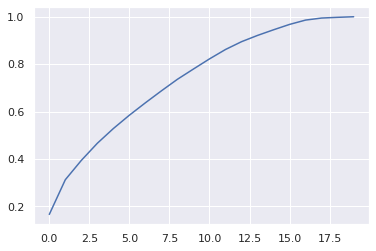

In [ ]:
# Scaling & find the number of components to use

import numpy as np
from sklearn.decomposition import PCA
from sklearn.preprocessing import StandardScaler

scaler = StandardScaler().fit(x_train)
x_train = scaler.transform(x_train)
x_test = scaler.transform(x_test)

pca_model = PCA(n_components = 20)
x2 = pca_model.fit_transform(x_train)

explained_variance_ratio = pca_model.explained_variance_ratio_
plt.plot(explained_variance_ratio.cumsum())

Use the plot to decide the number of components to keep. We chose to keep **16**, which explains ovwe 95% of variance in the dataset. 

In [ ]:
# Decide to keep 16 components
pca = PCA(n_components = 16)
pca.fit(x_train)
x_train = pca.transform(x_train)
x_test = pca.transform(x_test)

####Random Forest

Use grid search and train a random forest model on the transformed train dataset. 

Split X into subsets and train a classifier on each of the subsets. Because each is seeing a different piece of the data and each specializes in different ways, each classifier will be a different decision tree. The overall classifier combines the votes of ensemble members and will go with majority

In [ ]:
from sklearn.ensemble import RandomForestClassifier
from sklearn.model_selection import GridSearchCV
rf = RandomForestClassifier(n_estimators = 32, max_depth = 30)

rf.fit(x_train, y_train)
y_pred = rf.predict(x_test)
test_accuracy = accuracy_score(y_test, y_pred)

print(test_accuracy)

0.9926301243666513


99.2% of accuracy? That's amazing! A huge improvement from our previous result.

## LSTM Model

### Feature Engineering

#### Generate Derived Feature

For the review dataset, generated content word count as a derived feature

In [ ]:
import pandas as pd

df_content= pd.read_sql("select * from content ",con=mydb)

df_content.head(5)

import string
import re

def remove_punct(text):
    text  = "".join([char for char in text if char not in string.punctuation])
    text = re.sub('[0-9]+', '', text)
    return text

df_content['content'] = df_content['content'].apply(lambda x: remove_punct(x))
df_content['content_len'] = df_content['content'].str.len()
df_content = df_content[['reviewid','content_len']]
df_content.head(5)

,reviewid,content_len
0,22703,9020
1,22721,2712
2,22659,3480
3,22661,7452
4,22725,3130


#### Combine All Review Features

In [ ]:
df_genres= pd.read_sql("select * from genres ",con=mydb)
df_years= pd.read_sql("select * from years ",con=mydb)
df_info = pd.merge(df_genres,df_years, on='reviewid',how='inner')
df_reviews_combime = pd.merge(df_info,df_reviews,on='reviewid',how='inner')

df_reviews_combime.head(5)

,reviewid,genre,year,title,artist,url,score,best_new_music,author,author_type,pub_date,pub_weekday,pub_day,pub_month,pub_year
0,22703,electronic,1998.0,mezzanine,massive attack,http://pitchfork.com/reviews/albums/22703-mezz...,9.3,0,nate patrin,contributor,2017-01-08,6,8,1,2017
1,22721,metal,2016.0,prelapsarian,krallice,http://pitchfork.com/reviews/albums/22721-prel...,7.9,0,zoe camp,contributor,2017-01-07,5,7,1,2017
2,22659,rock,2016.0,all of them naturals,uranium club,http://pitchfork.com/reviews/albums/22659-all-...,7.3,0,david glickman,contributor,2017-01-07,5,7,1,2017
3,22661,rock,2016.0,first songs,"kleenex, liliput",http://pitchfork.com/reviews/albums/22661-firs...,9.0,1,jenn pelly,associate reviews editor,2017-01-06,4,6,1,2017
4,22725,electronic,2016.0,new start,taso,http://pitchfork.com/reviews/albums/22725-new-...,8.1,0,kevin lozano,tracks coordinator,2017-01-06,4,6,1,2017


In [ ]:
df_reviews_combime.shape

(23593, 15)

#### Combine and Select Song Features

In [ ]:
pd.set_option('display.max_columns',None)
df_features.head(10)

,SongID,Performer,Song,spotify_genre,spotify_track_id,spotify_track_preview_url,spotify_track_duration_ms,spotify_track_explicit,spotify_track_album,danceability,energy,key,loudness,mode,speechiness,acousticness,instrumentalness,liveness,valence,tempo,time_signature,spotify_track_popularity
0,-twistin'-White Silver SandsBill Black's Combo,Bill Black's Combo,-twistin'-White Silver Sands,[],NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,¿Dònde Està Santa Claus? (Where Is Santa Claus...,Augie Rios,¿Dònde Està Santa Claus? (Where Is Santa Claus?),['novelty'],NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2,......And Roses And RosesAndy Williams,Andy Williams,......And Roses And Roses,"['adult standards', 'brill building pop', 'eas...",3tvqPPpXyIgKrm4PR9HCf0,https://p.scdn.co/mp3-preview/cef4883cfd1e0e53...,166106.0,0.0,The Essential Andy Williams,0.154,0.185,5.0,-14.063,1.0,0.0315,0.91100,0.000267,0.112,0.150,83.969,4.0,38.0
3,...And Then There Were DrumsSandy Nelson,Sandy Nelson,...And Then There Were Drums,"['rock-and-roll', 'space age pop', 'surf music']",1fHHq3qHU8wpRKHzhojZ4a,NaN,172066.0,0.0,Compelling Percussion,0.588,0.672,11.0,-17.278,0.0,0.0361,0.00256,0.745000,0.145,0.801,121.962,4.0,11.0
4,...Baby One More TimeBritney Spears,Britney Spears,...Baby One More Time,"['dance pop', 'pop', 'post-teen pop']",3MjUtNVVq3C8Fn0MP3zhXa,https://p.scdn.co/mp3-preview/da2134a161f1cb34...,211066.0,0.0,...Baby One More Time (Digital Deluxe Version),0.759,0.699,0.0,-5.745,0.0,0.0307,0.20200,0.000131,0.443,0.907,92.960,4.0,77.0
5,...Ready For It?Taylor Swift,Taylor Swift,...Ready For It?,"['pop', 'post-teen pop']",2yLa0QULdQr0qAIvVwN6B5,NaN,208186.0,0.0,"{'album_type': 'album', 'artists': [{'external...",0.613,0.764,2.0,-6.509,1.0,0.1360,0.05270,0.000000,0.197,0.417,160.015,4.0,73.0
6,'03 Bonnie & ClydeJay-Z Featuring Beyonce Knowles,Jay-Z Featuring Beyonce Knowles,'03 Bonnie & Clyde,"['east coast hip hop', 'hip hop', 'pop rap', '...",5ljCWsDlSyJ41kwqym2ORw,NaN,205560.0,1.0,The Blueprint 2 The Gift & The Curse,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,61.0
7,'65 Love AffairPaul Davis,Paul Davis,'65 Love Affair,"['album rock', 'bubblegum pop', 'country rock'...",5nBp8F6tekSrnFg8G2Pvug,https://p.scdn.co/mp3-preview/a701445830ecacfb...,219813.0,0.0,Radio Hits Of the '80s,0.647,0.686,2.0,-4.247,0.0,0.0274,0.43200,0.000006,0.133,0.952,155.697,4.0,40.0
8,"'98 Thug ParadiseTragedy, Capone, Infinite","Tragedy, Capone, Infinite",'98 Thug Paradise,['english indie rock'],NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
9,'Round We GoBig Sister,Big Sister,'Round We Go,[],NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [ ]:
df_features.drop(columns=['spotify_genre','spotify_track_id','spotify_track_preview_url','spotify_track_album'], inplace=True)
df_combine = pd.merge(df_features,HotStuff_df,on='SongID',how='inner')
df_combine.dropna(axis=0, inplace=True)
df_combine.head(5)

,SongID,Performer,Song,spotify_track_duration_ms,spotify_track_explicit,danceability,energy,key,loudness,mode,speechiness,acousticness,instrumentalness,liveness,valence,tempo,time_signature,spotify_track_popularity,WeekID,Week Position,Instance,Previous Week Position,Peak Position,Weeks on Chart
7,......And Roses And RosesAndy Williams,Andy Williams,......And Roses And Roses,166106.0,0.0,0.154,0.185,5.0,-14.063,1.0,0.0315,0.911,0.000267,0.112,0.15,83.969,4.0,38.0,4/10/1965,61,1,78.0,61,2
8,......And Roses And RosesAndy Williams,Andy Williams,......And Roses And Roses,166106.0,0.0,0.154,0.185,5.0,-14.063,1.0,0.0315,0.911,0.000267,0.112,0.15,83.969,4.0,38.0,4/17/1965,50,1,61.0,50,3
9,......And Roses And RosesAndy Williams,Andy Williams,......And Roses And Roses,166106.0,0.0,0.154,0.185,5.0,-14.063,1.0,0.0315,0.911,0.000267,0.112,0.15,83.969,4.0,38.0,5/8/1965,36,1,37.0,36,6
10,......And Roses And RosesAndy Williams,Andy Williams,......And Roses And Roses,166106.0,0.0,0.154,0.185,5.0,-14.063,1.0,0.0315,0.911,0.000267,0.112,0.15,83.969,4.0,38.0,5/1/1965,37,1,40.0,37,5
11,......And Roses And RosesAndy Williams,Andy Williams,......And Roses And Roses,166106.0,0.0,0.154,0.185,5.0,-14.063,1.0,0.0315,0.911,0.000267,0.112,0.15,83.969,4.0,38.0,4/24/1965,40,1,50.0,40,4


In [ ]:
#df_combine = df_combine.set_index(['WeekID','SongID'])
df_combine = df_combine.rename({'WeekID_y': 'WeekID'}, axis=1)
df_combine = df_combine.drop(columns=['Performer','Song'])
df_combine

,,spotify_track_duration_ms,spotify_track_explicit,danceability,energy,key,loudness,mode,speechiness,acousticness,instrumentalness,liveness,valence,tempo,time_signature,spotify_track_popularity,Week Position,Instance,Previous Week Position,Peak Position,Weeks on Chart
WeekID,SongID,,,,,,,,,,,,,,,,,,,,
4/10/1965,......And Roses And RosesAndy Williams,166106.0,0.0,0.154,0.185,5.0,-14.063,1.0,0.0315,0.9110,0.000267,0.1120,0.150,83.969,4.0,38.0,61,1,78.0,61,2
4/17/1965,......And Roses And RosesAndy Williams,166106.0,0.0,0.154,0.185,5.0,-14.063,1.0,0.0315,0.9110,0.000267,0.1120,0.150,83.969,4.0,38.0,50,1,61.0,50,3
5/8/1965,......And Roses And RosesAndy Williams,166106.0,0.0,0.154,0.185,5.0,-14.063,1.0,0.0315,0.9110,0.000267,0.1120,0.150,83.969,4.0,38.0,36,1,37.0,36,6
5/1/1965,......And Roses And RosesAndy Williams,166106.0,0.0,0.154,0.185,5.0,-14.063,1.0,0.0315,0.9110,0.000267,0.1120,0.150,83.969,4.0,38.0,37,1,40.0,37,5
4/24/1965,......And Roses And RosesAndy Williams,166106.0,0.0,0.154,0.185,5.0,-14.063,1.0,0.0315,0.9110,0.000267,0.1120,0.150,83.969,4.0,38.0,40,1,50.0,40,4
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
4/9/1994,Zunga ZengK7,273000.0,0.0,0.846,0.657,1.0,-9.642,1.0,0.1400,0.0478,0.000363,0.0392,0.619,103.743,4.0,28.0,75,1,71.0,61,11
4/16/1994,Zunga ZengK7,273000.0,0.0,0.846,0.657,1.0,-9.642,1.0,0.1400,0.0478,0.000363,0.0392,0.619,103.743,4.0,28.0,70,1,75.0,61,12
4/23/1994,Zunga ZengK7,273000.0,0.0,0.846,0.657,1.0,-9.642,1.0,0.1400,0.0478,0.000363,0.0392,0.619,103.743,4.0,28.0,75,1,70.0,61,13


In [ ]:
df_combine

### Split the training data and testing data 
*  For each song on the Billboard, take the past three weeks of the sample as observations, and the future three weeks as the target predicted data.
*   80% of the data will be used for training, 20% of the data will be used for testing.
*   Normalize the features in train and test datasets.

In [ ]:
sequence_length = 3 # last 3 week
delay = 3 # nest 3 week

In [ ]:
data_ = []
for i in range(len(df_combine) - sequence_length - delay):
    data_.append(df_combine.iloc[i: i + sequence_length + delay])

In [ ]:
import numpy as np

data_ = np.array([df.values for df in data_])
data_.shape

(259873, 6, 20)

In [ ]:
np.random.shuffle(data_)
x = data_[:, :-delay, :]
y = data_[:, -1, -17]
x = x.astype(np.float32)
y = y.astype(np.float32)

In [ ]:
split_boundary = int(data_.shape[0] * 0.8)
train_x = x[: split_boundary]
test_x = x[split_boundary:]

train_y = y[: split_boundary]
test_y = y[split_boundary:]

In [ ]:
train_x.shape, test_x.shape, train_y.shape, test_y.shape

((207898, 3, 20), (51975, 3, 20), (207898,), (51975,))

In [ ]:
mean = train_x.mean(axis=0)
std = train_x.std(axis=0)
mean.shape

(3, 20)

In [ ]:
train_x = (train_x - mean)/std
test_x = (test_x - mean)/std

Prepare the dataset required for modeling and construct the first three weeks of samples using a window-like idea

In [ ]:
import torch
import torchtext
import torch.nn as nn
import torch.nn.functional as F

In [ ]:
class Mydataset(torch.utils.data.Dataset):
    def __init__(self, features, labels):
        self.features = features
        self.labels = labels
        
    def __getitem__(self, index):
        feature = self.features[index]
        label = self.labels[index]
        return feature, label

    def __len__(self):
        return len(self.features)

In [ ]:
BTACH_SIZE = 128
# split the dataset
train_ds = Mydataset(train_x, train_y)
test_ds = Mydataset(test_x, test_y)
# training set for the model
train_dl = torch.utils.data.DataLoader(
                                       train_ds,
                                       batch_size=BTACH_SIZE,
                                       shuffle=True
)
# testing set for the model
test_dl = torch.utils.data.DataLoader(
                                       test_ds,
                                       batch_size=BTACH_SIZE
)

### Construct LSTM model 


In [ ]:
# set the hidden size of LSTM
hidden_size = 64
class Net(nn.Module):
    def __init__(self, hidden_size):
        super(Net, self).__init__()
        # input layer
        self.rnn = nn.LSTM(train_x.shape[-1], 
                           hidden_size, 
                           batch_first=True)
        # hidden layer
        self.fc1 = nn.Linear(hidden_size, 128)
        # output layer
        self.fc2 = nn.Linear(128, 1)
#feedforward module
    def forward(self, inputs):
      # Inherit network structure and enter data
        _, s_o = self.rnn(inputs)
        s_o = s_o[-1]
        #Modify the input data structure 
        #and set the propagation mode and parameters of dropout
        x = F.dropout(F.relu(self.fc1(s_o)))
        # Activation Function: ReLU
        x = self.fc2(x)
        # Propagation to output layer
        return torch.squeeze(x)

In [ ]:
model = Net(hidden_size)
model

Net(
  (rnn): LSTM(20, 64, batch_first=True)
  (fc1): Linear(in_features=64, out_features=128, bias=True)
  (fc2): Linear(in_features=128, out_features=1, bias=True)
)

In [ ]:
loss_fn = nn.MSELoss()
optimizer = torch.optim.Adam(model.parameters(), lr=0.001)

In [ ]:
if torch.cuda.is_available():
    model.to('cuda')

In [ ]:
def fit(epoch, model, trainloader, testloader):
    total = 0
    running_loss = 0
    
    model.train()
    for x, y in trainloader:
        if torch.cuda.is_available():
            x, y = x.to('cuda'), y.to('cuda')
        y_pred = model(x)
        loss = loss_fn(y_pred, y)
        optimizer.zero_grad()
        loss.backward()
        optimizer.step()
        with torch.no_grad():
            total += y.size(0)
            running_loss += loss.item()
#    exp_lr_scheduler.step()
    epoch_loss = running_loss / len(trainloader.dataset)
        
        
    test_total = 0
    test_running_loss = 0 
    
    model.eval()
    with torch.no_grad():
        for x, y in testloader:
            if torch.cuda.is_available():
                x, y = x.to('cuda'), y.to('cuda')
            y_pred = model(x)
            loss = loss_fn(y_pred, y)
            test_total += y.size(0)
            test_running_loss += loss.item()
    
    epoch_test_loss = test_running_loss / len(testloader.dataset)
    
        
    print('epoch: ', epoch, 
          'loss： ', round(epoch_loss, 3),
          'test_loss： ', round(epoch_test_loss, 3),
             )
        
    return epoch_loss, epoch_test_loss

### Model Training

In [ ]:
train_loss = []
test_loss = []

for epoch in range(epochs):
    epoch_loss, epoch_test_loss = fit(epoch,
                                      model,
                                      train_dl,
                                      test_dl)
    train_loss.append(epoch_loss)
    test_loss.append(epoch_test_loss)

epoch:  0 loss：  4.753 test_loss：  3.843
epoch:  1 loss：  3.73 test_loss：  3.663
epoch:  2 loss：  3.601 test_loss：  3.594
epoch:  3 loss：  3.524 test_loss：  3.533
epoch:  4 loss：  3.464 test_loss：  3.473
epoch:  5 loss：  3.419 test_loss：  3.43
epoch:  6 loss：  3.371 test_loss：  3.418
epoch:  7 loss：  3.331 test_loss：  3.377
epoch:  8 loss：  3.29 test_loss：  3.374
epoch:  9 loss：  3.261 test_loss：  3.32
epoch:  10 loss：  3.236 test_loss：  3.315
epoch:  11 loss：  3.203 test_loss：  3.283
epoch:  12 loss：  3.174 test_loss：  3.311
epoch:  13 loss：  3.151 test_loss：  3.29
epoch:  14 loss：  3.115 test_loss：  3.293
epoch:  15 loss：  3.096 test_loss：  3.269
epoch:  16 loss：  3.076 test_loss：  3.258
epoch:  17 loss：  3.05 test_loss：  3.279
epoch:  18 loss：  3.03 test_loss：  3.25
epoch:  19 loss：  3.008 test_loss：  3.279
epoch:  20 loss：  2.992 test_loss：  3.261
epoch:  21 loss：  2.971 test_loss：  3.241
epoch:  22 loss：  2.953 test_loss：  3.279
epoch:  23 loss：  2.933 test_loss：  3.262
epoch:  24

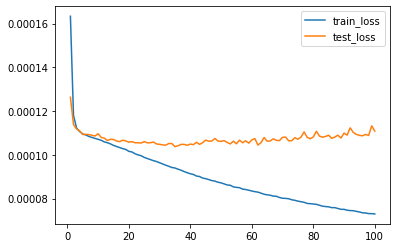

In [ ]:
# Commented out IPython magic to ensure Python compatibility.
import matplotlib.pyplot as plt
# %matplotlib inline

plt.plot(range(1,len(train_loss)+1), train_loss,label='train_loss')
plt.plot(range(1,len(train_loss)+1), test_loss,label='test_loss')
plt.legend() # Plot train_loss, test_loss of each epoch

In [ ]:
test_x.shape

(51975, 3, 20)

In [ ]:
pred_test_x = model(torch.from_numpy(test_x))

In [ ]:
pred_test_x

tensor([0.3341, 0.6052, 0.7954,  ..., 0.4899, 0.6551, 0.7196],
       grad_fn=<SqueezeBackward0>)

In [ ]:
result= []
for test_b,_ in test_dl:
    pre_b=model(test_b)
    result.append(pre_b.detach().numpy())
result[1:10]

[array([0.8575544 , 0.7796251 , 0.71030307, 0.9037341 , 0.6124394 ,
        0.61683536, 0.6407196 , 0.49738365, 0.7219921 , 0.5751661 ,
        0.60587245, 0.8806407 , 0.640109  , 0.9287232 , 0.6296172 ,
        0.6176589 , 0.6344284 , 0.872648  , 0.55155754, 0.5468316 ,
        0.5298219 , 0.94501984, 0.8677365 , 0.43631577, 0.49082452,
        0.74920464, 0.9514239 , 0.7284422 , 0.45501387, 0.57764864,
        0.8427926 , 0.5201952 , 0.47921437, 0.3679012 , 0.56716913,
        0.8308636 , 0.14174026, 0.7576527 , 0.13976145, 0.61720353,
        0.5065836 , 0.6640519 , 0.44930983, 0.3854301 , 0.6522814 ,
        0.29264325, 0.35892338, 0.48901197, 0.6708491 , 0.7944602 ,
        0.829291  , 0.70951587, 0.521186  , 0.63693947, 0.5587742 ,
        0.48061907, 0.379071  , 0.48974752, 0.83830833, 0.56124324,
        0.59623545, 0.7235694 , 0.5675815 , 0.50051   , 0.65172917,
        0.7443432 , 0.4037711 , 0.6794305 , 0.8891408 , 0.7080239 ,
        0.7283664 , 0.57398874, 0.7186448 , 0.50

# Model Comparison and Conclusion
*   Logistic Regression Model gets a result of 73.9% as our model accuracy, which is acceptable not not enough.
*   After tuning the paramaters, performance of Random Forest Model is improved. The best performance will correspond to accuracy around 99.2%.
*  The LSTM Time Series can't be evaluated with accuracy metrics, and the effect is hard to measure except for image perception. The farther back in time we pretend to predict, the worse the effect.
*  Our random forest will have the best performance. This could be due to several things: 
<br>a. We used PCA to remove the collinearity of features. 
<br>b. The essence of random forest is to make decisions constantly and select features by importance sequentially. This may match the properties of our dataset. 
*  In LSTM Model, the loss downward trend is pretty obvious. In the 1-50 epcho, it obviously shows a downward trend, while 50-100 after the loss has a small increase.
* The possible reasons include learning rate setting. Also, epcho training volume is not large enough, so the model does not nicely fit the temporal distribution of the data, which requires later adjustment of the model structure, and the selection of the amount of data, as well as the adjustment of the model parameter settings.

# Challenges and Obstacles Faced




*   Data Scraping and Aquisition: Crawling is far more daunting than we thought, and after getting the target results, it involves a lot of data connection, cleaning, and processing. In-depth data exploration need to must be performed to obtain all possible complications and corresponding solutions for each case.
*   A large number of missing values: It is due to the large number of unmatched records in the dataset after joining on public key, as data is concatenated from totally different data sources. Should the data be imputed? Should the rows with NA be dropped? What will be the impact of these processing methods on the final results? It still needs to be explored.
*   PyTorch does not come with many tuning packages such as GridSearchCV in sklearn. Due to this, in order to tune, we had to implement our own version of GridSearch, which is perhaps not as robust as the formally implemented version.



# Potential Next Steps



*   We could develop a streaming application with Apache Storm for continuous prediction of Billboard songs' ranking as more data comes in every week.
*   We could try a more robust neural network, with more hidden layers and varying activation functions.
*   We could explore more on classification, time series model and CNN model to compare and choose among them. Moreover, ensembled model can be used to reduce bias/variance.